In [1]:
import sys
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import loompy
import velocyto as vcy
import logging
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from statsmodels.nonparametric.smoothers_lowess import lowess
from scipy.interpolate import interp1d

logging.basicConfig(stream=sys.stdout, format='%(asctime)s - %(levelname)s - %(message)s', level=logging.DEBUG)
%matplotlib inline
plt.rcParams['pdf.fonttype'] = 42

2025-05-18 19:54:15,790 - DEBUG - Loaded backend module://matplotlib_inline.backend_inline version unknown.
2025-05-18 19:54:15,792 - DEBUG - Loaded backend inline version unknown.


In [2]:
import warnings
warnings.filterwarnings('ignore')
import logging
import matplotlib
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)
matplotlib.set_loglevel("error")  # for matplotlib >=3.2

In [3]:
import velocyto as vcy
vlm = vcy.VelocytoLoom("/home/rstudio/run070/run070.loom")

2025-05-18 19:54:15,826 - DEBUG - Creating converter from 3 to 5


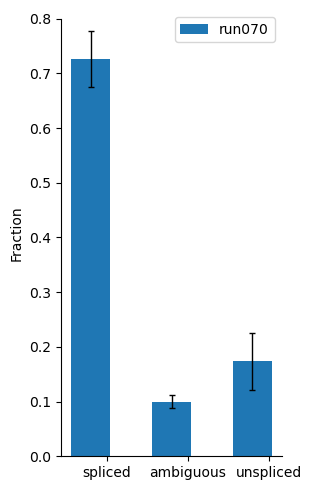

In [4]:
vlm.plot_fractions()

In [5]:
import numpy as np
vlm.filter_cells(bool_array=vlm.initial_Ucell_size > np.percentile(vlm.initial_Ucell_size, 0.5))

##### Scatter plot of spliced vs unspliced counts per cell
Red and black lines are thresholds
Red is fixed quality thresholds (spliced > 2000, unspliced > 300)
Black is data-driven (8th percentile) for flexible filtering
Ensures sufficient transcriptional activity for modelling velocity

Text(0, 0.5, 'unspliced')

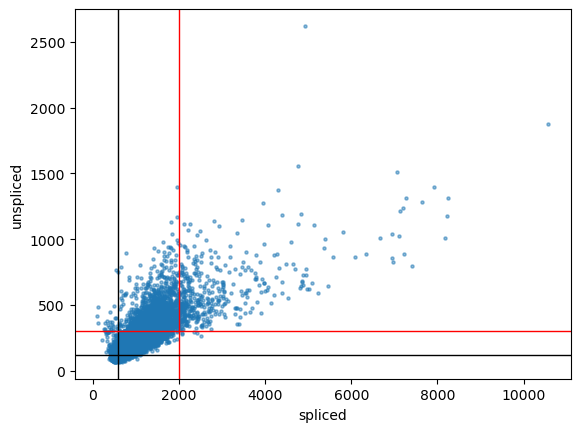

In [6]:
plt.scatter(vlm.initial_cell_size, vlm.initial_Ucell_size, alpha=0.5, s=5)
plt.axvline(2000, c="r", lw=1)
plt.axvline(np.percentilercentile(vlm.initial_cell_size, 8), c="k", lw=1)
plt.axhline(300, c="r", lw=1)
plt.axhline(np.percentile(vlm.initial_Ucell_size, 8), c="k", lw=1)
plt.xlabel("spliced"); plt.ylabel("unspliced")

In [7]:
# More filtering based on the red line ## Ensures downstream accuracy
vlm.filter_cells(bool_array=(vlm.initial_Ucell_size > 300) & (vlm.initial_cell_size > 2000))

In [120]:
# Cells with very few unspliced reads may have unreliable velocity estimates and should be excluded

In [8]:
import scanpy as sc
import scvelo as scv

In [9]:
scv.set_figure_params()

In [10]:
#Loading the .loom file into AnnData ## also other ways are there to load
adata = sc.read_loom('/home/rstudio/run070/run070.loom')

In [11]:
adata

AnnData object with n_obs × n_vars = 5755 × 62757
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [12]:
# Genes
print(adata.var_names)

# Cells
print(adata.obs_names)

Index(['ENSG00000278704', 'ENSG00000277400', 'MAFIP', 'Y_RNA',
       'ENSG00000276256', 'Y_RNA', 'ENSG00000277630', 'U6', 'U2',
       'ENSG00000278384',
       ...
       'ANKRD36P1', 'ENSG00000277146', 'TPTE2P4', 'CYCSP49', 'CTBP2P1',
       'DPH3P2', 'VAMP7', 'IL9R', 'ENSG00000270726', 'WASH6P'],
      dtype='object', name='Gene', length=62757)
Index(['run070:10716173x', 'run070:10859600x', 'run070:10862797x',
       'run070:10418826x', 'run070:10279533x', 'run070:10861766x',
       'run070:10648721x', 'run070:10144944x', 'run070:10268955x',
       'run070:10283218x',
       ...
       'run070:9975244x', 'run070:9901864x', 'run070:9798058x',
       'run070:9739678x', 'run070:9933525x', 'run070:9847626x',
       'run070:9804041x', 'run070:9691523x', 'run070:9701262x',
       'run070:9838610x'],
      dtype='object', name='CellID', length=5755)


In [13]:
# All available annotations
#print(adata.layers.head())
print(adata.var.head())

                         Accession  Chromosome     End  Start Strand
Gene                                                                
ENSG00000278704  ENSG00000278704.1  GL000009.2   58376  56140      -
ENSG00000277400  ENSG00000277400.1  GL000194.1  115018  53590      -
MAFIP            ENSG00000274847.1  GL000194.1  115055  53594      -
Y_RNA            ENSG00000277428.1  GL000195.1   37534  37434      -
ENSG00000276256  ENSG00000276256.1  GL000195.1   49164  42939      -


In [14]:
# here extracting the exp. layers
spliced = adata.layers['spliced']        # Spliced counts
unspliced = adata.layers['unspliced']    # Unspliced counts
ambiguous = adata.layers['ambiguous']    # Ambiguous counts
matrix = adata.layers['matrix']          # Main or total counts

In [15]:
matrix.shape

(5755, 62757)

In [16]:
#vlm.ca ## cell anno.

In [17]:
print(adata.layers.keys())

KeysView(Layers with keys: matrix, ambiguous, spliced, unspliced)


# scVelo

In [18]:
scv.settings.verbosity = 0

In [19]:
scv.pp.filter_and_normalize(adata)

/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


In [20]:
scv.pp.moments(adata) # first and second-order moments (mean and uncentered variance) across neighboring cells. ## useful for velocity smoothing in graph-based models, capturing local structure in the data.

/tmp/ipykernel_28235/3618267578.py:1: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(adata)
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/preprocessing/neighbors.py:233: DeprecationWarning: Automatic computation of PCA is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute PCA with Scanpy first.
  _set_pca(adata=adata, n_pcs=n_pcs, use_highly_variable=use_highly_variable)


2025-05-18 19:54:39,215 - DEBUG - bytecode dump:
>          0	NOP(arg=None, lineno=40)
           2	LOAD_FAST(arg=0, lineno=53)
           4	LOAD_CONST(arg=1, lineno=53)
           6	BINARY_SUBSCR(arg=None, lineno=53)
           8	LOAD_CONST(arg=2, lineno=53)
          10	BINARY_AND(arg=None, lineno=53)
          12	LOAD_CONST(arg=3, lineno=53)
          14	BINARY_LSHIFT(arg=None, lineno=53)
          16	LOAD_CONST(arg=4, lineno=53)
          18	BINARY_AND(arg=None, lineno=53)
          20	LOAD_FAST(arg=0, lineno=54)
          22	LOAD_CONST(arg=1, lineno=54)
          24	BINARY_SUBSCR(arg=None, lineno=54)
          26	LOAD_CONST(arg=5, lineno=54)
          28	BINARY_LSHIFT(arg=None, lineno=54)
          30	LOAD_CONST(arg=4, lineno=54)
          32	BINARY_AND(arg=None, lineno=54)
          34	LOAD_FAST(arg=0, lineno=54)
          36	LOAD_CONST(arg=1, lineno=54)
          38	BINARY_SUBSCR(arg=None, lineno=54)
          40	BINARY_XOR(arg=None, lineno=54)
          42	LOAD_CONST(arg=6, lin

2025-05-18 19:54:39,226 - DEBUG - dispatch pc=48, inst=LOAD_FAST(arg=0, lineno=53)
2025-05-18 19:54:39,226 - DEBUG - stack ['$46binary_xor.22']
2025-05-18 19:54:39,226 - DEBUG - dispatch pc=50, inst=LOAD_CONST(arg=1, lineno=53)
2025-05-18 19:54:39,226 - DEBUG - stack ['$46binary_xor.22', '$state48.23']
2025-05-18 19:54:39,226 - DEBUG - dispatch pc=52, inst=STORE_SUBSCR(arg=None, lineno=53)
2025-05-18 19:54:39,226 - DEBUG - stack ['$46binary_xor.22', '$state48.23', '$const50.24.1']
2025-05-18 19:54:39,226 - DEBUG - dispatch pc=54, inst=LOAD_FAST(arg=0, lineno=56)
2025-05-18 19:54:39,227 - DEBUG - stack []
2025-05-18 19:54:39,227 - DEBUG - dispatch pc=56, inst=LOAD_CONST(arg=7, lineno=56)
2025-05-18 19:54:39,227 - DEBUG - stack ['$state54.25']
2025-05-18 19:54:39,227 - DEBUG - dispatch pc=58, inst=BINARY_SUBSCR(arg=None, lineno=56)
2025-05-18 19:54:39,227 - DEBUG - stack ['$state54.25', '$const56.26.7']
2025-05-18 19:54:39,227 - DEBUG - dispatch pc=60, inst=LOAD_CONST(arg=8, lineno=56)
2

2025-05-18 19:54:39,237 - DEBUG - dispatch pc=146, inst=LOAD_CONST(arg=15, lineno=60)
2025-05-18 19:54:39,237 - DEBUG - stack ['$122binary_and.58', '$144binary_xor.69']
2025-05-18 19:54:39,237 - DEBUG - dispatch pc=148, inst=BINARY_RSHIFT(arg=None, lineno=60)
2025-05-18 19:54:39,237 - DEBUG - stack ['$122binary_and.58', '$144binary_xor.69', '$const146.70.15']
2025-05-18 19:54:39,237 - DEBUG - dispatch pc=150, inst=BINARY_XOR(arg=None, lineno=59)
2025-05-18 19:54:39,237 - DEBUG - stack ['$122binary_and.58', '$148binary_rshift.71']
2025-05-18 19:54:39,238 - DEBUG - dispatch pc=152, inst=LOAD_FAST(arg=0, lineno=59)
2025-05-18 19:54:39,238 - DEBUG - stack ['$150binary_xor.72']
2025-05-18 19:54:39,238 - DEBUG - dispatch pc=154, inst=LOAD_CONST(arg=10, lineno=59)
2025-05-18 19:54:39,238 - DEBUG - stack ['$150binary_xor.72', '$state152.73']
2025-05-18 19:54:39,238 - DEBUG - dispatch pc=156, inst=STORE_SUBSCR(arg=None, lineno=59)
2025-05-18 19:54:39,238 - DEBUG - stack ['$150binary_xor.72', '$

2025-05-18 19:54:39,243 - DEBUG - label 0:
    state = arg(0, name=state)               ['state']
    $const4.1.1 = const(int, 0)              ['$const4.1.1']
    $6binary_subscr.2 = getitem(value=state, index=$const4.1.1, fn=<built-in function getitem>) ['$6binary_subscr.2', '$const4.1.1', 'state']
    $const8.3.2 = const(int, 4294967294)     ['$const8.3.2']
    $10binary_and.4 = $6binary_subscr.2 & $const8.3.2 ['$10binary_and.4', '$6binary_subscr.2', '$const8.3.2']
    $const12.5.3 = const(int, 12)            ['$const12.5.3']
    $14binary_lshift.6 = $10binary_and.4 << $const12.5.3 ['$10binary_and.4', '$14binary_lshift.6', '$const12.5.3']
    $const16.7.4 = const(int, 4294967295)    ['$const16.7.4']
    $18binary_and.8 = $14binary_lshift.6 & $const16.7.4 ['$14binary_lshift.6', '$18binary_and.8', '$const16.7.4']
    $const22.10.1 = const(int, 0)            ['$const22.10.1']
    $24binary_subscr.11 = getitem(value=state, index=$const22.10.1, fn=<built-in function getitem>) ['$24binary_

2025-05-18 19:54:39,246 - DEBUG - on stmt: $10binary_and.4 = $6binary_subscr.2 & $const8.3.2
2025-05-18 19:54:39,247 - DEBUG - on stmt: $const12.5.3 = const(int, 12)
2025-05-18 19:54:39,247 - DEBUG - on stmt: $14binary_lshift.6 = $10binary_and.4 << $const12.5.3
2025-05-18 19:54:39,247 - DEBUG - on stmt: $const16.7.4 = const(int, 4294967295)
2025-05-18 19:54:39,247 - DEBUG - on stmt: $18binary_and.8 = $14binary_lshift.6 & $const16.7.4
2025-05-18 19:54:39,247 - DEBUG - on stmt: $const22.10.1 = const(int, 0)
2025-05-18 19:54:39,247 - DEBUG - on stmt: $24binary_subscr.11 = static_getitem(value=state, index=0, index_var=$const22.10.1, fn=<built-in function getitem>)
2025-05-18 19:54:39,247 - DEBUG - on stmt: $const26.12.5 = const(int, 13)
2025-05-18 19:54:39,247 - DEBUG - on stmt: $28binary_lshift.13 = $24binary_subscr.11 << $const26.12.5
2025-05-18 19:54:39,247 - DEBUG - on stmt: $const30.14.4 = const(int, 4294967295)
2025-05-18 19:54:39,248 - DEBUG - on stmt: $32binary_and.15 = $28binary_

2025-05-18 19:54:39,256 - DEBUG - SSA violators <numba.core.utils.OrderedSet object at 0x7068359b94e0>
2025-05-18 19:54:39,306 - DEBUG - bytecode dump:
>          0	NOP(arg=None, lineno=66)
           2	LOAD_GLOBAL(arg=0, lineno=79)
           4	LOAD_FAST(arg=0, lineno=79)
           6	CALL_FUNCTION(arg=1, lineno=79)
           8	STORE_FAST(arg=1, lineno=79)
          10	LOAD_GLOBAL(arg=1, lineno=80)
          12	LOAD_GLOBAL(arg=2, lineno=80)
          14	LOAD_FAST(arg=1, lineno=80)
          16	CALL_FUNCTION(arg=1, lineno=80)
          18	LOAD_CONST(arg=1, lineno=80)
          20	BINARY_TRUE_DIVIDE(arg=None, lineno=80)
          22	CALL_FUNCTION(arg=1, lineno=80)
          24	RETURN_VALUE(arg=None, lineno=80)
2025-05-18 19:54:39,307 - DEBUG - pending: deque([State(pc_initial=0 nstack_initial=0)])
2025-05-18 19:54:39,307 - DEBUG - stack: []
2025-05-18 19:54:39,307 - DEBUG - state.pc_initial: State(pc_initial=0 nstack_initial=0)
2025-05-18 19:54:39,308 - DEBUG - dispatch pc=0, inst=NOP(

2025-05-18 19:54:39,315 - DEBUG - SSA violators <numba.core.utils.OrderedSet object at 0x706830d6b0d0>
2025-05-18 19:54:39,353 - DEBUG - bytecode dump:
>          0	NOP(arg=None, lineno=44)
           2	LOAD_CONST(arg=1, lineno=66)
           4	STORE_FAST(arg=2, lineno=66)
           6	LOAD_FAST(arg=0, lineno=67)
           8	LOAD_ATTR(arg=0, lineno=67)
          10	LOAD_CONST(arg=2, lineno=67)
          12	BINARY_SUBSCR(arg=None, lineno=67)
          14	STORE_FAST(arg=3, lineno=67)
          16	LOAD_GLOBAL(arg=1, lineno=68)
          18	LOAD_FAST(arg=3, lineno=68)
          20	CALL_FUNCTION(arg=1, lineno=68)
          22	GET_ITER(arg=None, lineno=68)
>         24	FOR_ITER(arg=16, lineno=68)
          26	STORE_FAST(arg=4, lineno=68)
          28	LOAD_FAST(arg=0, lineno=69)
          30	LOAD_FAST(arg=4, lineno=69)
          32	BINARY_SUBSCR(arg=None, lineno=69)
          34	LOAD_FAST(arg=1, lineno=69)
          36	LOAD_FAST(arg=4, lineno=69)
          38	BINARY_SUBSCR(arg=None, lineno=6

2025-05-18 19:54:39,369 - DEBUG - phismap: defaultdict(<class 'set'>,
            {'$phi24.0': {('$22get_iter.8',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi26.0', State(pc_initial=26 nstack_initial=2))},
             '$phi26.0': {('$phi24.0', State(pc_initial=24 nstack_initial=1))},
             '$phi26.1': {('$24for_iter.2',
                           State(pc_initial=24 nstack_initial=1))}})
2025-05-18 19:54:39,369 - DEBUG - changing phismap: defaultdict(<class 'set'>,
            {'$phi24.0': {('$22get_iter.8',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi24.0', State(pc_initial=24 nstack_initial=1))},
             '$phi26.0': {('$22get_iter.8',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi26.1': {('$24for_iter.2',
                           State(pc_initial=24 nstack_initial=1))}})
2025-05-18 19:54:39,369 - DEBUG - changing phismap: de

2025-05-18 19:54:39,375 - DEBUG - Running <numba.core.ssa._GatherDefsHandler object at 0x706827419930>
2025-05-18 19:54:39,376 - DEBUG - on stmt: $24for_iter.1 = iternext(value=$phi24.0)
2025-05-18 19:54:39,376 - DEBUG - on stmt: $24for_iter.2 = pair_first(value=$24for_iter.1)
2025-05-18 19:54:39,376 - DEBUG - on stmt: $24for_iter.3 = pair_second(value=$24for_iter.1)
2025-05-18 19:54:39,376 - DEBUG - on stmt: $phi26.1 = $24for_iter.2
2025-05-18 19:54:39,376 - DEBUG - on stmt: branch $24for_iter.3, 26, 58
2025-05-18 19:54:39,376 - DEBUG - ==== SSA block analysis pass on 26
2025-05-18 19:54:39,376 - DEBUG - Running <numba.core.ssa._GatherDefsHandler object at 0x706827419930>
2025-05-18 19:54:39,376 - DEBUG - on stmt: i = $phi26.1
2025-05-18 19:54:39,377 - DEBUG - on stmt: $32binary_subscr.4 = getitem(value=x, index=i, fn=<built-in function getitem>)
2025-05-18 19:54:39,377 - DEBUG - on stmt: $38binary_subscr.7 = getitem(value=y, index=i, fn=<built-in function getitem>)
2025-05-18 19:54:3

2025-05-18 19:54:39,384 - DEBUG - on stmt: $8load_attr.2 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,384 - DEBUG - on stmt: $const10.3.2 = const(int, 0)
2025-05-18 19:54:39,384 - DEBUG - on stmt: dim = static_getitem(value=$8load_attr.2, index=0, index_var=$const10.3.2, fn=<built-in function getitem>)
2025-05-18 19:54:39,384 - DEBUG - on stmt: $16load_global.5 = global(range: <class 'range'>)
2025-05-18 19:54:39,384 - DEBUG - on stmt: $20call_function.7 = call $16load_global.5(dim, func=$16load_global.5, args=[Var(dim, distances.py:67)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:39,384 - DEBUG - on stmt: $22get_iter.8 = getiter(value=$20call_function.7)
2025-05-18 19:54:39,384 - DEBUG - on stmt: $phi24.0 = $22get_iter.8
2025-05-18 19:54:39,385 - DEBUG - on stmt: jump 24
2025-05-18 19:54:39,385 - DEBUG - ==== SSA block rewrite pass on 24
2025-05-18 19:54:39,385 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706827419c00>
2025-05-18 19:54:39,385 

2025-05-18 19:54:39,425 - DEBUG - stack: []
2025-05-18 19:54:39,425 - DEBUG - state.pc_initial: State(pc_initial=58 nstack_initial=0)
2025-05-18 19:54:39,425 - DEBUG - dispatch pc=58, inst=LOAD_FAST(arg=2, lineno=72)
2025-05-18 19:54:39,425 - DEBUG - stack []
2025-05-18 19:54:39,425 - DEBUG - dispatch pc=60, inst=RETURN_VALUE(arg=None, lineno=72)
2025-05-18 19:54:39,425 - DEBUG - stack ['$result58.0']
2025-05-18 19:54:39,425 - DEBUG - end state. edges=[]
2025-05-18 19:54:39,425 - DEBUG - pending: deque([State(pc_initial=26 nstack_initial=2)])
2025-05-18 19:54:39,426 - DEBUG - stack: ['$phi26.0', '$phi26.1']
2025-05-18 19:54:39,426 - DEBUG - state.pc_initial: State(pc_initial=26 nstack_initial=2)
2025-05-18 19:54:39,426 - DEBUG - dispatch pc=26, inst=STORE_FAST(arg=4, lineno=68)
2025-05-18 19:54:39,426 - DEBUG - stack ['$phi26.0', '$phi26.1']
2025-05-18 19:54:39,426 - DEBUG - dispatch pc=28, inst=LOAD_FAST(arg=0, lineno=69)
2025-05-18 19:54:39,426 - DEBUG - stack ['$phi26.0']
2025-05-18

2025-05-18 19:54:39,431 - DEBUG - block_infos State(pc_initial=58 nstack_initial=0):
AdaptBlockInfo(insts=((58, {'res': '$result58.0'}), (60, {'retval': '$result58.0', 'castval': '$60return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
2025-05-18 19:54:39,432 - DEBUG - label 0:
    x = arg(0, name=x)                       ['x']
    y = arg(1, name=y)                       ['y']
    result = const(float, 0.0)               ['result']
    $8load_attr.2 = getattr(value=x, attr=shape) ['$8load_attr.2', 'x']
    $const10.3.2 = const(int, 0)             ['$const10.3.2']
    dim = getitem(value=$8load_attr.2, index=$const10.3.2, fn=<built-in function getitem>) ['$8load_attr.2', '$const10.3.2', 'dim']
    $16load_global.5 = global(range: <class 'range'>) ['$16load_global.5']
    $20call_function.7 = call $16load_global.5(dim, func=$16load_global.5, args=[Var(dim, distances.py:67)], kws=(), vararg=None, varkwarg=None, target=None) ['$16load_global.

2025-05-18 19:54:39,440 - DEBUG - Fix SSA violator on var result
2025-05-18 19:54:39,440 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,440 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706827262c50>
2025-05-18 19:54:39,440 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,440 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,441 - DEBUG - on stmt: result = const(float, 0.0)
2025-05-18 19:54:39,441 - DEBUG - first assign: result
2025-05-18 19:54:39,441 - DEBUG - replaced with: result = const(float, 0.0)
2025-05-18 19:54:39,441 - DEBUG - on stmt: $8load_attr.2 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,441 - DEBUG - on stmt: $const10.3.2 = const(int, 0)
2025-05-18 19:54:39,441 - DEBUG - on stmt: dim = static_getitem(value=$8load_attr.2, index=0, index_var=$const10.3.2, fn=<built-in function getitem>)
2025-05-18 19:54:39,441 - DEBUG - on stmt: $16load_global.5 = global(range: <class 'range'>)
2025-05-18 19:54:39,441 - DEBUG - on st

2025-05-18 19:54:39,482 - DEBUG - pending: deque([State(pc_initial=0 nstack_initial=0)])
2025-05-18 19:54:39,482 - DEBUG - stack: []
2025-05-18 19:54:39,482 - DEBUG - state.pc_initial: State(pc_initial=0 nstack_initial=0)
2025-05-18 19:54:39,482 - DEBUG - dispatch pc=0, inst=NOP(arg=None, lineno=224)
2025-05-18 19:54:39,483 - DEBUG - stack []
2025-05-18 19:54:39,483 - DEBUG - dispatch pc=2, inst=LOAD_CONST(arg=1, lineno=244)
2025-05-18 19:54:39,483 - DEBUG - stack []
2025-05-18 19:54:39,483 - DEBUG - dispatch pc=4, inst=STORE_FAST(arg=2, lineno=244)
2025-05-18 19:54:39,483 - DEBUG - stack ['$const2.0.1']
2025-05-18 19:54:39,483 - DEBUG - dispatch pc=6, inst=LOAD_CONST(arg=1, lineno=245)
2025-05-18 19:54:39,484 - DEBUG - stack []
2025-05-18 19:54:39,484 - DEBUG - dispatch pc=8, inst=STORE_FAST(arg=3, lineno=245)
2025-05-18 19:54:39,484 - DEBUG - stack ['$const6.1.1']
2025-05-18 19:54:39,484 - DEBUG - dispatch pc=10, inst=LOAD_FAST(arg=0, lineno=246)
2025-05-18 19:54:39,484 - DEBUG - sta

2025-05-18 19:54:39,496 - DEBUG - stack ['$96load_method.1']
2025-05-18 19:54:39,496 - DEBUG - dispatch pc=100, inst=LOAD_FAST(arg=2, lineno=256)
2025-05-18 19:54:39,496 - DEBUG - stack ['$96load_method.1', '$num_equal98.2']
2025-05-18 19:54:39,496 - DEBUG - dispatch pc=102, inst=BINARY_TRUE_DIVIDE(arg=None, lineno=256)
2025-05-18 19:54:39,496 - DEBUG - stack ['$96load_method.1', '$num_equal98.2', '$num_non_zero100.3']
2025-05-18 19:54:39,497 - DEBUG - dispatch pc=104, inst=CALL_METHOD(arg=1, lineno=256)
2025-05-18 19:54:39,497 - DEBUG - stack ['$96load_method.1', '$102binary_true_divide.4']
2025-05-18 19:54:39,497 - DEBUG - dispatch pc=106, inst=UNARY_NEGATIVE(arg=None, lineno=256)
2025-05-18 19:54:39,497 - DEBUG - stack ['$104call_method.5']
2025-05-18 19:54:39,497 - DEBUG - dispatch pc=108, inst=RETURN_VALUE(arg=None, lineno=256)
2025-05-18 19:54:39,497 - DEBUG - stack ['$106unary_negative.6']
2025-05-18 19:54:39,498 - DEBUG - end state. edges=[]
2025-05-18 19:54:39,498 - DEBUG - pe

2025-05-18 19:54:39,504 - DEBUG - changing phismap: defaultdict(<class 'set'>,
            {'$phi28.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi30.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi30.1': {('$28for_iter.2',
                           State(pc_initial=28 nstack_initial=1))},
             '$phi62.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi62.1': {('$num_non_zero56.12',
                           State(pc_initial=30 nstack_initial=2))},
             '$phi64.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi64.1': {('$num_non_zero56.12',
                           State(pc_initial=30 nstack_initial=2))},
             '$phi64.2': {('$x_true58.13',
                           State(pc_initial=30 nstack_initial=2)),
                     

2025-05-18 19:54:39,506 - DEBUG - block_infos State(pc_initial=76 nstack_initial=3):
AdaptBlockInfo(insts=((76, {'lhs': '$phi76.1', 'rhs': '$phi76.2', 'res': '$76inplace_add.3'}), (78, {'value': '$76inplace_add.3'}), (80, {})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={28: ('$phi76.0',)})
2025-05-18 19:54:39,506 - DEBUG - block_infos State(pc_initial=82 nstack_initial=0):
AdaptBlockInfo(insts=((82, {'res': '$num_non_zero82.0'}), (84, {'res': '$const84.1.1'}), (86, {'lhs': '$num_non_zero82.0', 'rhs': '$const84.1.1', 'res': '$86compare_op.2'}), (88, {'pred': '$86compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={90: (), 94: ()})
2025-05-18 19:54:39,506 - DEBUG - block_infos State(pc_initial=90 nstack_initial=0):
AdaptBlockInfo(insts=((90, {'res': '$const90.0.1'}), (92, {'retval': '$const90.0.1', 'castval': '$92return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
2

2025-05-18 19:54:39,512 - DEBUG - on stmt: jump 28
2025-05-18 19:54:39,513 - DEBUG - ==== SSA block analysis pass on 28
2025-05-18 19:54:39,518 - DEBUG - Running <numba.core.ssa._GatherDefsHandler object at 0x7068272dcd00>
2025-05-18 19:54:39,518 - DEBUG - on stmt: $28for_iter.1 = iternext(value=$phi28.0)
2025-05-18 19:54:39,518 - DEBUG - on stmt: $28for_iter.2 = pair_first(value=$28for_iter.1)
2025-05-18 19:54:39,518 - DEBUG - on stmt: $28for_iter.3 = pair_second(value=$28for_iter.1)
2025-05-18 19:54:39,519 - DEBUG - on stmt: $phi30.1 = $28for_iter.2
2025-05-18 19:54:39,519 - DEBUG - on stmt: branch $28for_iter.3, 30, 82
2025-05-18 19:54:39,519 - DEBUG - ==== SSA block analysis pass on 30
2025-05-18 19:54:39,519 - DEBUG - Running <numba.core.ssa._GatherDefsHandler object at 0x7068272dcd00>
2025-05-18 19:54:39,519 - DEBUG - on stmt: i = $phi30.1
2025-05-18 19:54:39,519 - DEBUG - on stmt: $36binary_subscr.4 = getitem(value=x, index=i, fn=<built-in function getitem>)
2025-05-18 19:54:39,

2025-05-18 19:54:39,528 - DEBUG - SSA violators <numba.core.utils.OrderedSet object at 0x7068272dcd00>
2025-05-18 19:54:39,528 - DEBUG - Fix SSA violator on var num_non_zero
2025-05-18 19:54:39,528 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,528 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x7068272fac80>
2025-05-18 19:54:39,528 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,528 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,528 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,529 - DEBUG - first assign: num_non_zero
2025-05-18 19:54:39,529 - DEBUG - replaced with: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,529 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,529 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,529 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,529 - DEBUG - on stmt: dim = static_getitem(value=$12load_att

2025-05-18 19:54:39,541 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,541 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,541 - DEBUG - on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4.2, fn=<built-in function getitem>)
2025-05-18 19:54:39,541 - DEBUG - on stmt: $20load_global.6 = global(range: <class 'range'>)
2025-05-18 19:54:39,541 - DEBUG - on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:246)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:39,542 - DEBUG - on stmt: $26get_iter.9 = getiter(value=$24call_function.8)
2025-05-18 19:54:39,542 - DEBUG - on stmt: $phi28.0 = $26get_iter.9
2025-05-18 19:54:39,542 - DEBUG - on stmt: jump 28
2025-05-18 19:54:39,542 - DEBUG - ==== SSA block rewrite pass on 28
2025-05-18 19:54:39,542 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x7068272fac80>
2025-05-18 19:54:39,5

2025-05-18 19:54:39,556 - DEBUG - on stmt: $106unary_negative.6 = unary(fn=<built-in function neg>, value=$104call_method.5)
2025-05-18 19:54:39,557 - DEBUG - on stmt: $108return_value.7 = cast(value=$106unary_negative.6)
2025-05-18 19:54:39,557 - DEBUG - on stmt: return $108return_value.7
2025-05-18 19:54:39,557 - DEBUG - Fix SSA violator on var num_equal
2025-05-18 19:54:39,557 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,557 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x7068272dc5b0>
2025-05-18 19:54:39,557 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,557 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,557 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,558 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,558 - DEBUG - first assign: num_equal
2025-05-18 19:54:39,558 - DEBUG - replaced with: num_equal = const(float, 0.0)
2025-05-18 19:54:39,558 - DEBUG - on stmt: $12load_attr.3 = get

2025-05-18 19:54:39,571 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x7068272fac80>
2025-05-18 19:54:39,571 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,571 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,571 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,572 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,572 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,572 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,572 - DEBUG - on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4.2, fn=<built-in function getitem>)
2025-05-18 19:54:39,572 - DEBUG - on stmt: $20load_global.6 = global(range: <class 'range'>)
2025-05-18 19:54:39,572 - DEBUG - on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:246)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:39,572 - DE

2025-05-18 19:54:39,586 - DEBUG - on stmt: $104call_method.5 = call $96load_method.1($102binary_true_divide.4, func=$96load_method.1, args=[Var($102binary_true_divide.4, distances.py:256)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:39,586 - DEBUG - on stmt: $106unary_negative.6 = unary(fn=<built-in function neg>, value=$104call_method.5)
2025-05-18 19:54:39,586 - DEBUG - on stmt: $108return_value.7 = cast(value=$106unary_negative.6)
2025-05-18 19:54:39,586 - DEBUG - on stmt: return $108return_value.7
2025-05-18 19:54:39,586 - DEBUG - Fix SSA violator on var $phi64.2
2025-05-18 19:54:39,587 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,587 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x7068272f9390>
2025-05-18 19:54:39,587 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,587 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,587 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,587 - DEBUG - o

2025-05-18 19:54:39,599 - DEBUG - Replaced assignments: defaultdict(<class 'list'>,
            {30: [<numba.core.ir.Assign object at 0x7068272f9e40>],
             62: [<numba.core.ir.Assign object at 0x7068272b03d0>]})
2025-05-18 19:54:39,599 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,599 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x7068272fac80>
2025-05-18 19:54:39,599 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,599 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,599 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,600 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,600 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,600 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,600 - DEBUG - on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4.2, fn=<built-in function getitem>)
2025-05-18 19:54:39,600 - DEBUG

2025-05-18 19:54:39,610 - DEBUG - on stmt: $108return_value.7 = cast(value=$106unary_negative.6)
2025-05-18 19:54:39,610 - DEBUG - on stmt: return $108return_value.7
2025-05-18 19:54:39,610 - DEBUG - Fix SSA violator on var $phi76.2
2025-05-18 19:54:39,610 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,610 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x7068272dc460>
2025-05-18 19:54:39,610 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,611 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,611 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,611 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,611 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,611 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,611 - DEBUG - on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4.2, fn=<built-in function getitem>)
2025-05-18 19:

2025-05-18 19:54:39,626 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,626 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x70682741ab60>
2025-05-18 19:54:39,626 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,626 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,626 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,626 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,626 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,627 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,627 - DEBUG - on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4.2, fn=<built-in function getitem>)
2025-05-18 19:54:39,627 - DEBUG - on stmt: $20load_global.6 = global(range: <class 'range'>)
2025-05-18 19:54:39,627 - DEBUG - on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:246)], kws=(), va

2025-05-18 19:54:39,640 - DEBUG - on stmt: $108return_value.7 = cast(value=$106unary_negative.6)
2025-05-18 19:54:39,640 - DEBUG - on stmt: return $108return_value.7
2025-05-18 19:54:39,681 - DEBUG - bytecode dump:
>          0	NOP(arg=None, lineno=224)
           2	LOAD_CONST(arg=1, lineno=244)
           4	STORE_FAST(arg=2, lineno=244)
           6	LOAD_CONST(arg=1, lineno=245)
           8	STORE_FAST(arg=3, lineno=245)
          10	LOAD_FAST(arg=0, lineno=246)
          12	LOAD_ATTR(arg=0, lineno=246)
          14	LOAD_CONST(arg=2, lineno=246)
          16	BINARY_SUBSCR(arg=None, lineno=246)
          18	STORE_FAST(arg=4, lineno=246)
          20	LOAD_GLOBAL(arg=1, lineno=247)
          22	LOAD_FAST(arg=4, lineno=247)
          24	CALL_FUNCTION(arg=1, lineno=247)
          26	GET_ITER(arg=None, lineno=247)
>         28	FOR_ITER(arg=26, lineno=247)
          30	STORE_FAST(arg=5, lineno=247)
          32	LOAD_FAST(arg=0, lineno=248)
          34	LOAD_FAST(arg=5, lineno=248)
          

2025-05-18 19:54:39,693 - DEBUG - dispatch pc=48, inst=BINARY_SUBSCR(arg=None, lineno=249)
2025-05-18 19:54:39,693 - DEBUG - stack ['$phi30.0', '$y44.7', '$i46.8']
2025-05-18 19:54:39,693 - DEBUG - dispatch pc=50, inst=LOAD_CONST(arg=2, lineno=249)
2025-05-18 19:54:39,693 - DEBUG - stack ['$phi30.0', '$48binary_subscr.9']
2025-05-18 19:54:39,694 - DEBUG - dispatch pc=52, inst=COMPARE_OP(arg=3, lineno=249)
2025-05-18 19:54:39,694 - DEBUG - stack ['$phi30.0', '$48binary_subscr.9', '$const50.10.2']
2025-05-18 19:54:39,694 - DEBUG - dispatch pc=54, inst=STORE_FAST(arg=7, lineno=249)
2025-05-18 19:54:39,694 - DEBUG - stack ['$phi30.0', '$52compare_op.11']
2025-05-18 19:54:39,694 - DEBUG - dispatch pc=56, inst=LOAD_FAST(arg=2, lineno=250)
2025-05-18 19:54:39,694 - DEBUG - stack ['$phi30.0']
2025-05-18 19:54:39,694 - DEBUG - dispatch pc=58, inst=LOAD_FAST(arg=6, lineno=250)
2025-05-18 19:54:39,695 - DEBUG - stack ['$phi30.0', '$num_non_zero56.12']
2025-05-18 19:54:39,695 - DEBUG - dispatch pc

2025-05-18 19:54:39,706 - DEBUG - phismap: defaultdict(<class 'set'>,
            {'$phi28.0': {('$26get_iter.9',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi76.0', State(pc_initial=76 nstack_initial=3))},
             '$phi30.0': {('$phi28.0', State(pc_initial=28 nstack_initial=1))},
             '$phi30.1': {('$28for_iter.2',
                           State(pc_initial=28 nstack_initial=1))},
             '$phi62.0': {('$phi30.0', State(pc_initial=30 nstack_initial=2))},
             '$phi62.1': {('$num_non_zero56.12',
                           State(pc_initial=30 nstack_initial=2))},
             '$phi64.0': {('$phi30.0', State(pc_initial=30 nstack_initial=2)),
                          ('$phi62.0', State(pc_initial=62 nstack_initial=2))},
             '$phi64.1': {('$num_non_zero56.12',
                           State(pc_initial=30 nstack_initial=2)),
                          ('$phi62.1', State(pc_initial=62 nstack_initial=2)

2025-05-18 19:54:39,707 - DEBUG - new_out: defaultdict(<class 'dict'>,
            {State(pc_initial=0 nstack_initial=0): {'$phi28.0': '$26get_iter.9'},
             State(pc_initial=28 nstack_initial=1): {'$phi30.1': '$28for_iter.2'},
             State(pc_initial=30 nstack_initial=2): {'$phi64.1': '$num_non_zero56.12',
                                                     '$phi64.2': '$x_true58.13'},
             State(pc_initial=62 nstack_initial=2): {'$phi64.2': '$y_true62.2'},
             State(pc_initial=64 nstack_initial=3): {'$phi76.1': '$num_equal68.4',
                                                     '$phi76.2': '$x_true70.5'},
             State(pc_initial=74 nstack_initial=2): {'$phi76.2': '$y_true74.2'}})
2025-05-18 19:54:39,707 - DEBUG - ----------------------DONE Prune PHIs-----------------------
2025-05-18 19:54:39,707 - DEBUG - block_infos State(pc_initial=0 nstack_initial=0):
AdaptBlockInfo(insts=((0, {}), (2, {'res': '$const2.0.1'}), (4, {'value': '$const2.0.1'})

2025-05-18 19:54:39,713 - DEBUG - ==== SSA block analysis pass on 0
2025-05-18 19:54:39,713 - DEBUG - Running <numba.core.ssa._GatherDefsHandler object at 0x7068272f8070>
2025-05-18 19:54:39,713 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,713 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,713 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,714 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,714 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,714 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,714 - DEBUG - on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4.2, fn=<built-in function getitem>)
2025-05-18 19:54:39,714 - DEBUG - on stmt: $20load_global.6 = global(range: <class 'range'>)
2025-05-18 19:54:39,714 - DEBUG - on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:246)], kw

2025-05-18 19:54:39,727 - DEBUG - SSA violators <numba.core.utils.OrderedSet object at 0x706827263af0>
2025-05-18 19:54:39,727 - DEBUG - Fix SSA violator on var num_non_zero
2025-05-18 19:54:39,727 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,728 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706827245750>
2025-05-18 19:54:39,728 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,728 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,728 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,728 - DEBUG - first assign: num_non_zero
2025-05-18 19:54:39,728 - DEBUG - replaced with: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,728 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,729 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,729 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,729 - DEBUG - on stmt: dim = static_getitem(value=$12load_att

2025-05-18 19:54:39,741 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,741 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,741 - DEBUG - on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4.2, fn=<built-in function getitem>)
2025-05-18 19:54:39,741 - DEBUG - on stmt: $20load_global.6 = global(range: <class 'range'>)
2025-05-18 19:54:39,741 - DEBUG - on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:246)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:39,742 - DEBUG - on stmt: $26get_iter.9 = getiter(value=$24call_function.8)
2025-05-18 19:54:39,742 - DEBUG - on stmt: $phi28.0 = $26get_iter.9
2025-05-18 19:54:39,742 - DEBUG - on stmt: jump 28
2025-05-18 19:54:39,742 - DEBUG - ==== SSA block rewrite pass on 28
2025-05-18 19:54:39,742 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706827245750>
2025-05-18 19:54:39,7

2025-05-18 19:54:39,753 - DEBUG - on stmt: $106unary_negative.6 = unary(fn=<built-in function neg>, value=$104call_method.5)
2025-05-18 19:54:39,753 - DEBUG - on stmt: $108return_value.7 = cast(value=$106unary_negative.6)
2025-05-18 19:54:39,753 - DEBUG - on stmt: return $108return_value.7
2025-05-18 19:54:39,753 - DEBUG - Fix SSA violator on var num_equal
2025-05-18 19:54:39,754 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,754 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x7068272fae00>
2025-05-18 19:54:39,754 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,754 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,754 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,754 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,754 - DEBUG - first assign: num_equal
2025-05-18 19:54:39,754 - DEBUG - replaced with: num_equal = const(float, 0.0)
2025-05-18 19:54:39,755 - DEBUG - on stmt: $12load_attr.3 = get

2025-05-18 19:54:39,770 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706827245750>
2025-05-18 19:54:39,770 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,770 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,771 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,771 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,771 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,771 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,771 - DEBUG - on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4.2, fn=<built-in function getitem>)
2025-05-18 19:54:39,771 - DEBUG - on stmt: $20load_global.6 = global(range: <class 'range'>)
2025-05-18 19:54:39,771 - DEBUG - on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:246)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:39,771 - DE

2025-05-18 19:54:39,786 - DEBUG - on stmt: $104call_method.5 = call $96load_method.1($102binary_true_divide.4, func=$96load_method.1, args=[Var($102binary_true_divide.4, distances.py:256)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:39,786 - DEBUG - on stmt: $106unary_negative.6 = unary(fn=<built-in function neg>, value=$104call_method.5)
2025-05-18 19:54:39,786 - DEBUG - on stmt: $108return_value.7 = cast(value=$106unary_negative.6)
2025-05-18 19:54:39,786 - DEBUG - on stmt: return $108return_value.7
2025-05-18 19:54:39,786 - DEBUG - Fix SSA violator on var $phi64.2
2025-05-18 19:54:39,787 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,787 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x7068272451e0>
2025-05-18 19:54:39,787 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,787 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,787 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,787 - DEBUG - o

2025-05-18 19:54:39,800 - DEBUG - Replaced assignments: defaultdict(<class 'list'>,
            {30: [<numba.core.ir.Assign object at 0x7068272fabf0>],
             62: [<numba.core.ir.Assign object at 0x706827195ed0>]})
2025-05-18 19:54:39,800 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,800 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706827245750>
2025-05-18 19:54:39,800 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,800 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,800 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,800 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,801 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,801 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,801 - DEBUG - on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4.2, fn=<built-in function getitem>)
2025-05-18 19:54:39,801 - DEBUG

2025-05-18 19:54:39,813 - DEBUG - on stmt: $108return_value.7 = cast(value=$106unary_negative.6)
2025-05-18 19:54:39,813 - DEBUG - on stmt: return $108return_value.7
2025-05-18 19:54:39,813 - DEBUG - Fix SSA violator on var $phi76.2
2025-05-18 19:54:39,813 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,813 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x7068272f80a0>
2025-05-18 19:54:39,813 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,814 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,814 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,814 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,814 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,814 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,814 - DEBUG - on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4.2, fn=<built-in function getitem>)
2025-05-18 19:

2025-05-18 19:54:39,824 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:39,824 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x7068272f80a0>
2025-05-18 19:54:39,824 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,824 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,824 - DEBUG - on stmt: num_non_zero = const(float, 0.0)
2025-05-18 19:54:39,824 - DEBUG - on stmt: num_equal = const(float, 0.0)
2025-05-18 19:54:39,824 - DEBUG - on stmt: $12load_attr.3 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,824 - DEBUG - on stmt: $const14.4.2 = const(int, 0)
2025-05-18 19:54:39,825 - DEBUG - on stmt: dim = static_getitem(value=$12load_attr.3, index=0, index_var=$const14.4.2, fn=<built-in function getitem>)
2025-05-18 19:54:39,825 - DEBUG - on stmt: $20load_global.6 = global(range: <class 'range'>)
2025-05-18 19:54:39,825 - DEBUG - on stmt: $24call_function.8 = call $20load_global.6(dim, func=$20load_global.6, args=[Var(dim, distances.py:246)], kws=(), va

2025-05-18 19:54:39,840 - DEBUG - on stmt: $108return_value.7 = cast(value=$106unary_negative.6)
2025-05-18 19:54:39,840 - DEBUG - on stmt: return $108return_value.7
2025-05-18 19:54:39,945 - DEBUG - bytecode dump:
>          0	NOP(arg=None, lineno=411)
           2	LOAD_CONST(arg=1, lineno=429)
           4	STORE_FAST(arg=2, lineno=429)
           6	LOAD_CONST(arg=1, lineno=430)
           8	STORE_FAST(arg=3, lineno=430)
          10	LOAD_CONST(arg=1, lineno=431)
          12	STORE_FAST(arg=4, lineno=431)
          14	LOAD_FAST(arg=0, lineno=432)
          16	LOAD_ATTR(arg=0, lineno=432)
          18	LOAD_CONST(arg=2, lineno=432)
          20	BINARY_SUBSCR(arg=None, lineno=432)
          22	STORE_FAST(arg=5, lineno=432)
          24	LOAD_GLOBAL(arg=1, lineno=433)
          26	LOAD_FAST(arg=5, lineno=433)
          28	CALL_FUNCTION(arg=1, lineno=433)
          30	GET_ITER(arg=None, lineno=433)
>         32	FOR_ITER(arg=32, lineno=433)
          34	STORE_FAST(arg=6, lineno=433)
        

2025-05-18 19:54:39,953 - DEBUG - pending: deque([State(pc_initial=34 nstack_initial=2), State(pc_initial=106 nstack_initial=0), State(pc_initial=118 nstack_initial=0)])
2025-05-18 19:54:39,953 - DEBUG - stack: ['$phi34.0', '$phi34.1']
2025-05-18 19:54:39,953 - DEBUG - state.pc_initial: State(pc_initial=34 nstack_initial=2)
2025-05-18 19:54:39,953 - DEBUG - dispatch pc=34, inst=STORE_FAST(arg=6, lineno=433)
2025-05-18 19:54:39,953 - DEBUG - stack ['$phi34.0', '$phi34.1']
2025-05-18 19:54:39,953 - DEBUG - dispatch pc=36, inst=LOAD_FAST(arg=2, lineno=434)
2025-05-18 19:54:39,953 - DEBUG - stack ['$phi34.0']
2025-05-18 19:54:39,954 - DEBUG - dispatch pc=38, inst=LOAD_FAST(arg=0, lineno=434)
2025-05-18 19:54:39,954 - DEBUG - stack ['$phi34.0', '$result36.2']
2025-05-18 19:54:39,954 - DEBUG - dispatch pc=40, inst=LOAD_FAST(arg=6, lineno=434)
2025-05-18 19:54:39,954 - DEBUG - stack ['$phi34.0', '$result36.2', '$x38.3']
2025-05-18 19:54:39,954 - DEBUG - dispatch pc=42, inst=BINARY_SUBSCR(arg=

2025-05-18 19:54:39,965 - DEBUG - pending: deque([State(pc_initial=114 nstack_initial=0), State(pc_initial=118 nstack_initial=0), State(pc_initial=126 nstack_initial=0), State(pc_initial=134 nstack_initial=0)])
2025-05-18 19:54:39,965 - DEBUG - stack: []
2025-05-18 19:54:39,965 - DEBUG - state.pc_initial: State(pc_initial=114 nstack_initial=0)
2025-05-18 19:54:39,965 - DEBUG - dispatch pc=114, inst=LOAD_CONST(arg=1, lineno=439)
2025-05-18 19:54:39,965 - DEBUG - stack []
2025-05-18 19:54:39,965 - DEBUG - dispatch pc=116, inst=RETURN_VALUE(arg=None, lineno=439)
2025-05-18 19:54:39,965 - DEBUG - stack ['$const114.0.1']
2025-05-18 19:54:39,965 - DEBUG - end state. edges=[]
2025-05-18 19:54:39,966 - DEBUG - pending: deque([State(pc_initial=118 nstack_initial=0), State(pc_initial=126 nstack_initial=0), State(pc_initial=134 nstack_initial=0)])
2025-05-18 19:54:39,966 - DEBUG - pending: deque([State(pc_initial=126 nstack_initial=0), State(pc_initial=134 nstack_initial=0)])
2025-05-18 19:54:39,

2025-05-18 19:54:39,976 - DEBUG - changing phismap: defaultdict(<class 'set'>,
            {'$phi32.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.1': {('$32for_iter.2',
                           State(pc_initial=32 nstack_initial=1))}})
2025-05-18 19:54:39,976 - DEBUG - changing phismap: defaultdict(<class 'set'>,
            {'$phi32.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.0': {('$30get_iter.10',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi34.1': {('$32for_iter.2',
                           State(pc_initial=32 nstack_initial=1))}})
2025-05-18 19:54:39,976 - DEBUG - keep phismap: {'$phi32.0': {('$30get_iter.10', State(pc_initial=0 nstack_initial=0))},
 '$phi34.1': {('$32for_iter.2', State(pc_initia

2025-05-18 19:54:39,979 - DEBUG - label 0:
    x = arg(0, name=x)                       ['x']
    y = arg(1, name=y)                       ['y']
    result = const(float, 0.0)               ['result']
    norm_x = const(float, 0.0)               ['norm_x']
    norm_y = const(float, 0.0)               ['norm_y']
    $16load_attr.4 = getattr(value=x, attr=shape) ['$16load_attr.4', 'x']
    $const18.5.2 = const(int, 0)             ['$const18.5.2']
    dim = getitem(value=$16load_attr.4, index=$const18.5.2, fn=<built-in function getitem>) ['$16load_attr.4', '$const18.5.2', 'dim']
    $24load_global.7 = global(range: <class 'range'>) ['$24load_global.7']
    $28call_function.9 = call $24load_global.7(dim, func=$24load_global.7, args=[Var(dim, distances.py:432)], kws=(), vararg=None, varkwarg=None, target=None) ['$24load_global.7', '$28call_function.9', 'dim']
    $30get_iter.10 = getiter(value=$28call_function.9) ['$28call_function.9', '$30get_iter.10']
    $phi32.0 = $30get_iter.10        

2025-05-18 19:54:39,983 - DEBUG - ==== SSA block analysis pass on 0
2025-05-18 19:54:39,983 - DEBUG - Running <numba.core.ssa._GatherDefsHandler object at 0x706830d6b490>
2025-05-18 19:54:39,984 - DEBUG - on stmt: x = arg(0, name=x)
2025-05-18 19:54:39,984 - DEBUG - on stmt: y = arg(1, name=y)
2025-05-18 19:54:39,984 - DEBUG - on stmt: result = const(float, 0.0)
2025-05-18 19:54:39,984 - DEBUG - on stmt: norm_x = const(float, 0.0)
2025-05-18 19:54:39,984 - DEBUG - on stmt: norm_y = const(float, 0.0)
2025-05-18 19:54:39,991 - DEBUG - on stmt: $16load_attr.4 = getattr(value=x, attr=shape)
2025-05-18 19:54:39,993 - DEBUG - on stmt: $const18.5.2 = const(int, 0)
2025-05-18 19:54:39,993 - DEBUG - on stmt: dim = static_getitem(value=$16load_attr.4, index=0, index_var=$const18.5.2, fn=<built-in function getitem>)
2025-05-18 19:54:39,993 - DEBUG - on stmt: $24load_global.7 = global(range: <class 'range'>)
2025-05-18 19:54:39,993 - DEBUG - on stmt: $28call_function.9 = call $24load_global.7(dim,

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2025-05-18 19:54:42,085 - DEBUG - on stmt: $const6.2.1 = const(int, 0)
2025-05-18 19:54:42,085 - DEBUG - on stmt: $8binary_subscr.3 = static_getitem(value=$4load_attr.1, index=0, index_var=$const6.2.1, fn=<built-in function getitem>)
2025-05-18 19:54:42,086 - DEBUG - on stmt: $const10.4.1 = const(int, 0)
2025-05-18 19:54:42,086 - DEBUG - on stmt: $12compare_op.5 = $8binary_subscr.3 == $const10.4.1
2025-05-18 19:54:42,086 - DEBUG - on stmt: bool14 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,086 - DEBUG - on stmt: $14pred = call bool14($12compare_op.5, func=bool14, args=(Var($12compare_op.5, sparse.py:72),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,086 - DEBUG - on stmt: branch $14pred, 30, 16
2025-05-18 19:54:42,086 - DEBUG - ==== SSA block rewrite pass on 16
2025-05-18 19:54:42,086 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835bf7610>
2025-05-18 19:54:42,086 - DEBUG - on stmt: $18load_attr.1 = getattr(value=ar2, attr=shape)
2025-05-1

2025-05-18 19:54:42,095 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835bf7610>
2025-05-18 19:54:42,095 - DEBUG - on stmt: $const118.1.2 = const(int, 1)
2025-05-18 19:54:42,096 - DEBUG - on stmt: $120inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i1.3, rhs=$const118.1.2, static_lhs=Undefined, static_rhs=Undefined)
2025-05-18 19:54:42,096 - DEBUG - on stmt: i1.1 = $120inplace_add.2
2025-05-18 19:54:42,096 - DEBUG - on stmt: j1.1 = getitem(value=ar1, index=i1.1, fn=<built-in function getitem>)
2025-05-18 19:54:42,096 - DEBUG - on stmt: jump 140
2025-05-18 19:54:42,096 - DEBUG - ==== SSA block rewrite pass on 134
2025-05-18 19:54:42,096 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835bf7610>
2025-05-18 19:54:42,096 - DEBUG - on stmt: $138return_value.1 = cast(value=result)
2025-05-18 19:54:42,096 - DEBUG - on stmt: return $138return_value.1
2025-05-18 19:54:42,096 - DEBUG - ==== SSA block rewrite pass on

2025-05-18 19:54:42,105 - DEBUG - on stmt: ar1 = arg(0, name=ar1)
2025-05-18 19:54:42,105 - DEBUG - on stmt: ar2 = arg(1, name=ar2)
2025-05-18 19:54:42,105 - DEBUG - on stmt: $4load_attr.1 = getattr(value=ar1, attr=shape)
2025-05-18 19:54:42,105 - DEBUG - on stmt: $const6.2.1 = const(int, 0)
2025-05-18 19:54:42,105 - DEBUG - on stmt: $8binary_subscr.3 = static_getitem(value=$4load_attr.1, index=0, index_var=$const6.2.1, fn=<built-in function getitem>)
2025-05-18 19:54:42,105 - DEBUG - on stmt: $const10.4.1 = const(int, 0)
2025-05-18 19:54:42,106 - DEBUG - on stmt: $12compare_op.5 = $8binary_subscr.3 == $const10.4.1
2025-05-18 19:54:42,106 - DEBUG - on stmt: bool14 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,106 - DEBUG - on stmt: $14pred = call bool14($12compare_op.5, func=bool14, args=(Var($12compare_op.5, sparse.py:72),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,106 - DEBUG - on stmt: branch $14pred, 30, 16
2025-05-18 19:54:42,106 - DEBUG - ==== SSA

2025-05-18 19:54:42,114 - DEBUG - on stmt: j2 = getitem(value=ar2, index=i2.1, fn=<built-in function getitem>)
2025-05-18 19:54:42,114 - DEBUG - replaced with: j2.1 = getitem(value=ar2, index=i2.1, fn=<built-in function getitem>)
2025-05-18 19:54:42,114 - DEBUG - on stmt: jump 246
2025-05-18 19:54:42,114 - DEBUG - ==== SSA block rewrite pass on 166
2025-05-18 19:54:42,115 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x70683617afb0>
2025-05-18 19:54:42,115 - DEBUG - on stmt: $170return_value.1 = cast(value=result)
2025-05-18 19:54:42,115 - DEBUG - on stmt: return $170return_value.1
2025-05-18 19:54:42,115 - DEBUG - ==== SSA block rewrite pass on 172
2025-05-18 19:54:42,115 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x70683617afb0>
2025-05-18 19:54:42,115 - DEBUG - on stmt: $176compare_op.2 = j1.3 < j2
2025-05-18 19:54:42,115 - DEBUG - on stmt: bool178 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,115 - DEBUG - on stmt: $178pred = call bool178($176c

2025-05-18 19:54:42,123 - DEBUG - on stmt: $32return_value.1 = cast(value=$const30.0.1)
2025-05-18 19:54:42,123 - DEBUG - on stmt: return $32return_value.1
2025-05-18 19:54:42,123 - DEBUG - ==== SSA block rewrite pass on 34
2025-05-18 19:54:42,123 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x7068463ad960>
2025-05-18 19:54:42,123 - DEBUG - on stmt: i1 = const(int, 0)
2025-05-18 19:54:42,123 - DEBUG - on stmt: i2 = const(int, 0)
2025-05-18 19:54:42,124 - DEBUG - on stmt: $44load_attr.3 = getattr(value=ar1, attr=shape)
2025-05-18 19:54:42,124 - DEBUG - on stmt: $const46.4.1 = const(int, 0)
2025-05-18 19:54:42,124 - DEBUG - on stmt: $48binary_subscr.5 = static_getitem(value=$44load_attr.3, index=0, index_var=$const46.4.1, fn=<built-in function getitem>)
2025-05-18 19:54:42,124 - DEBUG - on stmt: $const50.6.2 = const(int, 1)
2025-05-18 19:54:42,124 - DEBUG - on stmt: limit1 = $48binary_subscr.5 - $const50.6.2
2025-05-18 19:54:42,124 - DEBUG - on stmt: $58load_attr.9 = getattr(v

2025-05-18 19:54:42,133 - DEBUG - on stmt: $170return_value.1 = cast(value=result)
2025-05-18 19:54:42,133 - DEBUG - on stmt: return $170return_value.1
2025-05-18 19:54:42,133 - DEBUG - ==== SSA block rewrite pass on 172
2025-05-18 19:54:42,133 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x7068463ad960>
2025-05-18 19:54:42,133 - DEBUG - on stmt: $176compare_op.2 = j1.3 < j2
2025-05-18 19:54:42,133 - DEBUG - find_def var='j2' stmt=$176compare_op.2 = j1.3 < j2
2025-05-18 19:54:42,133 - DEBUG - find_def_from_top label 172
2025-05-18 19:54:42,133 - DEBUG - idom 92 from label 172
2025-05-18 19:54:42,134 - DEBUG - find_def_from_bottom label 92
2025-05-18 19:54:42,134 - DEBUG - replaced with: $176compare_op.2 = j1.3 < j2.3
2025-05-18 19:54:42,134 - DEBUG - on stmt: bool178 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,134 - DEBUG - on stmt: $178pred = call bool178($176compare_op.2, func=bool178, args=(Var($176compare_op.2, sparse.py:100),), kws=(), vararg=None, varkwarg=None,

2025-05-18 19:54:42,142 - DEBUG - on stmt: $32return_value.1 = cast(value=$const30.0.1)
2025-05-18 19:54:42,143 - DEBUG - on stmt: return $32return_value.1
2025-05-18 19:54:42,143 - DEBUG - ==== SSA block rewrite pass on 34
2025-05-18 19:54:42,143 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706835ba53c0>
2025-05-18 19:54:42,143 - DEBUG - on stmt: i1 = const(int, 0)
2025-05-18 19:54:42,143 - DEBUG - on stmt: i2 = const(int, 0)
2025-05-18 19:54:42,143 - DEBUG - on stmt: $44load_attr.3 = getattr(value=ar1, attr=shape)
2025-05-18 19:54:42,143 - DEBUG - on stmt: $const46.4.1 = const(int, 0)
2025-05-18 19:54:42,143 - DEBUG - on stmt: $48binary_subscr.5 = static_getitem(value=$44load_attr.3, index=0, index_var=$const46.4.1, fn=<built-in function getitem>)
2025-05-18 19:54:42,143 - DEBUG - on stmt: $const50.6.2 = const(int, 1)
2025-05-18 19:54:42,144 - DEBUG - on stmt: limit1 = $48binary_subscr.5 - $const50.6.2
2025-05-18 19:54:42,144 - DEBUG - on stmt: $58load_attr.9 = geta

2025-05-18 19:54:42,170 - DEBUG - on stmt: i1.2 = $192inplace_add.2
2025-05-18 19:54:42,170 - DEBUG - on stmt: j1.2 = getitem(value=ar1, index=i1.2, fn=<built-in function getitem>)
2025-05-18 19:54:42,170 - DEBUG - on stmt: jump 246
2025-05-18 19:54:42,170 - DEBUG - ==== SSA block rewrite pass on 206
2025-05-18 19:54:42,170 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706835ba53c0>
2025-05-18 19:54:42,170 - DEBUG - on stmt: $210compare_op.2 = j2.3 < j1.3
2025-05-18 19:54:42,170 - DEBUG - on stmt: bool212 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,171 - DEBUG - on stmt: $212pred = call bool212($210compare_op.2, func=bool212, args=(Var($210compare_op.2, sparse.py:103),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,171 - DEBUG - on stmt: branch $212pred, 214, 240
2025-05-18 19:54:42,171 - DEBUG - ==== SSA block rewrite pass on 214
2025-05-18 19:54:42,171 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706835ba53c0>
2025-05-

2025-05-18 19:54:42,179 - DEBUG - on stmt: i1.3 = phi(incoming_values=[Var(i1, sparse.py:76), Var(i1.4, sparse.py:87)], incoming_blocks=[34, 246])
2025-05-18 19:54:42,179 - DEBUG - on stmt: $96compare_op.2 = j1.3 == j2.3
2025-05-18 19:54:42,179 - DEBUG - on stmt: bool98 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,179 - DEBUG - on stmt: $98pred = call bool98($96compare_op.2, func=bool98, args=(Var($96compare_op.2, sparse.py:86),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,180 - DEBUG - on stmt: branch $98pred, 100, 172
2025-05-18 19:54:42,180 - DEBUG - ==== SSA block rewrite pass on 100
2025-05-18 19:54:42,180 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835bf51b0>
2025-05-18 19:54:42,180 - DEBUG - on stmt: $const102.1.2 = const(int, 1)
2025-05-18 19:54:42,180 - DEBUG - on stmt: $104inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$const102.1.2, static_lhs=Undefined, static_

2025-05-18 19:54:42,189 - DEBUG - find_def_from_top label 166
2025-05-18 19:54:42,190 - DEBUG - idom 140 from label 166
2025-05-18 19:54:42,190 - DEBUG - find_def_from_bottom label 140
2025-05-18 19:54:42,190 - DEBUG - find_def_from_top label 140
2025-05-18 19:54:42,190 - DEBUG - idom 116 from label 140
2025-05-18 19:54:42,190 - DEBUG - find_def_from_bottom label 116
2025-05-18 19:54:42,190 - DEBUG - find_def_from_top label 116
2025-05-18 19:54:42,190 - DEBUG - idom 100 from label 116
2025-05-18 19:54:42,190 - DEBUG - find_def_from_bottom label 100
2025-05-18 19:54:42,190 - DEBUG - replaced with: $170return_value.1 = cast(value=result.1)
2025-05-18 19:54:42,190 - DEBUG - on stmt: return $170return_value.1
2025-05-18 19:54:42,191 - DEBUG - ==== SSA block rewrite pass on 172
2025-05-18 19:54:42,191 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835bf51b0>
2025-05-18 19:54:42,191 - DEBUG - on stmt: $176compare_op.2 = j1.3 < j2.3
2025-05-18 19:54:42,191 - DEBUG - on stmt: boo

2025-05-18 19:54:42,261 - DEBUG - pending: deque([State(pc_initial=0 nstack_initial=0)])
2025-05-18 19:54:42,261 - DEBUG - stack: []
2025-05-18 19:54:42,261 - DEBUG - state.pc_initial: State(pc_initial=0 nstack_initial=0)
2025-05-18 19:54:42,261 - DEBUG - dispatch pc=0, inst=NOP(arg=None, lineno=58)
2025-05-18 19:54:42,261 - DEBUG - stack []
2025-05-18 19:54:42,261 - DEBUG - dispatch pc=2, inst=LOAD_FAST(arg=0, lineno=72)
2025-05-18 19:54:42,261 - DEBUG - stack []
2025-05-18 19:54:42,262 - DEBUG - dispatch pc=4, inst=LOAD_ATTR(arg=0, lineno=72)
2025-05-18 19:54:42,262 - DEBUG - stack ['$ar12.0']
2025-05-18 19:54:42,262 - DEBUG - dispatch pc=6, inst=LOAD_CONST(arg=1, lineno=72)
2025-05-18 19:54:42,262 - DEBUG - stack ['$4load_attr.1']
2025-05-18 19:54:42,262 - DEBUG - dispatch pc=8, inst=BINARY_SUBSCR(arg=None, lineno=72)
2025-05-18 19:54:42,262 - DEBUG - stack ['$4load_attr.1', '$const6.2.1']
2025-05-18 19:54:42,262 - DEBUG - dispatch pc=10, inst=LOAD_CONST(arg=1, lineno=72)
2025-05-18

2025-05-18 19:54:42,273 - DEBUG - stack: []
2025-05-18 19:54:42,273 - DEBUG - state.pc_initial: State(pc_initial=92 nstack_initial=0)
2025-05-18 19:54:42,273 - DEBUG - dispatch pc=92, inst=LOAD_FAST(arg=6, lineno=86)
2025-05-18 19:54:42,273 - DEBUG - stack []
2025-05-18 19:54:42,274 - DEBUG - dispatch pc=94, inst=LOAD_FAST(arg=7, lineno=86)
2025-05-18 19:54:42,274 - DEBUG - stack ['$j192.0']
2025-05-18 19:54:42,274 - DEBUG - dispatch pc=96, inst=COMPARE_OP(arg=2, lineno=86)
2025-05-18 19:54:42,274 - DEBUG - stack ['$j192.0', '$j294.1']
2025-05-18 19:54:42,274 - DEBUG - dispatch pc=98, inst=POP_JUMP_IF_FALSE(arg=87, lineno=86)
2025-05-18 19:54:42,274 - DEBUG - stack ['$96compare_op.2']
2025-05-18 19:54:42,274 - DEBUG - end state. edges=[Edge(pc=100, stack=(), blockstack=(), npush=0), Edge(pc=172, stack=(), blockstack=(), npush=0)]
2025-05-18 19:54:42,274 - DEBUG - pending: deque([State(pc_initial=100 nstack_initial=0), State(pc_initial=172 nstack_initial=0)])
2025-05-18 19:54:42,274 - D

2025-05-18 19:54:42,284 - DEBUG - stack: []
2025-05-18 19:54:42,284 - DEBUG - state.pc_initial: State(pc_initial=140 nstack_initial=0)
2025-05-18 19:54:42,284 - DEBUG - dispatch pc=140, inst=LOAD_FAST(arg=3, lineno=94)
2025-05-18 19:54:42,284 - DEBUG - stack []
2025-05-18 19:54:42,284 - DEBUG - dispatch pc=142, inst=LOAD_FAST(arg=5, lineno=94)
2025-05-18 19:54:42,285 - DEBUG - stack ['$i2140.0']
2025-05-18 19:54:42,285 - DEBUG - dispatch pc=144, inst=COMPARE_OP(arg=0, lineno=94)
2025-05-18 19:54:42,285 - DEBUG - stack ['$i2140.0', '$limit2142.1']
2025-05-18 19:54:42,285 - DEBUG - dispatch pc=146, inst=POP_JUMP_IF_FALSE(arg=84, lineno=94)
2025-05-18 19:54:42,285 - DEBUG - stack ['$144compare_op.2']
2025-05-18 19:54:42,285 - DEBUG - end state. edges=[Edge(pc=148, stack=(), blockstack=(), npush=0), Edge(pc=166, stack=(), blockstack=(), npush=0)]
2025-05-18 19:54:42,285 - DEBUG - pending: deque([State(pc_initial=188 nstack_initial=0), State(pc_initial=206 nstack_initial=0), State(pc_initia

2025-05-18 19:54:42,295 - DEBUG - stack: []
2025-05-18 19:54:42,295 - DEBUG - state.pc_initial: State(pc_initial=222 nstack_initial=0)
2025-05-18 19:54:42,295 - DEBUG - dispatch pc=222, inst=LOAD_FAST(arg=3, lineno=104)
2025-05-18 19:54:42,295 - DEBUG - stack []
2025-05-18 19:54:42,295 - DEBUG - dispatch pc=224, inst=LOAD_CONST(arg=2, lineno=104)
2025-05-18 19:54:42,295 - DEBUG - stack ['$i2222.0']
2025-05-18 19:54:42,295 - DEBUG - dispatch pc=226, inst=INPLACE_ADD(arg=None, lineno=104)
2025-05-18 19:54:42,295 - DEBUG - stack ['$i2222.0', '$const224.1.2']
2025-05-18 19:54:42,295 - DEBUG - dispatch pc=228, inst=STORE_FAST(arg=3, lineno=104)
2025-05-18 19:54:42,296 - DEBUG - stack ['$226inplace_add.2']
2025-05-18 19:54:42,296 - DEBUG - dispatch pc=230, inst=LOAD_FAST(arg=1, lineno=105)
2025-05-18 19:54:42,296 - DEBUG - stack []
2025-05-18 19:54:42,296 - DEBUG - dispatch pc=232, inst=LOAD_FAST(arg=3, lineno=105)
2025-05-18 19:54:42,296 - DEBUG - stack ['$ar2230.3']
2025-05-18 19:54:42,296

2025-05-18 19:54:42,299 - DEBUG - block_infos State(pc_initial=134 nstack_initial=0):
AdaptBlockInfo(insts=((134, {}), (136, {'res': '$result136.0'}), (138, {'retval': '$result136.0', 'castval': '$138return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
2025-05-18 19:54:42,299 - DEBUG - block_infos State(pc_initial=140 nstack_initial=0):
AdaptBlockInfo(insts=((140, {'res': '$i2140.0'}), (142, {'res': '$limit2142.1'}), (144, {'lhs': '$i2140.0', 'rhs': '$limit2142.1', 'res': '$144compare_op.2'}), (146, {'pred': '$144compare_op.2'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={148: (), 166: ()})
2025-05-18 19:54:42,299 - DEBUG - block_infos State(pc_initial=148 nstack_initial=0):
AdaptBlockInfo(insts=((148, {'res': '$i2148.0'}), (150, {'res': '$const150.1.2'}), (152, {'lhs': '$i2148.0', 'rhs': '$const150.1.2', 'res': '$152inplace_add.2'}), (154, {'value': '$152inplace_add.2'}), (156, {'res': '$ar2156.3'}), (15

2025-05-18 19:54:42,306 - DEBUG - ==== SSA block analysis pass on 0
2025-05-18 19:54:42,307 - DEBUG - Running <numba.core.ssa._GatherDefsHandler object at 0x706835a053c0>
2025-05-18 19:54:42,307 - DEBUG - on stmt: ar1 = arg(0, name=ar1)
2025-05-18 19:54:42,307 - DEBUG - on stmt: ar2 = arg(1, name=ar2)
2025-05-18 19:54:42,307 - DEBUG - on stmt: $4load_attr.1 = getattr(value=ar1, attr=shape)
2025-05-18 19:54:42,307 - DEBUG - on stmt: $const6.2.1 = const(int, 0)
2025-05-18 19:54:42,307 - DEBUG - on stmt: $8binary_subscr.3 = static_getitem(value=$4load_attr.1, index=0, index_var=$const6.2.1, fn=<built-in function getitem>)
2025-05-18 19:54:42,307 - DEBUG - on stmt: $const10.4.1 = const(int, 0)
2025-05-18 19:54:42,307 - DEBUG - on stmt: $12compare_op.5 = $8binary_subscr.3 == $const10.4.1
2025-05-18 19:54:42,307 - DEBUG - on stmt: bool14 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,308 - DEBUG - on stmt: $14pred = call bool14($12compare_op.5, func=bool14, args=(Var($12compare_op.5, spa

2025-05-18 19:54:42,316 - DEBUG - on stmt: return $170return_value.1
2025-05-18 19:54:42,316 - DEBUG - ==== SSA block analysis pass on 172
2025-05-18 19:54:42,316 - DEBUG - Running <numba.core.ssa._GatherDefsHandler object at 0x706835a053c0>
2025-05-18 19:54:42,316 - DEBUG - on stmt: $176compare_op.2 = j1 < j2
2025-05-18 19:54:42,316 - DEBUG - on stmt: bool178 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,316 - DEBUG - on stmt: $178pred = call bool178($176compare_op.2, func=bool178, args=(Var($176compare_op.2, sparse.py:100),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,316 - DEBUG - on stmt: branch $178pred, 180, 206
2025-05-18 19:54:42,316 - DEBUG - ==== SSA block analysis pass on 180
2025-05-18 19:54:42,316 - DEBUG - Running <numba.core.ssa._GatherDefsHandler object at 0x706835a053c0>
2025-05-18 19:54:42,316 - DEBUG - on stmt: $184compare_op.2 = i1 < limit1
2025-05-18 19:54:42,317 - DEBUG - on stmt: bool186 = global(bool: <class 'bool'>)
2025-05-18 19:

2025-05-18 19:54:42,336 - DEBUG - SSA violators <numba.core.utils.OrderedSet object at 0x706835a053c0>
2025-05-18 19:54:42,336 - DEBUG - Fix SSA violator on var i1
2025-05-18 19:54:42,336 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:42,336 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x70683632f4c0>
2025-05-18 19:54:42,336 - DEBUG - on stmt: ar1 = arg(0, name=ar1)
2025-05-18 19:54:42,336 - DEBUG - on stmt: ar2 = arg(1, name=ar2)
2025-05-18 19:54:42,336 - DEBUG - on stmt: $4load_attr.1 = getattr(value=ar1, attr=shape)
2025-05-18 19:54:42,336 - DEBUG - on stmt: $const6.2.1 = const(int, 0)
2025-05-18 19:54:42,336 - DEBUG - on stmt: $8binary_subscr.3 = static_getitem(value=$4load_attr.1, index=0, index_var=$const6.2.1, fn=<built-in function getitem>)
2025-05-18 19:54:42,337 - DEBUG - on stmt: $const10.4.1 = const(int, 0)
2025-05-18 19:54:42,337 - DEBUG - on stmt: $12compare_op.5 = $8binary_subscr.3 == $const10.4.1
2025-05-18 19:54:42,337 - DEBUG - on stmt: bo

2025-05-18 19:54:42,345 - DEBUG - on stmt: jump 246
2025-05-18 19:54:42,345 - DEBUG - ==== SSA block rewrite pass on 166
2025-05-18 19:54:42,345 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x70683632f4c0>
2025-05-18 19:54:42,345 - DEBUG - on stmt: $170return_value.1 = cast(value=result)
2025-05-18 19:54:42,346 - DEBUG - on stmt: return $170return_value.1
2025-05-18 19:54:42,346 - DEBUG - ==== SSA block rewrite pass on 172
2025-05-18 19:54:42,346 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x70683632f4c0>
2025-05-18 19:54:42,346 - DEBUG - on stmt: $176compare_op.2 = j1 < j2
2025-05-18 19:54:42,346 - DEBUG - on stmt: bool178 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,346 - DEBUG - on stmt: $178pred = call bool178($176compare_op.2, func=bool178, args=(Var($176compare_op.2, sparse.py:100),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,346 - DEBUG - on stmt: branch $178pred, 180, 206
2025-05-18 19:54:42,346 - DEBUG - ==== SS

2025-05-18 19:54:42,355 - DEBUG - on stmt: limit1 = $48binary_subscr.5 - $const50.6.2
2025-05-18 19:54:42,355 - DEBUG - on stmt: $58load_attr.9 = getattr(value=ar2, attr=shape)
2025-05-18 19:54:42,355 - DEBUG - on stmt: $const60.10.1 = const(int, 0)
2025-05-18 19:54:42,355 - DEBUG - on stmt: $62binary_subscr.11 = static_getitem(value=$58load_attr.9, index=0, index_var=$const60.10.1, fn=<built-in function getitem>)
2025-05-18 19:54:42,355 - DEBUG - on stmt: $const64.12.2 = const(int, 1)
2025-05-18 19:54:42,355 - DEBUG - on stmt: limit2 = $62binary_subscr.11 - $const64.12.2
2025-05-18 19:54:42,356 - DEBUG - on stmt: j1 = getitem(value=ar1, index=i1, fn=<built-in function getitem>)
2025-05-18 19:54:42,356 - DEBUG - find_def var='i1' stmt=j1 = getitem(value=ar1, index=i1, fn=<built-in function getitem>)
2025-05-18 19:54:42,356 - DEBUG - on stmt: j2 = getitem(value=ar2, index=i2, fn=<built-in function getitem>)
2025-05-18 19:54:42,356 - DEBUG - on stmt: result = const(int, 0)
2025-05-18 19:

2025-05-18 19:54:42,365 - DEBUG - on stmt: i2 = $152inplace_add.2
2025-05-18 19:54:42,365 - DEBUG - on stmt: j2 = getitem(value=ar2, index=i2, fn=<built-in function getitem>)
2025-05-18 19:54:42,366 - DEBUG - on stmt: jump 246
2025-05-18 19:54:42,366 - DEBUG - ==== SSA block rewrite pass on 166
2025-05-18 19:54:42,366 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x70683632f4c0>
2025-05-18 19:54:42,366 - DEBUG - on stmt: $170return_value.1 = cast(value=result)
2025-05-18 19:54:42,366 - DEBUG - on stmt: return $170return_value.1
2025-05-18 19:54:42,366 - DEBUG - ==== SSA block rewrite pass on 172
2025-05-18 19:54:42,366 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x70683632f4c0>
2025-05-18 19:54:42,366 - DEBUG - on stmt: $176compare_op.2 = j1 < j2
2025-05-18 19:54:42,366 - DEBUG - on stmt: bool178 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,367 - DEBUG - on stmt: $178pred = call bool178($176compare_op.2, func=bool178, args=(Var($176compare_op.2, sparse.py:10

2025-05-18 19:54:42,375 - DEBUG - on stmt: $const24.4.1 = const(int, 0)
2025-05-18 19:54:42,376 - DEBUG - on stmt: $26compare_op.5 = $22binary_subscr.3 == $const24.4.1
2025-05-18 19:54:42,376 - DEBUG - on stmt: bool28 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,376 - DEBUG - on stmt: $28pred = call bool28($26compare_op.5, func=bool28, args=(Var($26compare_op.5, sparse.py:72),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,376 - DEBUG - on stmt: branch $28pred, 30, 34
2025-05-18 19:54:42,376 - DEBUG - ==== SSA block rewrite pass on 30
2025-05-18 19:54:42,376 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706827152c80>
2025-05-18 19:54:42,376 - DEBUG - on stmt: $const30.0.1 = const(int, 0)
2025-05-18 19:54:42,376 - DEBUG - on stmt: $32return_value.1 = cast(value=$const30.0.1)
2025-05-18 19:54:42,377 - DEBUG - on stmt: return $32return_value.1
2025-05-18 19:54:42,377 - DEBUG - ==== SSA block rewrite pass on 34
2025-05-18 19:54:42,377 - DEBUG 

2025-05-18 19:54:42,385 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706827152c80>
2025-05-18 19:54:42,385 - DEBUG - on stmt: $const190.1.2 = const(int, 1)
2025-05-18 19:54:42,386 - DEBUG - on stmt: $192inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i1.3, rhs=$const190.1.2, static_lhs=Undefined, static_rhs=Undefined)
2025-05-18 19:54:42,386 - DEBUG - on stmt: i1.2 = $192inplace_add.2
2025-05-18 19:54:42,386 - DEBUG - on stmt: j1 = getitem(value=ar1, index=i1.2, fn=<built-in function getitem>)
2025-05-18 19:54:42,386 - DEBUG - on stmt: jump 246
2025-05-18 19:54:42,386 - DEBUG - ==== SSA block rewrite pass on 206
2025-05-18 19:54:42,386 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706827152c80>
2025-05-18 19:54:42,386 - DEBUG - on stmt: $210compare_op.2 = j2 < j1
2025-05-18 19:54:42,386 - DEBUG - on stmt: bool212 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,386 - DEBUG - on stmt: $212pred = ca

2025-05-18 19:54:42,410 - DEBUG - on stmt: $98pred = call bool98($96compare_op.2, func=bool98, args=(Var($96compare_op.2, sparse.py:86),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,410 - DEBUG - on stmt: branch $98pred, 100, 172
2025-05-18 19:54:42,410 - DEBUG - ==== SSA block rewrite pass on 100
2025-05-18 19:54:42,410 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835ad20e0>
2025-05-18 19:54:42,410 - DEBUG - on stmt: $const102.1.2 = const(int, 1)
2025-05-18 19:54:42,410 - DEBUG - on stmt: $104inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$const102.1.2, static_lhs=Undefined, static_rhs=Undefined)
2025-05-18 19:54:42,410 - DEBUG - on stmt: result = $104inplace_add.2
2025-05-18 19:54:42,411 - DEBUG - on stmt: $112compare_op.5 = i1.3 < limit1
2025-05-18 19:54:42,411 - DEBUG - on stmt: bool114 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,411 - DEBUG - on stmt: $114pred = call 

2025-05-18 19:54:42,420 - DEBUG - ==== SSA block rewrite pass on 180
2025-05-18 19:54:42,420 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835ad20e0>
2025-05-18 19:54:42,420 - DEBUG - on stmt: $184compare_op.2 = i1.3 < limit1
2025-05-18 19:54:42,421 - DEBUG - on stmt: bool186 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,421 - DEBUG - on stmt: $186pred = call bool186($184compare_op.2, func=bool186, args=(Var($184compare_op.2, sparse.py:100),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,421 - DEBUG - on stmt: branch $186pred, 188, 206
2025-05-18 19:54:42,421 - DEBUG - ==== SSA block rewrite pass on 188
2025-05-18 19:54:42,421 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835ad20e0>
2025-05-18 19:54:42,421 - DEBUG - on stmt: $const190.1.2 = const(int, 1)
2025-05-18 19:54:42,421 - DEBUG - on stmt: $192inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=i1.3, rhs=$const190.1.2, sta

2025-05-18 19:54:42,430 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706835aec340>
2025-05-18 19:54:42,430 - DEBUG - on stmt: $const30.0.1 = const(int, 0)
2025-05-18 19:54:42,431 - DEBUG - on stmt: $32return_value.1 = cast(value=$const30.0.1)
2025-05-18 19:54:42,431 - DEBUG - on stmt: return $32return_value.1
2025-05-18 19:54:42,431 - DEBUG - ==== SSA block rewrite pass on 34
2025-05-18 19:54:42,431 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706835aec340>
2025-05-18 19:54:42,431 - DEBUG - on stmt: i1 = const(int, 0)
2025-05-18 19:54:42,431 - DEBUG - on stmt: i2 = const(int, 0)
2025-05-18 19:54:42,431 - DEBUG - on stmt: $44load_attr.3 = getattr(value=ar1, attr=shape)
2025-05-18 19:54:42,431 - DEBUG - on stmt: $const46.4.1 = const(int, 0)
2025-05-18 19:54:42,431 - DEBUG - on stmt: $48binary_subscr.5 = static_getitem(value=$44load_attr.3, index=0, index_var=$const46.4.1, fn=<built-in function getitem>)
2025-05-18 19:54:42,432 - DEBUG - on stmt: $const

2025-05-18 19:54:42,440 - DEBUG - on stmt: i1.2 = $192inplace_add.2
2025-05-18 19:54:42,440 - DEBUG - on stmt: j1 = getitem(value=ar1, index=i1.2, fn=<built-in function getitem>)
2025-05-18 19:54:42,440 - DEBUG - replaced with: j1.2 = getitem(value=ar1, index=i1.2, fn=<built-in function getitem>)
2025-05-18 19:54:42,440 - DEBUG - on stmt: jump 246
2025-05-18 19:54:42,440 - DEBUG - ==== SSA block rewrite pass on 206
2025-05-18 19:54:42,440 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706835aec340>
2025-05-18 19:54:42,441 - DEBUG - on stmt: $210compare_op.2 = j2 < j1
2025-05-18 19:54:42,441 - DEBUG - on stmt: bool212 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,441 - DEBUG - on stmt: $212pred = call bool212($210compare_op.2, func=bool212, args=(Var($210compare_op.2, sparse.py:103),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,441 - DEBUG - on stmt: branch $212pred, 214, 240
2025-05-18 19:54:42,441 - DEBUG - ==== SSA block rewrite pass on 

2025-05-18 19:54:42,449 - DEBUG - insert phi node j1.3 = phi(incoming_values=[], incoming_blocks=[]) at 92
2025-05-18 19:54:42,450 - DEBUG - find_def_from_bottom label 34
2025-05-18 19:54:42,450 - DEBUG - incoming_def j1 = getitem(value=ar1, index=i1, fn=<built-in function getitem>)
2025-05-18 19:54:42,450 - DEBUG - find_def_from_bottom label 246
2025-05-18 19:54:42,450 - DEBUG - find_def_from_top label 246
2025-05-18 19:54:42,450 - DEBUG - insert phi node j1.4 = phi(incoming_values=[], incoming_blocks=[]) at 246
2025-05-18 19:54:42,450 - DEBUG - find_def_from_bottom label 188
2025-05-18 19:54:42,450 - DEBUG - incoming_def j1.2 = getitem(value=ar1, index=i1.2, fn=<built-in function getitem>)
2025-05-18 19:54:42,450 - DEBUG - find_def_from_bottom label 148
2025-05-18 19:54:42,450 - DEBUG - find_def_from_top label 148
2025-05-18 19:54:42,451 - DEBUG - idom 140 from label 148
2025-05-18 19:54:42,451 - DEBUG - find_def_from_bottom label 140
2025-05-18 19:54:42,451 - DEBUG - find_def_from_t

2025-05-18 19:54:42,460 - DEBUG - on stmt: i1.2 = $192inplace_add.2
2025-05-18 19:54:42,460 - DEBUG - on stmt: j1.2 = getitem(value=ar1, index=i1.2, fn=<built-in function getitem>)
2025-05-18 19:54:42,460 - DEBUG - on stmt: jump 246
2025-05-18 19:54:42,460 - DEBUG - ==== SSA block rewrite pass on 206
2025-05-18 19:54:42,460 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835a07640>
2025-05-18 19:54:42,460 - DEBUG - on stmt: $210compare_op.2 = j2 < j1
2025-05-18 19:54:42,460 - DEBUG - find_def var='j1' stmt=$210compare_op.2 = j2 < j1
2025-05-18 19:54:42,460 - DEBUG - find_def_from_top label 206
2025-05-18 19:54:42,461 - DEBUG - idom 172 from label 206
2025-05-18 19:54:42,461 - DEBUG - find_def_from_bottom label 172
2025-05-18 19:54:42,461 - DEBUG - find_def_from_top label 172
2025-05-18 19:54:42,461 - DEBUG - idom 92 from label 172
2025-05-18 19:54:42,461 - DEBUG - find_def_from_bottom label 92
2025-05-18 19:54:42,461 - DEBUG - replaced with: $210compare_op.2 = j2 < j1.3
20

2025-05-18 19:54:42,470 - DEBUG - on stmt: i1.3 = phi(incoming_values=[Var(i1, sparse.py:76), Var(i1.4, sparse.py:87)], incoming_blocks=[34, 246])
2025-05-18 19:54:42,470 - DEBUG - on stmt: $96compare_op.2 = j1.3 == j2
2025-05-18 19:54:42,470 - DEBUG - on stmt: bool98 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,470 - DEBUG - on stmt: $98pred = call bool98($96compare_op.2, func=bool98, args=(Var($96compare_op.2, sparse.py:86),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,470 - DEBUG - on stmt: branch $98pred, 100, 172
2025-05-18 19:54:42,470 - DEBUG - ==== SSA block rewrite pass on 100
2025-05-18 19:54:42,470 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706827151c90>
2025-05-18 19:54:42,470 - DEBUG - on stmt: $const102.1.2 = const(int, 1)
2025-05-18 19:54:42,471 - DEBUG - on stmt: $104inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$const102.1.2, static_lhs=Undefined, stat

2025-05-18 19:54:42,479 - DEBUG - on stmt: $244return_value.1 = cast(value=result)
2025-05-18 19:54:42,479 - DEBUG - on stmt: return $244return_value.1
2025-05-18 19:54:42,479 - DEBUG - ==== SSA block rewrite pass on 246
2025-05-18 19:54:42,479 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706827151c90>
2025-05-18 19:54:42,479 - DEBUG - on stmt: j1.4 = phi(incoming_values=[Var(j1.2, sparse.py:102), Var(j1.1, sparse.py:90), Var(j1.3, sparse.py:86)], incoming_blocks=[188, 148, 222])
2025-05-18 19:54:42,479 - DEBUG - on stmt: i2.4 = phi(incoming_values=[Var(i2.3, sparse.py:94), Var(i2.1, sparse.py:95), Var(i2.2, sparse.py:104)], incoming_blocks=[188, 148, 222])
2025-05-18 19:54:42,479 - DEBUG - on stmt: i1.4 = phi(incoming_values=[Var(i1.2, sparse.py:101), Var(i1.1, sparse.py:89), Var(i1.3, sparse.py:87)], incoming_blocks=[188, 148, 222])
2025-05-18 19:54:42,479 - DEBUG - on stmt: jump 92
2025-05-18 19:54:42,479 - DEBUG - Replaced assignments: defaultdict(<class 'list'>,


2025-05-18 19:54:42,506 - DEBUG - on stmt: branch $98pred, 100, 172
2025-05-18 19:54:42,506 - DEBUG - ==== SSA block rewrite pass on 100
2025-05-18 19:54:42,506 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835df2710>
2025-05-18 19:54:42,506 - DEBUG - on stmt: $const102.1.2 = const(int, 1)
2025-05-18 19:54:42,506 - DEBUG - on stmt: $104inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result, rhs=$const102.1.2, static_lhs=Undefined, static_rhs=Undefined)
2025-05-18 19:54:42,506 - DEBUG - on stmt: result = $104inplace_add.2
2025-05-18 19:54:42,506 - DEBUG - on stmt: $112compare_op.5 = i1.3 < limit1
2025-05-18 19:54:42,506 - DEBUG - on stmt: bool114 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,507 - DEBUG - on stmt: $114pred = call bool114($112compare_op.5, func=bool114, args=(Var($112compare_op.5, sparse.py:88),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,507 - DEBUG - on stmt: branch $114

2025-05-18 19:54:42,515 - DEBUG - ==== SSA block rewrite pass on 240
2025-05-18 19:54:42,515 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835df2710>
2025-05-18 19:54:42,515 - DEBUG - on stmt: $244return_value.1 = cast(value=result)
2025-05-18 19:54:42,515 - DEBUG - on stmt: return $244return_value.1
2025-05-18 19:54:42,515 - DEBUG - ==== SSA block rewrite pass on 246
2025-05-18 19:54:42,515 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835df2710>
2025-05-18 19:54:42,516 - DEBUG - on stmt: j1.4 = phi(incoming_values=[Var(j1.2, sparse.py:102), Var(j1.1, sparse.py:90), Var(j1.3, sparse.py:86)], incoming_blocks=[188, 148, 222])
2025-05-18 19:54:42,516 - DEBUG - on stmt: i2.4 = phi(incoming_values=[Var(i2.3, sparse.py:94), Var(i2.1, sparse.py:95), Var(i2.2, sparse.py:104)], incoming_blocks=[188, 148, 222])
2025-05-18 19:54:42,516 - DEBUG - on stmt: i1.4 = phi(incoming_values=[Var(i1.2, sparse.py:101), Var(i1.1, sparse.py:89), Var(i1.3, sparse.py:87)], incoming

2025-05-18 19:54:42,524 - DEBUG - on stmt: jump 140
2025-05-18 19:54:42,524 - DEBUG - ==== SSA block rewrite pass on 134
2025-05-18 19:54:42,524 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706836360580>
2025-05-18 19:54:42,524 - DEBUG - on stmt: $138return_value.1 = cast(value=result)
2025-05-18 19:54:42,524 - DEBUG - on stmt: return $138return_value.1
2025-05-18 19:54:42,524 - DEBUG - ==== SSA block rewrite pass on 140
2025-05-18 19:54:42,524 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706836360580>
2025-05-18 19:54:42,524 - DEBUG - on stmt: $144compare_op.2 = i2.3 < limit2
2025-05-18 19:54:42,525 - DEBUG - on stmt: bool146 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,525 - DEBUG - on stmt: $146pred = call bool146($144compare_op.2, func=bool146, args=(Var($144compare_op.2, sparse.py:94),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,525 - DEBUG - on stmt: branch $146pred, 148, 166
2025-05-18 19:54:42,525 - DEBUG - ==

2025-05-18 19:54:42,533 - DEBUG - on stmt: branch $14pred, 30, 16
2025-05-18 19:54:42,533 - DEBUG - ==== SSA block rewrite pass on 16
2025-05-18 19:54:42,533 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835df2710>
2025-05-18 19:54:42,533 - DEBUG - on stmt: $18load_attr.1 = getattr(value=ar2, attr=shape)
2025-05-18 19:54:42,534 - DEBUG - on stmt: $const20.2.1 = const(int, 0)
2025-05-18 19:54:42,534 - DEBUG - on stmt: $22binary_subscr.3 = static_getitem(value=$18load_attr.1, index=0, index_var=$const20.2.1, fn=<built-in function getitem>)
2025-05-18 19:54:42,534 - DEBUG - on stmt: $const24.4.1 = const(int, 0)
2025-05-18 19:54:42,534 - DEBUG - on stmt: $26compare_op.5 = $22binary_subscr.3 == $const24.4.1
2025-05-18 19:54:42,534 - DEBUG - on stmt: bool28 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,534 - DEBUG - on stmt: $28pred = call bool28($26compare_op.5, func=bool28, args=(Var($26compare_op.5, sparse.py:72),), kws=(), vararg=None, varkwarg=None, target=None)
2025

2025-05-18 19:54:42,543 - DEBUG - replaced with: $104inplace_add.2 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=result.2, rhs=$const102.1.2, static_lhs=Undefined, static_rhs=Undefined)
2025-05-18 19:54:42,543 - DEBUG - on stmt: result.1 = $104inplace_add.2
2025-05-18 19:54:42,543 - DEBUG - on stmt: $112compare_op.5 = i1.3 < limit1
2025-05-18 19:54:42,543 - DEBUG - on stmt: bool114 = global(bool: <class 'bool'>)
2025-05-18 19:54:42,544 - DEBUG - on stmt: $114pred = call bool114($112compare_op.5, func=bool114, args=(Var($112compare_op.5, sparse.py:88),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:42,544 - DEBUG - on stmt: branch $114pred, 116, 134
2025-05-18 19:54:42,544 - DEBUG - ==== SSA block rewrite pass on 116
2025-05-18 19:54:42,544 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706835df2710>
2025-05-18 19:54:42,544 - DEBUG - on stmt: $const118.1.2 = const(int, 1)
2025-05-18 19:54:42,544 - DEBUG - on stmt: 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



2025-05-18 19:54:45,280 - DEBUG - end state. edges=[]
2025-05-18 19:54:45,280 - DEBUG - pending: deque([State(pc_initial=32 nstack_initial=2)])
2025-05-18 19:54:45,280 - DEBUG - stack: ['$phi32.0', '$phi32.1']
2025-05-18 19:54:45,280 - DEBUG - state.pc_initial: State(pc_initial=32 nstack_initial=2)
2025-05-18 19:54:45,280 - DEBUG - dispatch pc=32, inst=STORE_FAST(arg=2, lineno=2)
2025-05-18 19:54:45,280 - DEBUG - stack ['$phi32.0', '$phi32.1']
2025-05-18 19:54:45,280 - DEBUG - dispatch pc=34, inst=LOAD_CONST(arg=1, lineno=3)
2025-05-18 19:54:45,280 - DEBUG - stack ['$phi32.0']
2025-05-18 19:54:45,281 - DEBUG - dispatch pc=36, inst=STORE_FAST(arg=3, lineno=3)
2025-05-18 19:54:45,281 - DEBUG - stack ['$phi32.0', '$const34.2.1']
2025-05-18 19:54:45,281 - DEBUG - dispatch pc=38, inst=JUMP_ABSOLUTE(arg=16, lineno=3)
2025-05-18 19:54:45,281 - DEBUG - stack ['$phi32.0']
2025-05-18 19:54:45,281 - DEBUG - end state. edges=[Edge(pc=30, stack=('$phi32.0',), blockstack=(), npush=0)]
2025-05-18 19:

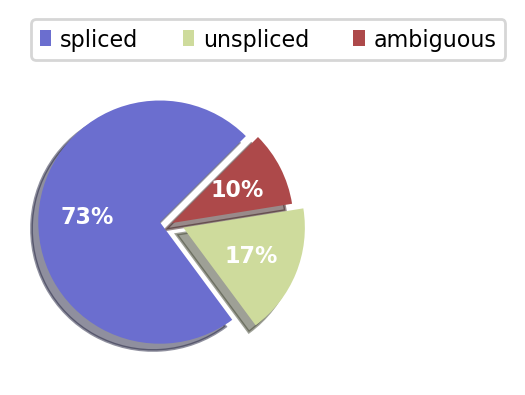

In [21]:
scv.pl.proportions(adata)

In [22]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


In [121]:
#Retains only genes shared across >=20 cells
#Limits to top 2000 highly variable genes
#Moments are recomputed using PCA and neighborhood graph -30 PCs, 30 neighbors

In [23]:
scv.tl.velocity(adata, mode='stochastic') # steady state = deterministic ## stochastic = accounts for transcriptional variability using likelihood-based dynamical modeling, good for more complex sys # dynamic =  allows calc of latent time, velocity confidence, and gene-specific dynamics

In [24]:
scv.tl.velocity_graph(adata)
# Graph edges represent the predicted future state directionality among cells in transcriptomic space.

In [25]:
sc.tl.umap(adata)

2025-05-18 19:54:54,573 - DEBUG - bytecode dump:
>          0	NOP(arg=None, lineno=63)
           2	LOAD_GLOBAL(arg=0, lineno=92)
           4	LOAD_METHOD(arg=1, lineno=92)
           6	LOAD_FAST(arg=5, lineno=92)
           8	LOAD_ATTR(arg=2, lineno=92)
          10	LOAD_CONST(arg=1, lineno=92)
          12	BINARY_SUBSCR(arg=None, lineno=92)
          14	CALL_METHOD(arg=1, lineno=92)
          16	GET_ITER(arg=None, lineno=92)
>         18	NOP(arg=1, lineno=92)
          20	FOR_ITER(arg=390, lineno=92)
          22	STORE_FAST(arg=27, lineno=92)
          24	LOAD_FAST(arg=15, lineno=93)
          26	LOAD_FAST(arg=27, lineno=93)
          28	BINARY_SUBSCR(arg=None, lineno=93)
          30	LOAD_FAST(arg=16, lineno=93)
          32	COMPARE_OP(arg=1, lineno=93)
          34	NOP(arg=1, lineno=93)
          36	POP_JUMP_IF_FALSE(arg=401, lineno=93)
          38	LOAD_FAST(arg=2, lineno=94)
          40	LOAD_FAST(arg=27, lineno=94)
          42	BINARY_SUBSCR(arg=None, lineno=94)
          44	STO

2025-05-18 19:54:54,574 - DEBUG - pending: deque([State(pc_initial=0 nstack_initial=0)])
2025-05-18 19:54:54,574 - DEBUG - stack: []
2025-05-18 19:54:54,575 - DEBUG - state.pc_initial: State(pc_initial=0 nstack_initial=0)
2025-05-18 19:54:54,575 - DEBUG - dispatch pc=0, inst=NOP(arg=None, lineno=63)
2025-05-18 19:54:54,575 - DEBUG - stack []
2025-05-18 19:54:54,575 - DEBUG - dispatch pc=2, inst=LOAD_GLOBAL(arg=0, lineno=92)
2025-05-18 19:54:54,576 - DEBUG - stack []
2025-05-18 19:54:54,576 - DEBUG - dispatch pc=4, inst=LOAD_METHOD(arg=1, lineno=92)
2025-05-18 19:54:54,576 - DEBUG - stack ['$2load_global.0']
2025-05-18 19:54:54,576 - DEBUG - dispatch pc=6, inst=LOAD_FAST(arg=5, lineno=92)
2025-05-18 19:54:54,577 - DEBUG - stack ['$4load_method.1']
2025-05-18 19:54:54,577 - DEBUG - dispatch pc=8, inst=LOAD_ATTR(arg=2, lineno=92)
2025-05-18 19:54:54,577 - DEBUG - stack ['$4load_method.1', '$epochs_per_sample6.2']
2025-05-18 19:54:54,577 - DEBUG - dispatch pc=10, inst=LOAD_CONST(arg=1, lin

2025-05-18 19:54:54,598 - DEBUG - dispatch pc=76, inst=CALL_FUNCTION(arg=2, lineno=100)
2025-05-18 19:54:54,598 - DEBUG - stack ['$phi38.0', '$70load_global.13', '$current72.14', '$other74.15']
2025-05-18 19:54:54,598 - DEBUG - dispatch pc=78, inst=STORE_FAST(arg=32, lineno=100)
2025-05-18 19:54:54,598 - DEBUG - stack ['$phi38.0', '$76call_function.16']
2025-05-18 19:54:54,599 - DEBUG - dispatch pc=80, inst=LOAD_FAST(arg=17, lineno=102)
2025-05-18 19:54:54,599 - DEBUG - stack ['$phi38.0']
2025-05-18 19:54:54,599 - DEBUG - dispatch pc=82, inst=POP_JUMP_IF_FALSE(arg=176, lineno=102)
2025-05-18 19:54:54,599 - DEBUG - stack ['$phi38.0', '$densmap_flag80.17']
2025-05-18 19:54:54,599 - DEBUG - end state. edges=[Edge(pc=84, stack=('$phi38.0',), blockstack=(), npush=0), Edge(pc=350, stack=('$phi38.0',), blockstack=(), npush=0)]
2025-05-18 19:54:54,600 - DEBUG - pending: deque([State(pc_initial=800 nstack_initial=1), State(pc_initial=84 nstack_initial=1), State(pc_initial=350 nstack_initial=1)]

2025-05-18 19:54:54,617 - DEBUG - dispatch pc=152, inst=BINARY_SUBSCR(arg=None, lineno=108)
2025-05-18 19:54:54,617 - DEBUG - stack ['$phi84.0', '$phi146.30', '$dens_phi_sum148.31', '$k150.32']
2025-05-18 19:54:54,618 - DEBUG - dispatch pc=154, inst=BINARY_TRUE_DIVIDE(arg=None, lineno=108)
2025-05-18 19:54:54,618 - DEBUG - stack ['$phi84.0', '$phi146.30', '$152binary_subscr.33']
2025-05-18 19:54:54,618 - DEBUG - dispatch pc=156, inst=STORE_FAST(arg=35, lineno=108)
2025-05-18 19:54:54,618 - DEBUG - stack ['$phi84.0', '$154binary_true_divide.34']
2025-05-18 19:54:54,618 - DEBUG - dispatch pc=158, inst=LOAD_FAST(arg=33, lineno=109)
2025-05-18 19:54:54,618 - DEBUG - stack ['$phi84.0']
2025-05-18 19:54:54,619 - DEBUG - dispatch pc=160, inst=LOAD_FAST(arg=18, lineno=109)
2025-05-18 19:54:54,619 - DEBUG - stack ['$phi84.0', '$phi158.35']
2025-05-18 19:54:54,619 - DEBUG - dispatch pc=162, inst=LOAD_FAST(arg=28, lineno=109)
2025-05-18 19:54:54,619 - DEBUG - stack ['$phi84.0', '$phi158.35', '$de

2025-05-18 19:54:54,635 - DEBUG - dispatch pc=238, inst=LOAD_FAST(arg=34, lineno=115)
2025-05-18 19:54:54,635 - DEBUG - stack ['$phi84.0', '$q_kj208.58', '$236binary_true_divide.72']
2025-05-18 19:54:54,636 - DEBUG - dispatch pc=240, inst=BINARY_ADD(arg=None, lineno=115)
2025-05-18 19:54:54,636 - DEBUG - stack ['$phi84.0', '$q_kj208.58', '$236binary_true_divide.72', '$dphi_term238.73']
2025-05-18 19:54:54,636 - DEBUG - dispatch pc=242, inst=BINARY_MULTIPLY(arg=None, lineno=114)
2025-05-18 19:54:54,639 - DEBUG - stack ['$phi84.0', '$q_kj208.58', '$240binary_add.74']
2025-05-18 19:54:54,639 - DEBUG - dispatch pc=244, inst=STORE_FAST(arg=38, lineno=114)
2025-05-18 19:54:54,639 - DEBUG - stack ['$phi84.0', '$242binary_multiply.75']
2025-05-18 19:54:54,639 - DEBUG - dispatch pc=246, inst=LOAD_FAST(arg=21, lineno=118)
2025-05-18 19:54:54,640 - DEBUG - stack ['$phi84.0']
2025-05-18 19:54:54,640 - DEBUG - dispatch pc=248, inst=LOAD_FAST(arg=21, lineno=118)
2025-05-18 19:54:54,640 - DEBUG - sta

2025-05-18 19:54:54,654 - DEBUG - dispatch pc=326, inst=BINARY_MULTIPLY(arg=None, lineno=131)
2025-05-18 19:54:54,655 - DEBUG - stack ['$phi84.0', '$314binary_multiply.107', '$320binary_multiply.110', '$weight_j322.111', '$drj324.112']
2025-05-18 19:54:54,655 - DEBUG - dispatch pc=328, inst=BINARY_ADD(arg=None, lineno=131)
2025-05-18 19:54:54,655 - DEBUG - stack ['$phi84.0', '$314binary_multiply.107', '$320binary_multiply.110', '$326binary_multiply.113']
2025-05-18 19:54:54,655 - DEBUG - dispatch pc=330, inst=BINARY_MULTIPLY(arg=None, lineno=129)
2025-05-18 19:54:54,655 - DEBUG - stack ['$phi84.0', '$314binary_multiply.107', '$328binary_add.114']
2025-05-18 19:54:54,655 - DEBUG - dispatch pc=332, inst=LOAD_FAST(arg=25, lineno=132)
2025-05-18 19:54:54,656 - DEBUG - stack ['$phi84.0', '$330binary_multiply.115']
2025-05-18 19:54:54,656 - DEBUG - dispatch pc=334, inst=LOAD_FAST(arg=27, lineno=132)
2025-05-18 19:54:54,656 - DEBUG - stack ['$phi84.0', '$330binary_multiply.115', '$dens_mu332.

2025-05-18 19:54:54,669 - DEBUG - dispatch pc=400, inst=BINARY_ADD(arg=None, lineno=138)
2025-05-18 19:54:54,670 - DEBUG - stack ['$phi358.0', '$grad_coeff384.13', '$396binary_multiply.19', '$const398.20.2']
2025-05-18 19:54:54,670 - DEBUG - dispatch pc=402, inst=INPLACE_TRUE_DIVIDE(arg=None, lineno=138)
2025-05-18 19:54:54,670 - DEBUG - stack ['$phi358.0', '$grad_coeff384.13', '$400binary_add.21']
2025-05-18 19:54:54,670 - DEBUG - dispatch pc=404, inst=STORE_FAST(arg=43, lineno=138)
2025-05-18 19:54:54,670 - DEBUG - stack ['$phi358.0', '$402inplace_true_divide.22']
2025-05-18 19:54:54,670 - DEBUG - dispatch pc=406, inst=JUMP_FORWARD(arg=2, lineno=138)
2025-05-18 19:54:54,671 - DEBUG - stack ['$phi358.0']
2025-05-18 19:54:54,671 - DEBUG - end state. edges=[Edge(pc=412, stack=('$phi358.0',), blockstack=(), npush=0)]
2025-05-18 19:54:54,671 - DEBUG - pending: deque([State(pc_initial=408 nstack_initial=1), State(pc_initial=412 nstack_initial=1)])
2025-05-18 19:54:54,671 - DEBUG - stack: [

2025-05-18 19:54:54,688 - DEBUG - stack ['$phi534.0', '$578load_global.21']
2025-05-18 19:54:54,688 - DEBUG - dispatch pc=582, inst=CALL_FUNCTION(arg=1, lineno=160)
2025-05-18 19:54:54,688 - DEBUG - stack ['$phi534.0', '$578load_global.21', '$n_neg_samples580.22']
2025-05-18 19:54:54,688 - DEBUG - dispatch pc=584, inst=GET_ITER(arg=None, lineno=160)
2025-05-18 19:54:54,688 - DEBUG - stack ['$phi534.0', '$582call_function.23']
2025-05-18 19:54:54,688 - DEBUG - end state. edges=[Edge(pc=586, stack=('$phi534.0', '$584get_iter.24'), blockstack=(), npush=0)]
2025-05-18 19:54:54,689 - DEBUG - pending: deque([State(pc_initial=422 nstack_initial=3), State(pc_initial=586 nstack_initial=2)])
2025-05-18 19:54:54,689 - DEBUG - stack: ['$phi422.0', '$phi422.1', '$phi422.2']
2025-05-18 19:54:54,689 - DEBUG - state.pc_initial: State(pc_initial=422 nstack_initial=3)
2025-05-18 19:54:54,689 - DEBUG - dispatch pc=422, inst=STORE_FAST(arg=44, lineno=142)
2025-05-18 19:54:54,689 - DEBUG - stack ['$phi422.

2025-05-18 19:54:54,699 - DEBUG - dispatch pc=480, inst=INPLACE_ADD(arg=None, lineno=148)
2025-05-18 19:54:54,700 - DEBUG - stack ['$phi452.0', '$phi452.1', '$grad_d452.2', '$478call_function.15']
2025-05-18 19:54:54,700 - DEBUG - dispatch pc=482, inst=STORE_FAST(arg=45, lineno=148)
2025-05-18 19:54:54,700 - DEBUG - stack ['$phi452.0', '$phi452.1', '$480inplace_add.16']
2025-05-18 19:54:54,700 - DEBUG - end state. edges=[Edge(pc=484, stack=('$phi452.0', '$phi452.1'), blockstack=(), npush=0)]
2025-05-18 19:54:54,700 - DEBUG - pending: deque([State(pc_initial=484 nstack_initial=2), State(pc_initial=776 nstack_initial=1), State(pc_initial=588 nstack_initial=3), State(pc_initial=484 nstack_initial=2)])
2025-05-18 19:54:54,700 - DEBUG - stack: ['$phi484.0', '$phi484.1']
2025-05-18 19:54:54,700 - DEBUG - state.pc_initial: State(pc_initial=484 nstack_initial=2)
2025-05-18 19:54:54,700 - DEBUG - dispatch pc=484, inst=LOAD_FAST(arg=30, lineno=150)
2025-05-18 19:54:54,700 - DEBUG - stack ['$phi4

2025-05-18 19:54:54,708 - DEBUG - stack ['$phi588.0', '$phi588.1', '$590load_global.3', '$596binary_subscr.6']
2025-05-18 19:54:54,708 - DEBUG - dispatch pc=600, inst=LOAD_FAST(arg=4, lineno=161)
2025-05-18 19:54:54,708 - DEBUG - stack ['$phi588.0', '$phi588.1', '$598call_function.7']
2025-05-18 19:54:54,708 - DEBUG - dispatch pc=602, inst=BINARY_MODULO(arg=None, lineno=161)
2025-05-18 19:54:54,708 - DEBUG - stack ['$phi588.0', '$phi588.1', '$598call_function.7', '$n_vertices600.8']
2025-05-18 19:54:54,708 - DEBUG - dispatch pc=604, inst=STORE_FAST(arg=29, lineno=161)
2025-05-18 19:54:54,708 - DEBUG - stack ['$phi588.0', '$phi588.1', '$602binary_modulo.9']
2025-05-18 19:54:54,708 - DEBUG - dispatch pc=606, inst=LOAD_FAST(arg=1, lineno=163)
2025-05-18 19:54:54,709 - DEBUG - stack ['$phi588.0', '$phi588.1']
2025-05-18 19:54:54,709 - DEBUG - dispatch pc=608, inst=LOAD_FAST(arg=29, lineno=163)
2025-05-18 19:54:54,709 - DEBUG - stack ['$phi588.0', '$phi588.1', '$tail_embedding606.10']
2025-

2025-05-18 19:54:54,716 - DEBUG - dispatch pc=640, inst=LOAD_FAST(arg=7, lineno=168)
2025-05-18 19:54:54,716 - DEBUG - stack ['$phi634.0', '$phi634.1', '$638binary_multiply.4']
2025-05-18 19:54:54,717 - DEBUG - dispatch pc=642, inst=BINARY_MULTIPLY(arg=None, lineno=168)
2025-05-18 19:54:54,717 - DEBUG - stack ['$phi634.0', '$phi634.1', '$638binary_multiply.4', '$b640.5']
2025-05-18 19:54:54,717 - DEBUG - dispatch pc=644, inst=STORE_FAST(arg=43, lineno=168)
2025-05-18 19:54:54,717 - DEBUG - stack ['$phi634.0', '$phi634.1', '$642binary_multiply.6']
2025-05-18 19:54:54,717 - DEBUG - dispatch pc=646, inst=LOAD_FAST(arg=43, lineno=169)
2025-05-18 19:54:54,717 - DEBUG - stack ['$phi634.0', '$phi634.1']
2025-05-18 19:54:54,717 - DEBUG - dispatch pc=648, inst=LOAD_CONST(arg=8, lineno=169)
2025-05-18 19:54:54,717 - DEBUG - stack ['$phi634.0', '$phi634.1', '$grad_coeff646.7']
2025-05-18 19:54:54,717 - DEBUG - dispatch pc=650, inst=LOAD_FAST(arg=32, lineno=169)
2025-05-18 19:54:54,718 - DEBUG - s

2025-05-18 19:54:54,725 - DEBUG - stack ['$phi692.0', '$phi692.1']
2025-05-18 19:54:54,725 - DEBUG - dispatch pc=694, inst=STORE_FAST(arg=43, lineno=175)
2025-05-18 19:54:54,725 - DEBUG - stack ['$phi692.0', '$phi692.1', '$const692.2.4']
2025-05-18 19:54:54,725 - DEBUG - end state. edges=[Edge(pc=696, stack=('$phi692.0', '$phi692.1'), blockstack=(), npush=0)]
2025-05-18 19:54:54,725 - DEBUG - pending: deque([State(pc_initial=704 nstack_initial=3), State(pc_initial=586 nstack_initial=2), State(pc_initial=696 nstack_initial=2)])
2025-05-18 19:54:54,726 - DEBUG - stack: ['$phi704.0', '$phi704.1', '$phi704.2']
2025-05-18 19:54:54,726 - DEBUG - state.pc_initial: State(pc_initial=704 nstack_initial=3)
2025-05-18 19:54:54,726 - DEBUG - dispatch pc=704, inst=FOR_ITER(arg=33, lineno=177)
2025-05-18 19:54:54,726 - DEBUG - stack ['$phi704.0', '$phi704.1', '$phi704.2']
2025-05-18 19:54:54,726 - DEBUG - end state. edges=[Edge(pc=772, stack=('$phi704.0', '$phi704.1'), blockstack=(), npush=0), Edge(p

2025-05-18 19:54:54,734 - DEBUG - stack: ['$phi748.0', '$phi748.1', '$phi748.2']
2025-05-18 19:54:54,734 - DEBUG - state.pc_initial: State(pc_initial=748 nstack_initial=3)
2025-05-18 19:54:54,734 - DEBUG - dispatch pc=748, inst=LOAD_FAST(arg=30, lineno=182)
2025-05-18 19:54:54,734 - DEBUG - stack ['$phi748.0', '$phi748.1', '$phi748.2']
2025-05-18 19:54:54,734 - DEBUG - dispatch pc=750, inst=LOAD_FAST(arg=44, lineno=182)
2025-05-18 19:54:54,734 - DEBUG - stack ['$phi748.0', '$phi748.1', '$phi748.2', '$current748.3']
2025-05-18 19:54:54,734 - DEBUG - dispatch pc=752, inst=DUP_TOP_TWO(arg=None, lineno=182)
2025-05-18 19:54:54,734 - DEBUG - stack ['$phi748.0', '$phi748.1', '$phi748.2', '$current748.3', '$d750.4']
2025-05-18 19:54:54,734 - DEBUG - dispatch pc=754, inst=BINARY_SUBSCR(arg=None, lineno=182)
2025-05-18 19:54:54,735 - DEBUG - stack ['$phi748.0', '$phi748.1', '$phi748.2', '$current748.3', '$d750.4', '$752dup_top_two.5', '$752dup_top_two.6']
2025-05-18 19:54:54,735 - DEBUG - dispa

2025-05-18 19:54:54,738 - DEBUG - changing phismap: defaultdict(<class 'set'>,
            {'$phi18.0': {('$16get_iter.7',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi22.0', State(pc_initial=22 nstack_initial=2)),
                          ('$phi776.0',
                           State(pc_initial=776 nstack_initial=1))},
             '$phi20.0': {('$16get_iter.7',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi22.0', State(pc_initial=22 nstack_initial=2)),
                          ('$phi776.0',
                           State(pc_initial=776 nstack_initial=1))},
             '$phi22.0': {('$16get_iter.7',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi22.0', State(pc_initial=22 nstack_initial=2)),
                          ('$phi776.0',
                           State(pc_initial=776 nstack_initial=1))},
             '$phi22.1': {(

2025-05-18 19:54:54,739 - DEBUG - changing phismap: defaultdict(<class 'set'>,
            {'$phi18.0': {('$16get_iter.7',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi484.0', State(pc_initial=484 nstack_initial=2)),
                          ('$phi510.0', State(pc_initial=510 nstack_initial=2)),
                          ('$phi678.0', State(pc_initial=678 nstack_initial=2)),
                          ('$phi704.0',
                           State(pc_initial=704 nstack_initial=3))},
             '$phi20.0': {('$16get_iter.7',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi484.0', State(pc_initial=484 nstack_initial=2)),
                          ('$phi510.0', State(pc_initial=510 nstack_initial=2)),
                          ('$phi678.0', State(pc_initial=678 nstack_initial=2)),
                          ('$phi704.0',
                           State(pc_initial=704 nstack_initial=3))

2025-05-18 19:54:54,741 - DEBUG - changing phismap: defaultdict(<class 'set'>,
            {'$phi18.0': {('$16get_iter.7',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi718.0', State(pc_initial=718 nstack_initial=3)),
                          ('$phi744.0',
                           State(pc_initial=744 nstack_initial=3))},
             '$phi20.0': {('$16get_iter.7',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi718.0', State(pc_initial=718 nstack_initial=3)),
                          ('$phi744.0',
                           State(pc_initial=744 nstack_initial=3))},
             '$phi22.0': {('$16get_iter.7',
                           State(pc_initial=0 nstack_initial=0)),
                          ('$phi718.0', State(pc_initial=718 nstack_initial=3)),
                          ('$phi744.0',
                           State(pc_initial=744 nstack_initial=3))},
             '$phi22.

2025-05-18 19:54:54,741 - DEBUG - changing phismap: defaultdict(<class 'set'>,
            {'$phi18.0': {('$16get_iter.7',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi20.0': {('$16get_iter.7',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi22.0': {('$16get_iter.7',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi22.1': {('$20for_iter.2',
                           State(pc_initial=20 nstack_initial=1))},
             '$phi350.0': {('$16get_iter.7',
                            State(pc_initial=0 nstack_initial=0))},
             '$phi358.0': {('$16get_iter.7',
                            State(pc_initial=0 nstack_initial=0))},
             '$phi38.0': {('$16get_iter.7',
                           State(pc_initial=0 nstack_initial=0))},
             '$phi408.0': {('$16get_iter.7',
                            State(pc_initial=0 nstack_initial=0))},
             '$phi412.0': 

2025-05-18 19:54:54,742 - DEBUG - keep phismap: {'$phi20.0': {('$16get_iter.7', State(pc_initial=0 nstack_initial=0))},
 '$phi22.1': {('$20for_iter.2', State(pc_initial=20 nstack_initial=1))},
 '$phi420.1': {('$418get_iter.4', State(pc_initial=412 nstack_initial=1))},
 '$phi422.2': {('$420for_iter.3', State(pc_initial=420 nstack_initial=2))},
 '$phi586.1': {('$584get_iter.24', State(pc_initial=534 nstack_initial=1))},
 '$phi588.2': {('$586for_iter.3', State(pc_initial=586 nstack_initial=2))},
 '$phi704.2': {('$702get_iter.5', State(pc_initial=696 nstack_initial=2))},
 '$phi706.3': {('$704for_iter.4', State(pc_initial=704 nstack_initial=3))}}
2025-05-18 19:54:54,743 - DEBUG - new_out: defaultdict(<class 'dict'>,
            {State(pc_initial=0 nstack_initial=0): {'$phi20.0': '$16get_iter.7'},
             State(pc_initial=20 nstack_initial=1): {'$phi22.1': '$20for_iter.2'},
             State(pc_initial=412 nstack_initial=1): {'$phi420.1': '$418get_iter.4'},
             State(pc_initia

2025-05-18 19:54:54,744 - DEBUG - block_infos State(pc_initial=350 nstack_initial=1):
AdaptBlockInfo(insts=((350, {'res': '$dist_squared350.1'}), (352, {'res': '$const352.2.4'}), (354, {'lhs': '$dist_squared350.1', 'rhs': '$const352.2.4', 'res': '$354compare_op.3'}), (356, {'pred': '$354compare_op.3'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={358: ('$phi350.0',), 408: ('$phi350.0',)})
2025-05-18 19:54:54,744 - DEBUG - block_infos State(pc_initial=358 nstack_initial=1):
AdaptBlockInfo(insts=((358, {'res': '$const358.1.5'}), (360, {'res': '$a360.2'}), (362, {'lhs': '$const358.1.5', 'rhs': '$a360.2', 'res': '$362binary_multiply.3'}), (364, {'res': '$b364.4'}), (366, {'lhs': '$362binary_multiply.3', 'rhs': '$b364.4', 'res': '$366binary_multiply.5'}), (368, {'res': '$368load_global.6'}), (370, {'res': '$dist_squared370.7'}), (372, {'res': '$b372.8'}), (374, {'res': '$const374.9.2'}), (376, {'lhs': '$b372.8', 'rhs': '$const374.9.2', 'res': '$376binary_su

2025-05-18 19:54:54,745 - DEBUG - block_infos State(pc_initial=586 nstack_initial=2):
AdaptBlockInfo(insts=((586, {'iterator': '$phi586.1', 'pair': '$586for_iter.2', 'indval': '$586for_iter.3', 'pred': '$586for_iter.4'}),), outgoing_phis={'$phi588.2': '$586for_iter.3'}, blockstack=(), active_try_block=None, outgoing_edgepushed={776: ('$phi586.0',), 588: ('$phi586.0', '$phi586.1', '$586for_iter.3')})
2025-05-18 19:54:54,745 - DEBUG - block_infos State(pc_initial=588 nstack_initial=3):
AdaptBlockInfo(insts=((588, {'value': '$phi588.2'}), (590, {'res': '$590load_global.3'}), (592, {'res': '$rng_state_per_sample592.4'}), (594, {'res': '$j594.5'}), (596, {'index': '$j594.5', 'target': '$rng_state_per_sample592.4', 'res': '$596binary_subscr.6'}), (598, {'func': '$590load_global.3', 'args': ['$596binary_subscr.6'], 'res': '$598call_function.7'}), (600, {'res': '$n_vertices600.8'}), (602, {'lhs': '$598call_function.7', 'rhs': '$n_vertices600.8', 'res': '$602binary_modulo.9'}), (604, {'value': 

2025-05-18 19:54:54,747 - DEBUG - block_infos State(pc_initial=800 nstack_initial=1):
AdaptBlockInfo(insts=((800, {}),), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={18: ('$phi800.0',)})
2025-05-18 19:54:54,747 - DEBUG - block_infos State(pc_initial=802 nstack_initial=0):
AdaptBlockInfo(insts=((802, {'res': '$const802.0.0'}), (804, {'retval': '$const802.0.0', 'castval': '$804return_value.1'})), outgoing_phis={}, blockstack=(), active_try_block=None, outgoing_edgepushed={})
2025-05-18 19:54:54,751 - DEBUG - label 0:
    head_embedding = arg(0, name=head_embedding) ['head_embedding']
    tail_embedding = arg(1, name=tail_embedding) ['tail_embedding']
    head = arg(2, name=head)                 ['head']
    tail = arg(3, name=tail)                 ['tail']
    n_vertices = arg(4, name=n_vertices)     ['n_vertices']
    epochs_per_sample = arg(5, name=epochs_per_sample) ['epochs_per_sample']
    a = arg(6, name=a)                       ['a']
    b = arg(7, 

2025-05-18 19:54:54,783 - DEBUG - ==== SSA block analysis pass on 0
2025-05-18 19:54:54,783 - DEBUG - Running <numba.core.ssa._GatherDefsHandler object at 0x706826ccf190>
2025-05-18 19:54:54,784 - DEBUG - on stmt: head_embedding = arg(0, name=head_embedding)
2025-05-18 19:54:54,784 - DEBUG - on stmt: tail_embedding = arg(1, name=tail_embedding)
2025-05-18 19:54:54,784 - DEBUG - on stmt: head = arg(2, name=head)
2025-05-18 19:54:54,784 - DEBUG - on stmt: tail = arg(3, name=tail)
2025-05-18 19:54:54,784 - DEBUG - on stmt: n_vertices = arg(4, name=n_vertices)
2025-05-18 19:54:54,784 - DEBUG - on stmt: epochs_per_sample = arg(5, name=epochs_per_sample)
2025-05-18 19:54:54,784 - DEBUG - on stmt: a = arg(6, name=a)
2025-05-18 19:54:54,784 - DEBUG - on stmt: b = arg(7, name=b)
2025-05-18 19:54:54,784 - DEBUG - on stmt: rng_state_per_sample = arg(8, name=rng_state_per_sample)
2025-05-18 19:54:54,785 - DEBUG - on stmt: gamma = arg(9, name=gamma)
2025-05-18 19:54:54,785 - DEBUG - on stmt: dim = 

2025-05-18 19:54:54,793 - DEBUG - on stmt: $136call_function.26 = call $130load_global.23(dist_squared, b, func=$130load_global.23, args=[Var(dist_squared, layouts.py:100), Var(b, layouts.py:63)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:54,793 - DEBUG - on stmt: $138binary_multiply.27 = a * $136call_function.26
2025-05-18 19:54:54,793 - DEBUG - on stmt: $140binary_add.28 = $const126.21.2 + $138binary_multiply.27
2025-05-18 19:54:54,793 - DEBUG - on stmt: dphi_term = $124binary_multiply.20 / $140binary_add.28
2025-05-18 19:54:54,793 - DEBUG - on stmt: $152binary_subscr.33 = getitem(value=dens_phi_sum, index=k, fn=<built-in function getitem>)
2025-05-18 19:54:54,793 - DEBUG - on stmt: q_jk = phi / $152binary_subscr.33
2025-05-18 19:54:54,793 - DEBUG - on stmt: $164binary_subscr.38 = getitem(value=dens_phi_sum, index=j, fn=<built-in function getitem>)
2025-05-18 19:54:54,793 - DEBUG - on stmt: q_kj = phi / $164binary_subscr.38
2025-05-18 19:54:54,794 - DEBUG - on

2025-05-18 19:54:54,804 - DEBUG - on stmt: $396binary_multiply.19 = a * $394call_function.18
2025-05-18 19:54:54,804 - DEBUG - on stmt: $const398.20.2 = const(float, 1.0)
2025-05-18 19:54:54,804 - DEBUG - on stmt: $400binary_add.21 = $396binary_multiply.19 + $const398.20.2
2025-05-18 19:54:54,804 - DEBUG - on stmt: $402inplace_true_divide.22 = inplace_binop(fn=<built-in function itruediv>, immutable_fn=<built-in function truediv>, lhs=grad_coeff, rhs=$400binary_add.21, static_lhs=Undefined, static_rhs=Undefined)
2025-05-18 19:54:54,804 - DEBUG - on stmt: grad_coeff = $402inplace_true_divide.22
2025-05-18 19:54:54,804 - DEBUG - on stmt: jump 412
2025-05-18 19:54:54,805 - DEBUG - ==== SSA block analysis pass on 408
2025-05-18 19:54:54,805 - DEBUG - Running <numba.core.ssa._GatherDefsHandler object at 0x706826ccf190>
2025-05-18 19:54:54,805 - DEBUG - on stmt: grad_coeff = const(float, 0.0)
2025-05-18 19:54:54,805 - DEBUG - on stmt: jump 412
2025-05-18 19:54:54,805 - DEBUG - ==== SSA block

2025-05-18 19:54:54,815 - DEBUG - on stmt: $564binary_subtract.15 = n - $562binary_subscr.14
2025-05-18 19:54:54,815 - DEBUG - on stmt: $570binary_subscr.18 = getitem(value=epochs_per_negative_sample, index=i, fn=<built-in function getitem>)
2025-05-18 19:54:54,815 - DEBUG - on stmt: $572binary_true_divide.19 = $564binary_subtract.15 / $570binary_subscr.18
2025-05-18 19:54:54,816 - DEBUG - on stmt: n_neg_samples = call $554load_global.10($572binary_true_divide.19, func=$554load_global.10, args=[Var($572binary_true_divide.19, layouts.py:157)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:54,816 - DEBUG - on stmt: $578load_global.21 = global(range: <class 'range'>)
2025-05-18 19:54:54,816 - DEBUG - on stmt: $582call_function.23 = call $578load_global.21(n_neg_samples, func=$578load_global.21, args=[Var(n_neg_samples, layouts.py:156)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:54,816 - DEBUG - on stmt: $584get_iter.24 = getiter(value=$582call_f

2025-05-18 19:54:54,824 - DEBUG - on stmt: branch $716pred, 718, 744
2025-05-18 19:54:54,824 - DEBUG - ==== SSA block analysis pass on 718
2025-05-18 19:54:54,824 - DEBUG - Running <numba.core.ssa._GatherDefsHandler object at 0x706826ccf190>
2025-05-18 19:54:54,824 - DEBUG - on stmt: $718load_global.3 = global(clip: CPUDispatcher(<function clip at 0x7068274f4dc0>))
2025-05-18 19:54:54,824 - DEBUG - on stmt: $726binary_subscr.7 = getitem(value=current, index=d, fn=<built-in function getitem>)
2025-05-18 19:54:54,825 - DEBUG - on stmt: $732binary_subscr.10 = getitem(value=other, index=d, fn=<built-in function getitem>)
2025-05-18 19:54:54,825 - DEBUG - on stmt: $734binary_subtract.11 = $726binary_subscr.7 - $732binary_subscr.10
2025-05-18 19:54:54,825 - DEBUG - on stmt: $736binary_multiply.12 = grad_coeff * $734binary_subtract.11
2025-05-18 19:54:54,825 - DEBUG - on stmt: grad_d = call $718load_global.3($736binary_multiply.12, func=$718load_global.3, args=[Var($736binary_multiply.12, lay

2025-05-18 19:54:54,831 - DEBUG - SSA violators <numba.core.utils.OrderedSet object at 0x706831285c00>
2025-05-18 19:54:54,831 - DEBUG - Fix SSA violator on var k
2025-05-18 19:54:54,831 - DEBUG - ==== SSA block rewrite pass on 0
2025-05-18 19:54:54,831 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706826ccfd00>
2025-05-18 19:54:54,832 - DEBUG - on stmt: head_embedding = arg(0, name=head_embedding)
2025-05-18 19:54:54,832 - DEBUG - on stmt: tail_embedding = arg(1, name=tail_embedding)
2025-05-18 19:54:54,832 - DEBUG - on stmt: head = arg(2, name=head)
2025-05-18 19:54:54,832 - DEBUG - on stmt: tail = arg(3, name=tail)
2025-05-18 19:54:54,832 - DEBUG - on stmt: n_vertices = arg(4, name=n_vertices)
2025-05-18 19:54:54,832 - DEBUG - on stmt: epochs_per_sample = arg(5, name=epochs_per_sample)
2025-05-18 19:54:54,832 - DEBUG - on stmt: a = arg(6, name=a)
2025-05-18 19:54:54,832 - DEBUG - on stmt: b = arg(7, name=b)
2025-05-18 19:54:54,832 - DEBUG - on stmt: rng_state_per_sa

2025-05-18 19:54:54,845 - DEBUG - on stmt: $124binary_multiply.20 = $110binary_multiply.13 * $122call_function.19
2025-05-18 19:54:54,845 - DEBUG - on stmt: $const126.21.2 = const(float, 1.0)
2025-05-18 19:54:54,846 - DEBUG - on stmt: $130load_global.23 = global(pow: <built-in function pow>)
2025-05-18 19:54:54,846 - DEBUG - on stmt: $136call_function.26 = call $130load_global.23(dist_squared, b, func=$130load_global.23, args=[Var(dist_squared, layouts.py:100), Var(b, layouts.py:63)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:54,846 - DEBUG - on stmt: $138binary_multiply.27 = a * $136call_function.26
2025-05-18 19:54:54,846 - DEBUG - on stmt: $140binary_add.28 = $const126.21.2 + $138binary_multiply.27
2025-05-18 19:54:54,846 - DEBUG - on stmt: dphi_term = $124binary_multiply.20 / $140binary_add.28
2025-05-18 19:54:54,846 - DEBUG - on stmt: $152binary_subscr.33 = getitem(value=dens_phi_sum, index=k, fn=<built-in function getitem>)
2025-05-18 19:54:54,846 - DEBUG 

2025-05-18 19:54:54,853 - DEBUG - on stmt: $388load_global.15 = global(pow: <built-in function pow>)
2025-05-18 19:54:54,853 - DEBUG - on stmt: $394call_function.18 = call $388load_global.15(dist_squared, b, func=$388load_global.15, args=[Var(dist_squared, layouts.py:100), Var(b, layouts.py:63)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:54,854 - DEBUG - on stmt: $396binary_multiply.19 = a * $394call_function.18
2025-05-18 19:54:54,854 - DEBUG - on stmt: $const398.20.2 = const(float, 1.0)
2025-05-18 19:54:54,854 - DEBUG - on stmt: $400binary_add.21 = $396binary_multiply.19 + $const398.20.2
2025-05-18 19:54:54,854 - DEBUG - on stmt: $402inplace_true_divide.22 = inplace_binop(fn=<built-in function itruediv>, immutable_fn=<built-in function truediv>, lhs=grad_coeff, rhs=$400binary_add.21, static_lhs=Undefined, static_rhs=Undefined)
2025-05-18 19:54:54,854 - DEBUG - on stmt: grad_coeff = $402inplace_true_divide.22
2025-05-18 19:54:54,854 - DEBUG - on stmt: jump 412


2025-05-18 19:54:54,861 - DEBUG - on stmt: epoch_of_next_sample[i] = $548inplace_add.9
2025-05-18 19:54:54,861 - DEBUG - on stmt: $554load_global.10 = global(int: <class 'int'>)
2025-05-18 19:54:54,862 - DEBUG - on stmt: $562binary_subscr.14 = getitem(value=epoch_of_next_negative_sample, index=i, fn=<built-in function getitem>)
2025-05-18 19:54:54,862 - DEBUG - on stmt: $564binary_subtract.15 = n - $562binary_subscr.14
2025-05-18 19:54:54,862 - DEBUG - on stmt: $570binary_subscr.18 = getitem(value=epochs_per_negative_sample, index=i, fn=<built-in function getitem>)
2025-05-18 19:54:54,862 - DEBUG - on stmt: $572binary_true_divide.19 = $564binary_subtract.15 / $570binary_subscr.18
2025-05-18 19:54:54,862 - DEBUG - on stmt: n_neg_samples = call $554load_global.10($572binary_true_divide.19, func=$554load_global.10, args=[Var($572binary_true_divide.19, layouts.py:157)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:54,862 - DEBUG - on stmt: $578load_global.21 = global(r

2025-05-18 19:54:54,870 - DEBUG - on stmt: d = $phi706.3
2025-05-18 19:54:54,870 - DEBUG - on stmt: $const710.5.4 = const(float, 0.0)
2025-05-18 19:54:54,870 - DEBUG - on stmt: $712compare_op.6 = grad_coeff > $const710.5.4
2025-05-18 19:54:54,870 - DEBUG - on stmt: bool716 = global(bool: <class 'bool'>)
2025-05-18 19:54:54,870 - DEBUG - on stmt: $716pred = call bool716($712compare_op.6, func=bool716, args=(Var($712compare_op.6, layouts.py:178),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:54,870 - DEBUG - on stmt: branch $716pred, 718, 744
2025-05-18 19:54:54,871 - DEBUG - ==== SSA block rewrite pass on 718
2025-05-18 19:54:54,871 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706826ccfd00>
2025-05-18 19:54:54,871 - DEBUG - on stmt: $718load_global.3 = global(clip: CPUDispatcher(<function clip at 0x7068274f4dc0>))
2025-05-18 19:54:54,871 - DEBUG - on stmt: $726binary_subscr.7 = getitem(value=current, index=d, fn=<built-in function getitem>)
2025-0

2025-05-18 19:54:54,879 - DEBUG - on stmt: $phi20.0 = $16get_iter.7
2025-05-18 19:54:54,879 - DEBUG - on stmt: jump 18
2025-05-18 19:54:54,879 - DEBUG - ==== SSA block rewrite pass on 18
2025-05-18 19:54:54,879 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706826ccfd00>
2025-05-18 19:54:54,879 - DEBUG - on stmt: jump 20
2025-05-18 19:54:54,879 - DEBUG - ==== SSA block rewrite pass on 20
2025-05-18 19:54:54,879 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706826ccfd00>
2025-05-18 19:54:54,880 - DEBUG - on stmt: $20for_iter.1 = iternext(value=$phi20.0)
2025-05-18 19:54:54,880 - DEBUG - on stmt: $20for_iter.2 = pair_first(value=$20for_iter.1)
2025-05-18 19:54:54,880 - DEBUG - on stmt: $20for_iter.3 = pair_second(value=$20for_iter.1)
2025-05-18 19:54:54,880 - DEBUG - on stmt: $phi22.1 = $20for_iter.2
2025-05-18 19:54:54,880 - DEBUG - on stmt: branch $20for_iter.3, 22, 802
2025-05-18 19:54:54,880 - DEBUG - ==== SSA block rewrite pass on 22
2025-05-18 19:54:54,880 - 

2025-05-18 19:54:54,887 - DEBUG - on stmt: $220binary_multiply.64 = b * $218binary_subtract.63
2025-05-18 19:54:54,888 - DEBUG - on stmt: $222binary_subtract.65 = $const210.59.2 - $220binary_multiply.64
2025-05-18 19:54:54,888 - DEBUG - on stmt: $224load_global.66 = global(np: <module 'numpy' from '/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/numpy/__init__.py'>)
2025-05-18 19:54:54,888 - DEBUG - on stmt: $226load_method.67 = getattr(value=$224load_global.66, attr=exp)
2025-05-18 19:54:54,888 - DEBUG - on stmt: $232binary_subscr.70 = getitem(value=dens_re_sum, index=j, fn=<built-in function getitem>)
2025-05-18 19:54:54,888 - DEBUG - on stmt: $234call_method.71 = call $226load_method.67($232binary_subscr.70, func=$226load_method.67, args=[Var($232binary_subscr.70, layouts.py:115)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:54,888 - DEBUG - on stmt: $236binary_true_divide.72 = $222binary_subtract.65 / $234call_method.71
2025-05-18 19:54:54,888 -

2025-05-18 19:54:54,896 - DEBUG - on stmt: $420for_iter.3 = pair_first(value=$420for_iter.2)
2025-05-18 19:54:54,896 - DEBUG - on stmt: $420for_iter.4 = pair_second(value=$420for_iter.2)
2025-05-18 19:54:54,896 - DEBUG - on stmt: $phi422.2 = $420for_iter.3
2025-05-18 19:54:54,897 - DEBUG - on stmt: branch $420for_iter.4, 422, 534
2025-05-18 19:54:54,897 - DEBUG - ==== SSA block rewrite pass on 422
2025-05-18 19:54:54,897 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706826ccfd00>
2025-05-18 19:54:54,897 - DEBUG - on stmt: d = $phi422.2
2025-05-18 19:54:54,897 - DEBUG - on stmt: $424load_global.3 = global(clip: CPUDispatcher(<function clip at 0x7068274f4dc0>))
2025-05-18 19:54:54,897 - DEBUG - on stmt: $432binary_subscr.7 = getitem(value=current, index=d, fn=<built-in function getitem>)
2025-05-18 19:54:54,897 - DEBUG - on stmt: $438binary_subscr.10 = getitem(value=other, index=d, fn=<built-in function getitem>)
2025-05-18 19:54:54,897 - DEBUG - on stmt: $440binary_subtract.

2025-05-18 19:54:54,904 - DEBUG - on stmt: p = $phi588.2
2025-05-18 19:54:54,905 - DEBUG - on stmt: $590load_global.3 = global(tau_rand_int: CPUDispatcher(<function tau_rand_int at 0x706830dda5f0>))
2025-05-18 19:54:54,905 - DEBUG - on stmt: $596binary_subscr.6 = getitem(value=rng_state_per_sample, index=j, fn=<built-in function getitem>)
2025-05-18 19:54:54,905 - DEBUG - on stmt: $598call_function.7 = call $590load_global.3($596binary_subscr.6, func=$590load_global.3, args=[Var($596binary_subscr.6, layouts.py:161)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:54,905 - DEBUG - on stmt: k.1 = $598call_function.7 % n_vertices
2025-05-18 19:54:54,905 - DEBUG - on stmt: other = getitem(value=tail_embedding, index=k, fn=<built-in function getitem>)
2025-05-18 19:54:54,905 - DEBUG - find_def var='k' stmt=other = getitem(value=tail_embedding, index=k, fn=<built-in function getitem>)
2025-05-18 19:54:54,905 - DEBUG - replaced with: other = getitem(value=tail_embedding, in

2025-05-18 19:54:54,913 - DEBUG - on stmt: grad_d = const(int, 0)
2025-05-18 19:54:54,913 - DEBUG - on stmt: jump 748
2025-05-18 19:54:54,914 - DEBUG - ==== SSA block rewrite pass on 748
2025-05-18 19:54:54,914 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706826ccfd00>
2025-05-18 19:54:54,914 - DEBUG - on stmt: $754binary_subscr.7 = getitem(value=current, index=d, fn=<built-in function getitem>)
2025-05-18 19:54:54,914 - DEBUG - on stmt: $760binary_multiply.10 = grad_d * alpha
2025-05-18 19:54:54,914 - DEBUG - on stmt: $762inplace_add.11 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$754binary_subscr.7, rhs=$760binary_multiply.10, static_lhs=Undefined, static_rhs=Undefined)
2025-05-18 19:54:54,914 - DEBUG - on stmt: current[d] = $762inplace_add.11
2025-05-18 19:54:54,914 - DEBUG - on stmt: jump 704
2025-05-18 19:54:54,914 - DEBUG - ==== SSA block rewrite pass on 772
2025-05-18 19:54:54,914 - DEBUG - Running <numba.core.ssa._FixSSAVa

2025-05-18 19:54:54,944 - DEBUG - on stmt: k = getitem(value=tail, index=i, fn=<built-in function getitem>)
2025-05-18 19:54:54,944 - DEBUG - on stmt: current = getitem(value=head_embedding, index=j, fn=<built-in function getitem>)
2025-05-18 19:54:54,944 - DEBUG - on stmt: other = getitem(value=tail_embedding, index=k, fn=<built-in function getitem>)
2025-05-18 19:54:54,944 - DEBUG - first assign: other
2025-05-18 19:54:54,944 - DEBUG - replaced with: other = getitem(value=tail_embedding, index=k, fn=<built-in function getitem>)
2025-05-18 19:54:54,944 - DEBUG - on stmt: $70load_global.13 = global(rdist: CPUDispatcher(<function rdist at 0x7068274f5ea0>))
2025-05-18 19:54:54,945 - DEBUG - on stmt: dist_squared = call $70load_global.13(current, other, func=$70load_global.13, args=[Var(current, layouts.py:97), Var(other, layouts.py:98)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:54,945 - DEBUG - on stmt: bool82 = global(bool: <class 'bool'>)
2025-05-18 19:54:54,94

2025-05-18 19:54:54,952 - DEBUG - on stmt: $314binary_multiply.107 = dens_lambda * dens_mu_tot
2025-05-18 19:54:54,952 - DEBUG - on stmt: $320binary_multiply.110 = weight_k * drk
2025-05-18 19:54:54,952 - DEBUG - on stmt: $326binary_multiply.113 = weight_j * drj
2025-05-18 19:54:54,952 - DEBUG - on stmt: $328binary_add.114 = $320binary_multiply.110 + $326binary_multiply.113
2025-05-18 19:54:54,952 - DEBUG - on stmt: $330binary_multiply.115 = $314binary_multiply.107 * $328binary_add.114
2025-05-18 19:54:54,952 - DEBUG - on stmt: $336binary_subscr.118 = getitem(value=dens_mu, index=i, fn=<built-in function getitem>)
2025-05-18 19:54:54,952 - DEBUG - on stmt: $340binary_multiply.120 = $336binary_subscr.118 * dens_re_std
2025-05-18 19:54:54,952 - DEBUG - on stmt: $342binary_true_divide.121 = $330binary_multiply.115 / $340binary_multiply.120
2025-05-18 19:54:54,953 - DEBUG - on stmt: grad_cor_coeff = $342binary_true_divide.121 / n_vertices
2025-05-18 19:54:54,953 - DEBUG - on stmt: jump 350

2025-05-18 19:54:54,960 - DEBUG - on stmt: jump 484
2025-05-18 19:54:54,960 - DEBUG - ==== SSA block rewrite pass on 484
2025-05-18 19:54:54,960 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706831285f30>
2025-05-18 19:54:54,960 - DEBUG - on stmt: $490binary_subscr.6 = getitem(value=current, index=d, fn=<built-in function getitem>)
2025-05-18 19:54:54,960 - DEBUG - on stmt: $496binary_multiply.9 = grad_d * alpha
2025-05-18 19:54:54,961 - DEBUG - on stmt: $498inplace_add.10 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$490binary_subscr.6, rhs=$496binary_multiply.9, static_lhs=Undefined, static_rhs=Undefined)
2025-05-18 19:54:54,961 - DEBUG - on stmt: current[d] = $498inplace_add.10
2025-05-18 19:54:54,961 - DEBUG - on stmt: bool508 = global(bool: <class 'bool'>)
2025-05-18 19:54:54,961 - DEBUG - on stmt: $508pred = call bool508(move_other, func=bool508, args=(Var(move_other, layouts.py:63),), kws=(), vararg=None, varkwarg=None, 

2025-05-18 19:54:54,968 - DEBUG - on stmt: $672inplace_true_divide.20 = inplace_binop(fn=<built-in function itruediv>, immutable_fn=<built-in function truediv>, lhs=grad_coeff, rhs=$670binary_multiply.19, static_lhs=Undefined, static_rhs=Undefined)
2025-05-18 19:54:54,968 - DEBUG - on stmt: grad_coeff = $672inplace_true_divide.20
2025-05-18 19:54:54,968 - DEBUG - on stmt: jump 696
2025-05-18 19:54:54,968 - DEBUG - ==== SSA block rewrite pass on 678
2025-05-18 19:54:54,968 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x706831285f30>
2025-05-18 19:54:54,969 - DEBUG - on stmt: $682compare_op.4 = j == k.1
2025-05-18 19:54:54,969 - DEBUG - on stmt: bool686 = global(bool: <class 'bool'>)
2025-05-18 19:54:54,969 - DEBUG - on stmt: $686pred = call bool686($682compare_op.4, func=bool686, args=(Var($682compare_op.4, layouts.py:172),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:54,969 - DEBUG - on stmt: branch $686pred, 688, 692
2025-05-18 19:54:54,969 - DEB

2025-05-18 19:54:54,978 - DEBUG - on stmt: tail = arg(3, name=tail)
2025-05-18 19:54:54,978 - DEBUG - on stmt: n_vertices = arg(4, name=n_vertices)
2025-05-18 19:54:54,978 - DEBUG - on stmt: epochs_per_sample = arg(5, name=epochs_per_sample)
2025-05-18 19:54:54,978 - DEBUG - on stmt: a = arg(6, name=a)
2025-05-18 19:54:54,978 - DEBUG - on stmt: b = arg(7, name=b)
2025-05-18 19:54:54,978 - DEBUG - on stmt: rng_state_per_sample = arg(8, name=rng_state_per_sample)
2025-05-18 19:54:54,978 - DEBUG - on stmt: gamma = arg(9, name=gamma)
2025-05-18 19:54:54,978 - DEBUG - on stmt: dim = arg(10, name=dim)
2025-05-18 19:54:54,978 - DEBUG - on stmt: move_other = arg(11, name=move_other)
2025-05-18 19:54:54,978 - DEBUG - on stmt: alpha = arg(12, name=alpha)
2025-05-18 19:54:54,979 - DEBUG - on stmt: epochs_per_negative_sample = arg(13, name=epochs_per_negative_sample)
2025-05-18 19:54:54,979 - DEBUG - on stmt: epoch_of_next_negative_sample = arg(14, name=epoch_of_next_negative_sample)
2025-05-18 19

2025-05-18 19:54:54,986 - DEBUG - on stmt: $138binary_multiply.27 = a * $136call_function.26
2025-05-18 19:54:54,986 - DEBUG - on stmt: $140binary_add.28 = $const126.21.2 + $138binary_multiply.27
2025-05-18 19:54:54,986 - DEBUG - on stmt: dphi_term = $124binary_multiply.20 / $140binary_add.28
2025-05-18 19:54:54,987 - DEBUG - on stmt: $152binary_subscr.33 = getitem(value=dens_phi_sum, index=k, fn=<built-in function getitem>)
2025-05-18 19:54:54,987 - DEBUG - on stmt: q_jk = phi / $152binary_subscr.33
2025-05-18 19:54:54,987 - DEBUG - on stmt: $164binary_subscr.38 = getitem(value=dens_phi_sum, index=j, fn=<built-in function getitem>)
2025-05-18 19:54:54,987 - DEBUG - on stmt: q_kj = phi / $164binary_subscr.38
2025-05-18 19:54:54,987 - DEBUG - on stmt: $const172.41.2 = const(float, 1.0)
2025-05-18 19:54:54,987 - DEBUG - on stmt: $const176.43.3 = const(int, 1)
2025-05-18 19:54:54,987 - DEBUG - on stmt: $180binary_subtract.45 = $const176.43.3 - phi
2025-05-18 19:54:54,987 - DEBUG - on stmt

2025-05-18 19:54:54,994 - DEBUG - on stmt: $400binary_add.21 = $396binary_multiply.19 + $const398.20.2
2025-05-18 19:54:54,994 - DEBUG - on stmt: $402inplace_true_divide.22 = inplace_binop(fn=<built-in function itruediv>, immutable_fn=<built-in function truediv>, lhs=grad_coeff, rhs=$400binary_add.21, static_lhs=Undefined, static_rhs=Undefined)
2025-05-18 19:54:54,994 - DEBUG - on stmt: grad_coeff = $402inplace_true_divide.22
2025-05-18 19:54:54,995 - DEBUG - on stmt: jump 412
2025-05-18 19:54:54,995 - DEBUG - ==== SSA block rewrite pass on 408
2025-05-18 19:54:54,995 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706826ccfee0>
2025-05-18 19:54:54,995 - DEBUG - on stmt: grad_coeff = const(float, 0.0)
2025-05-18 19:54:54,995 - DEBUG - on stmt: jump 412
2025-05-18 19:54:54,995 - DEBUG - ==== SSA block rewrite pass on 412
2025-05-18 19:54:54,995 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706826ccfee0>
2025-05-18 19:54:54,995 - DEBUG - on stmt: $412load_global.1 =

2025-05-18 19:54:55,004 - DEBUG - find_def var='other' stmt=$516binary_subscr.6 = getitem(value=other, index=d, fn=<built-in function getitem>)
2025-05-18 19:54:55,004 - DEBUG - find_def_from_top label 510
2025-05-18 19:54:55,005 - DEBUG - idom 484 from label 510
2025-05-18 19:54:55,005 - DEBUG - find_def_from_bottom label 484
2025-05-18 19:54:55,005 - DEBUG - find_def_from_top label 484
2025-05-18 19:54:55,005 - DEBUG - idom 422 from label 484
2025-05-18 19:54:55,005 - DEBUG - find_def_from_bottom label 422
2025-05-18 19:54:55,005 - DEBUG - find_def_from_top label 422
2025-05-18 19:54:55,005 - DEBUG - idom 420 from label 422
2025-05-18 19:54:55,005 - DEBUG - find_def_from_bottom label 420
2025-05-18 19:54:55,005 - DEBUG - find_def_from_top label 420
2025-05-18 19:54:55,005 - DEBUG - idom 412 from label 420
2025-05-18 19:54:55,006 - DEBUG - find_def_from_bottom label 412
2025-05-18 19:54:55,006 - DEBUG - find_def_from_top label 412
2025-05-18 19:54:55,006 - DEBUG - idom 350 from label 

2025-05-18 19:54:55,031 - DEBUG - on stmt: branch $632pred, 634, 678
2025-05-18 19:54:55,031 - DEBUG - ==== SSA block rewrite pass on 634
2025-05-18 19:54:55,031 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706826ccfee0>
2025-05-18 19:54:55,031 - DEBUG - on stmt: $const634.2.7 = const(float, 2.0)
2025-05-18 19:54:55,031 - DEBUG - on stmt: $638binary_multiply.4 = $const634.2.7 * gamma
2025-05-18 19:54:55,031 - DEBUG - on stmt: grad_coeff = $638binary_multiply.4 * b
2025-05-18 19:54:55,031 - DEBUG - on stmt: $const648.8.8 = const(float, 0.001)
2025-05-18 19:54:55,031 - DEBUG - on stmt: $652binary_add.10 = $const648.8.8 + dist_squared
2025-05-18 19:54:55,031 - DEBUG - on stmt: $656load_global.12 = global(pow: <built-in function pow>)
2025-05-18 19:54:55,032 - DEBUG - on stmt: $662call_function.15 = call $656load_global.12(dist_squared, b, func=$656load_global.12, args=[Var(dist_squared, layouts.py:100), Var(b, layouts.py:63)], kws=(), vararg=None, varkwarg=None, target=None)


2025-05-18 19:54:55,040 - DEBUG - Running <numba.core.ssa._FixSSAVars object at 0x706826ccfee0>
2025-05-18 19:54:55,041 - DEBUG - on stmt: $782binary_subscr.5 = getitem(value=epoch_of_next_negative_sample, index=i, fn=<built-in function getitem>)
2025-05-18 19:54:55,041 - DEBUG - on stmt: $790binary_subscr.9 = getitem(value=epochs_per_negative_sample, index=i, fn=<built-in function getitem>)
2025-05-18 19:54:55,041 - DEBUG - on stmt: $792binary_multiply.10 = n_neg_samples * $790binary_subscr.9
2025-05-18 19:54:55,041 - DEBUG - on stmt: $794inplace_add.11 = inplace_binop(fn=<built-in function iadd>, immutable_fn=<built-in function add>, lhs=$782binary_subscr.5, rhs=$792binary_multiply.10, static_lhs=Undefined, static_rhs=Undefined)
2025-05-18 19:54:55,041 - DEBUG - on stmt: epoch_of_next_negative_sample[i] = $794inplace_add.11
2025-05-18 19:54:55,041 - DEBUG - on stmt: jump 800
2025-05-18 19:54:55,041 - DEBUG - ==== SSA block rewrite pass on 800
2025-05-18 19:54:55,041 - DEBUG - Running

2025-05-18 19:54:55,053 - DEBUG - on stmt: $82pred = call bool82(densmap_flag, func=bool82, args=(Var(densmap_flag, layouts.py:63),), kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:55,053 - DEBUG - on stmt: branch $82pred, 84, 350
2025-05-18 19:54:55,053 - DEBUG - ==== SSA block rewrite pass on 84
2025-05-18 19:54:55,053 - DEBUG - Running <numba.core.ssa._FreshVarHandler object at 0x70683239be20>
2025-05-18 19:54:55,053 - DEBUG - on stmt: $const84.1.2 = const(float, 1.0)
2025-05-18 19:54:55,053 - DEBUG - on stmt: $const86.2.2 = const(float, 1.0)
2025-05-18 19:54:55,053 - DEBUG - on stmt: $90load_global.4 = global(pow: <built-in function pow>)
2025-05-18 19:54:55,054 - DEBUG - on stmt: $96call_function.7 = call $90load_global.4(dist_squared, b, func=$90load_global.4, args=[Var(dist_squared, layouts.py:100), Var(b, layouts.py:63)], kws=(), vararg=None, varkwarg=None, target=None)
2025-05-18 19:54:55,054 - DEBUG - on stmt: $98binary_multiply.8 = a * $96call_function.7
2

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



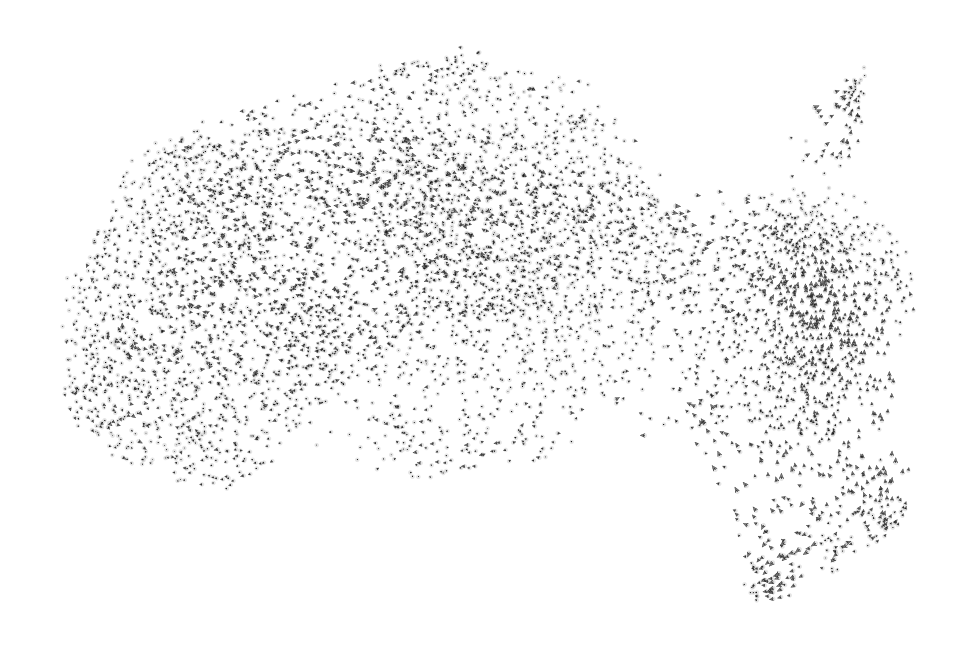

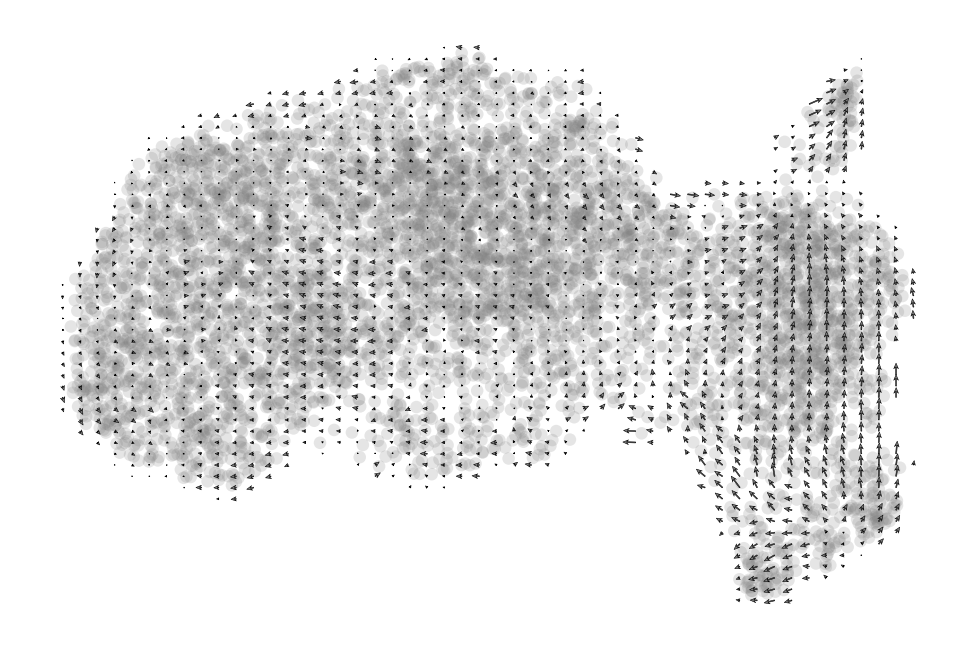

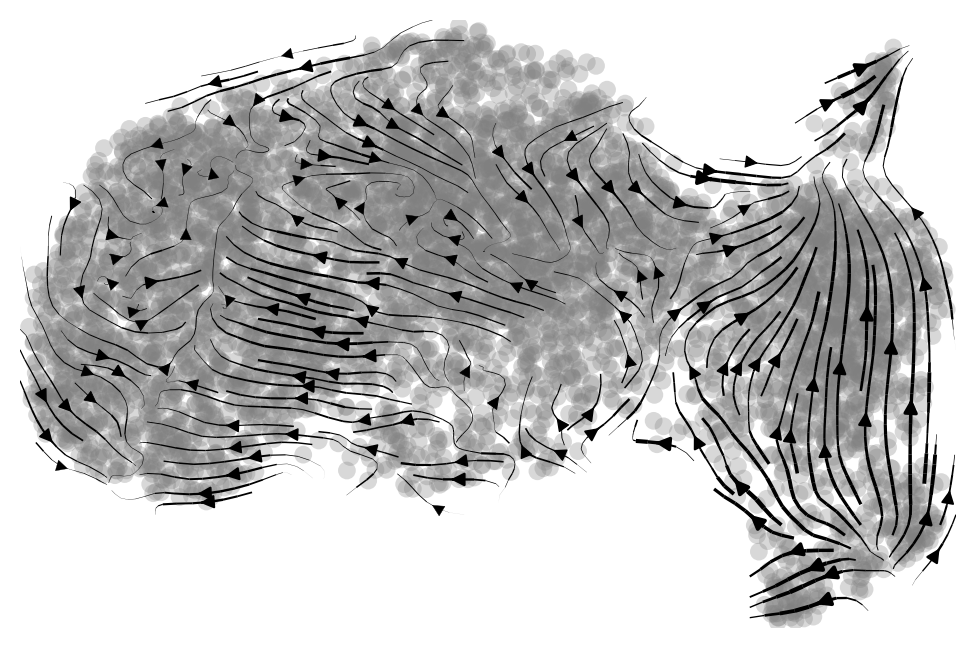

In [26]:
# local+global; better than tSNE?
## to identify differentiation paths or stable terminal states.
scv.pl.velocity_embedding(adata, basis='umap')
scv.pl.velocity_embedding_grid(adata, basis='umap')
scv.pl.velocity_embedding_stream(adata, basis='umap')

In [27]:
import pandas as pd
# This is seurat clusters from previous analysis notebook that I run. 
df = pd.read_csv("seurat_clusters_patient3.csv")  # Should have all cluster assignments
cellid_to_cluster = dict(zip(df['CellID'], df['Cluster']))  # All clusters, all cells assigned in Seurat
# Now building the full list for adata,unknown if not found
ordered_cluster_labels = [cellid_to_cluster.get(cid, 'Unknown') for cid in adata.obs_names]
#added here as ClusterName
adata.obs['ClusterName'] = ordered_cluster_labels

In [28]:
adata.obs['ClusterName'] = adata.obs['ClusterName'].astype('category')

/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-package

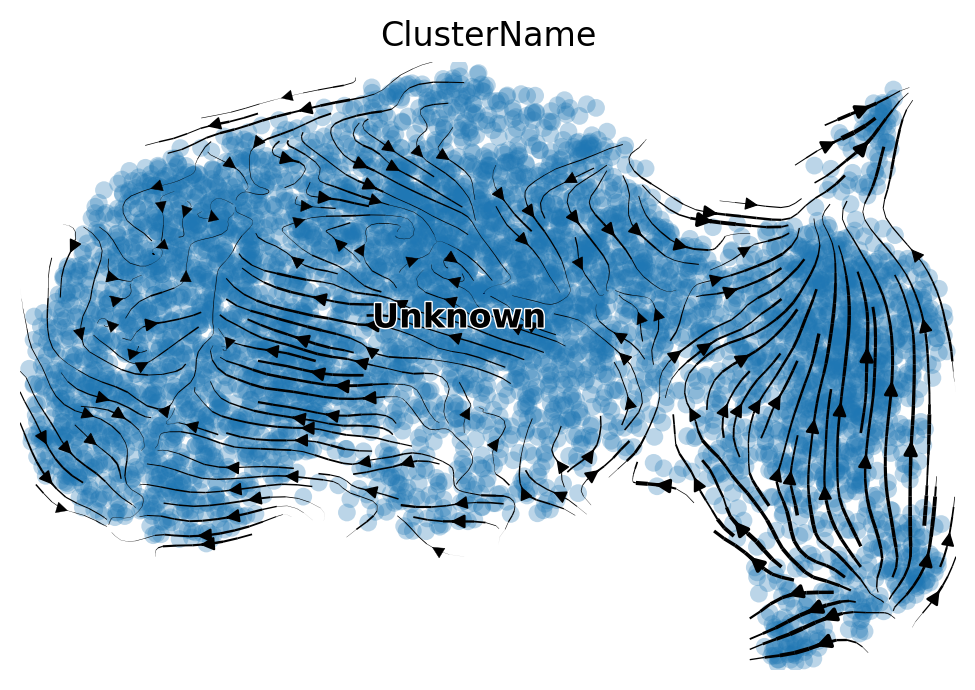

In [29]:
scv.pl.velocity_embedding_stream(
    adata,
    basis='umap',
    color='ClusterName'
)

In [122]:
# cluster names not matching

In [30]:
print(adata.obs['ClusterName'].value_counts())

ClusterName
Unknown    5755
Name: count, dtype: int64


In [31]:
#Seurat
print(df['CellID'].head(10))

0     4100
1     4977
2    11356
3    21277
4    30102
5    41586
6    41975
7    66729
8    71338
9    76819
Name: CellID, dtype: int64


In [32]:
#AnnData
print(adata.obs_names[:10])

Index(['run070:10716173x', 'run070:10859600x', 'run070:10862797x',
       'run070:10418826x', 'run070:10279533x', 'run070:10861766x',
       'run070:10648721x', 'run070:10144944x', 'run070:10268955x',
       'run070:10283218x'],
      dtype='object', name='CellID')


In [33]:
# mismatch found
## Extracting the numeric part from AnnData obs_names to have matching names with seurat cell id
numbers = [x.split(":")[1][:-1] for x in adata.obs_names]
#print(numbers[:10])
#print(df['CellID'].astype(str).head(10)) 
print(df['CellID'].astype(str).head(10).tolist())

['4100', '4977', '11356', '21277', '30102', '41586', '41975', '66729', '71338', '76819']


In [34]:
# Build the mapping: number → cluster
cellid_to_cluster = dict(zip(df['CellID'].astype(str), df['Cluster']))
# Assign cluster labels in AnnData(loom)
adata.obs['ClusterName'] = [cellid_to_cluster.get(num, 'Unknown') for num in numbers]

In [35]:
# Since Seurat ids are integers and cluster names are to be in strings
adata.obs['ClusterName'] = [str(cellid_to_cluster.get(num, 'Unknown')) for num in numbers]

In [36]:
#Assigns a distinct color to each cluster ##stored as 'ClusterName_colors' ## highly meaningful with good clustering and cluster names
clusters = adata.obs['ClusterName'].astype('category').cat.categories
colors = plt.cm.tab20(np.linspace(0, 1, len(clusters)))
adata.uns['ClusterName_colors'] = colors

scv.pl.velocity_embedding_stream(
    adata,
    basis='umap',
    color='ClusterName'
)

/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-package

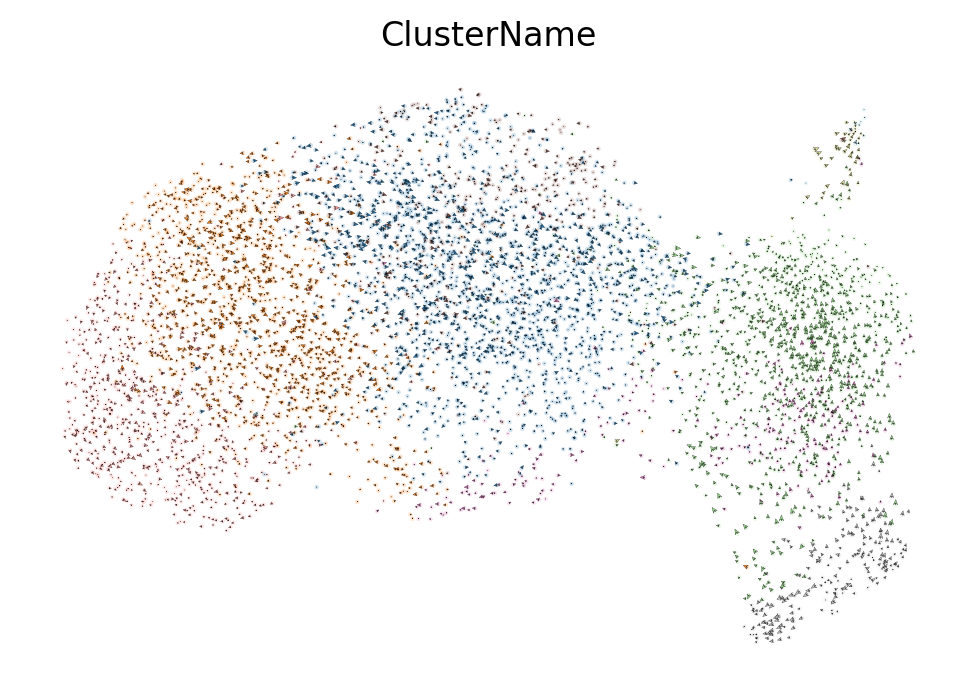

/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-package

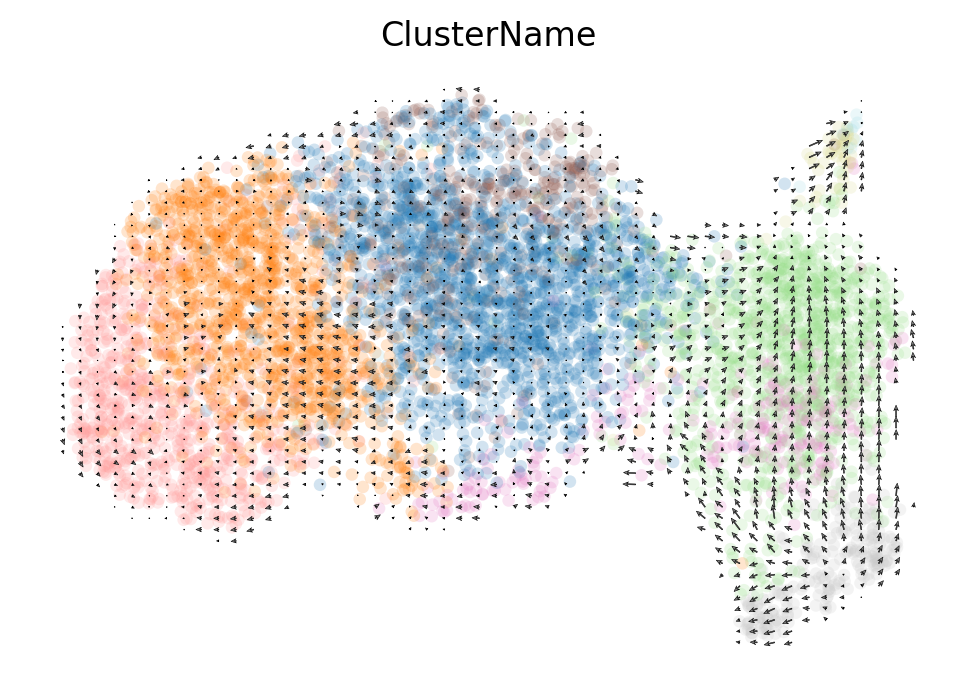

/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-package

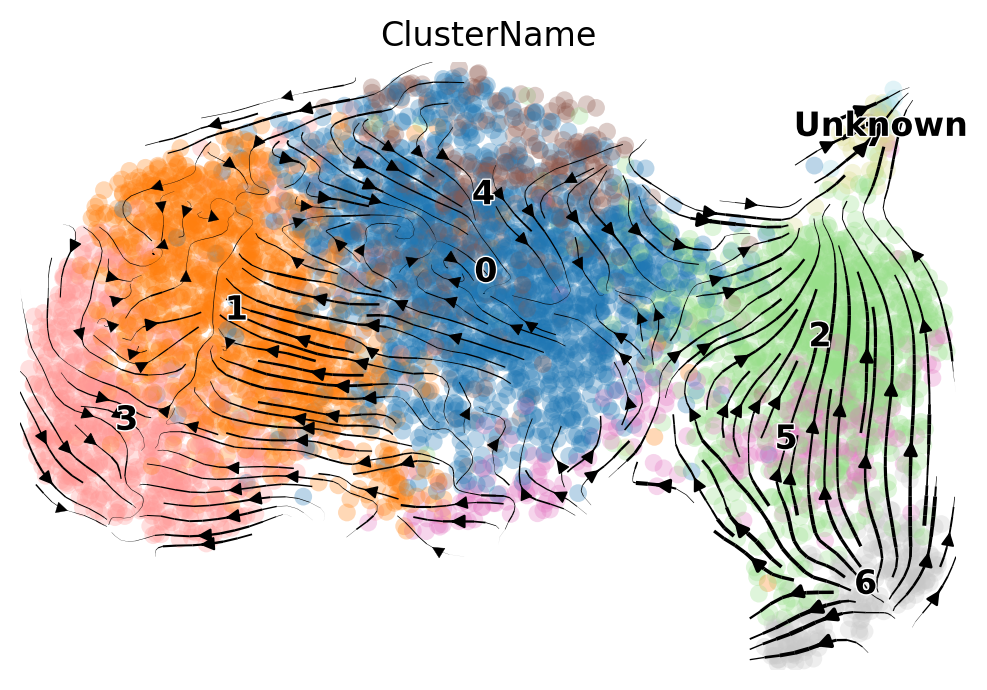

In [37]:
scv.pl.velocity_embedding(adata, basis='umap', color='ClusterName')
scv.pl.velocity_embedding_grid(adata, basis='umap', color='ClusterName')
scv.pl.velocity_embedding_stream(adata, basis='umap', color='ClusterName')

In [38]:
adata

AnnData object with n_obs × n_vars = 5755 × 2000
    obs: 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'ClusterName'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'log1p', 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'umap', 'ClusterName_colors'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

In [39]:
adata.var

,Accession,Chromosome,End,Start,Strand,gene_count_corr,means,dispersions,dispersions_norm,highly_variable,velocity_gamma,velocity_qreg_ratio,velocity_r2,velocity_genes
Gene,,,,,,,,,,,,,,
CCNL2,ENSG00000221978.13,1,1399335,1385711,-,-0.0369,0.137157,-0.386536,-0.666338,True,0.079405,0.079405,-0.720095,False
SSU72,ENSG00000160075.12,1,1574863,1541673,-,0.0216,0.123760,-0.386467,-0.665232,True,0.120893,0.120893,-2.753452,False
GNB1,ENSG00000078369.19,1,1892292,1785285,-,0.0609,0.310685,-0.561854,-0.743957,True,0.140757,0.140757,-1.515444,False
RPL22,ENSG00000116251.11,1,6209389,6185020,-,0.0161,0.146962,-0.210891,1.554159,True,0.109173,0.109173,-0.181184,False
TNFRSF9,ENSG00000049249.10,1,7943165,7915871,-,0.0392,0.138565,-0.136568,3.392300,True,0.092766,0.148083,0.399183,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RPL10,ENSG00000147403.18,X,154409168,154389955,+,0.0754,0.292746,-0.408958,0.640273,True,0.053638,0.053638,0.000607,False
ZFY,ENSG00000067646.12,Y,2982506,2935281,+,-0.0047,0.042949,-0.293330,0.428457,True,0.518914,0.518914,-0.475152,False
PRKY,ENSG00000099725.14,Y,7381548,7273972,+,-0.0180,0.054383,-0.044510,4.789752,True,0.375943,0.375943,-0.638008,False


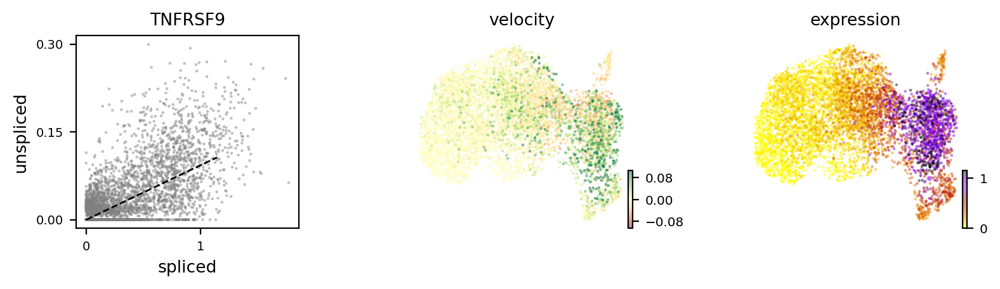

In [40]:
# TNFRSF9 - immunity gene
scv.pl.velocity(adata, ['TNFRSF9'])

Grey spliced-unspliced plot tells that TNFRSF9 is being upregulated due to higher unspliced cells
Velocity graph points out that some cells are having positive velocity - green color (accumulated at the right side) which all together says that it is transitioning into an activated immune state. Regions with negative velocity may be downregulating, returning to a resting state.

Now these can be compared to clusters to understand which cells(from the cluster names) are main drivers for this activation. This can then be linked to cell activation, exhaustion, or differentiation. In my case however, cluster names are just numbers.

In [41]:
# to identify important genes according to clusters present in the object. This adds a new column in the object - rank_velocity_genes
# ig min_corr should be like 0.5
scv.tl.rank_velocity_genes(adata, groupby='ClusterName', min_corr=.3)
df = pd.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/tools/utils.py:463: DeprecationWarning: Please use `rankdata` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import rankdata


,0,1,2,3,4,5,6,7,Unknown
0,MAP3K8,SNED1,RYR2,SCML1,ACTG1,TSHZ2,SMC4,SNX9,TOX
1,HNRNPLL,RPS4X,DTHD1,TESPA1,PRF1,NEBL,HLA-DQA1,RYR2,HSP90AA1
2,CEMIP2,CREM,PON2,IL7R,CREM,MIR155HG,MIR155HG,TOX,CEMIP2
3,PABPC1,TESPA1,ETV1,SNED1,HSPH1,RYR2,PRDM1,CEMIP2,ITGAE
4,SMCHD1,NR4A2,LRRN3,KRT72,FTH1,CDK6,LYST,CBLB,GOLIM4


In [42]:
# top 5 genes
adata.uns['rank_velocity_genes']['names'][:5]

rec.array([('MAP3K8', 'SNED1', 'RYR2', 'SCML1', 'ACTG1', 'TSHZ2', 'SMC4', 'SNX9', 'TOX'),
           ('HNRNPLL', 'RPS4X', 'DTHD1', 'TESPA1', 'PRF1', 'NEBL', 'HLA-DQA1', 'RYR2', 'HSP90AA1'),
           ('CEMIP2', 'CREM', 'PON2', 'IL7R', 'CREM', 'MIR155HG', 'MIR155HG', 'TOX', 'CEMIP2'),
           ('PABPC1', 'TESPA1', 'ETV1', 'SNED1', 'HSPH1', 'RYR2', 'PRDM1', 'CEMIP2', 'ITGAE'),
           ('SMCHD1', 'NR4A2', 'LRRN3', 'KRT72', 'FTH1', 'CDK6', 'LYST', 'CBLB', 'GOLIM4')],
          dtype=[('0', '<U50'), ('1', '<U50'), ('2', '<U50'), ('3', '<U50'), ('4', '<U50'), ('5', '<U50'), ('6', '<U50'), ('7', '<U50'), ('Unknown', '<U50')])

In [43]:
# This info can be used to compare between two or more conditions to see directionality like in the docu. example (Ngn3 high EP (yellow) to Pre-endocrine (orange) to Beta (green).)

In [44]:
# Cell cycle detection
## Cell cycle detected by RNA velocity, is biologically affirmed by cell cycle scores (standardized scores of mean expression levels of phase marker genes).

In [123]:
#The phase markers available through this are S and G2
## Based on known gene sets
### This confirms that observed transitions might reflect proliferation phases

/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-package

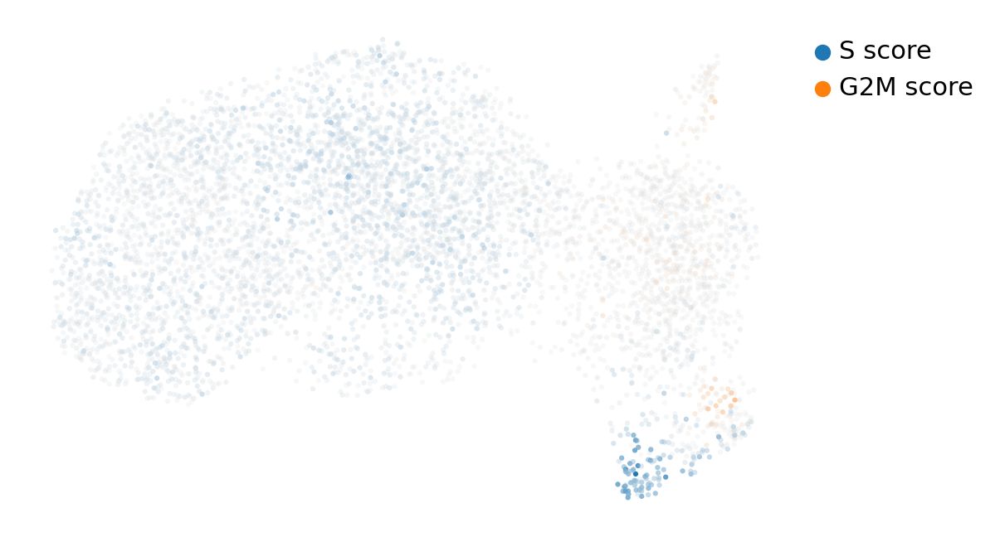

In [45]:
scv.tl.score_genes_cell_cycle(adata)
scv.pl.scatter(adata, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])

In [46]:
adata.obs['phase']

CellID
run070:10716173x      S
run070:10859600x     G1
run070:10862797x    G2M
run070:10418826x      S
run070:10279533x    G2M
                   ... 
run070:9847626x       S
run070:9804041x      G1
run070:9691523x      G1
run070:9701262x     G2M
run070:9838610x     G2M
Name: phase, Length: 5755, dtype: category
Categories (3, object): ['G1', 'G2M', 'S']

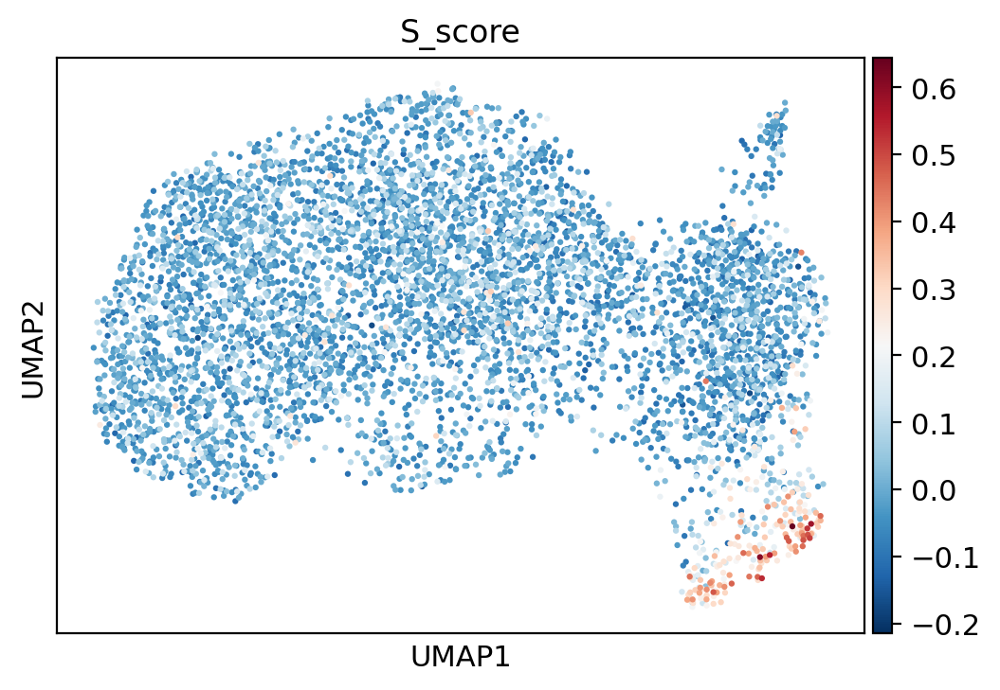

In [47]:
sc.pl.umap(adata, color='S_score') 

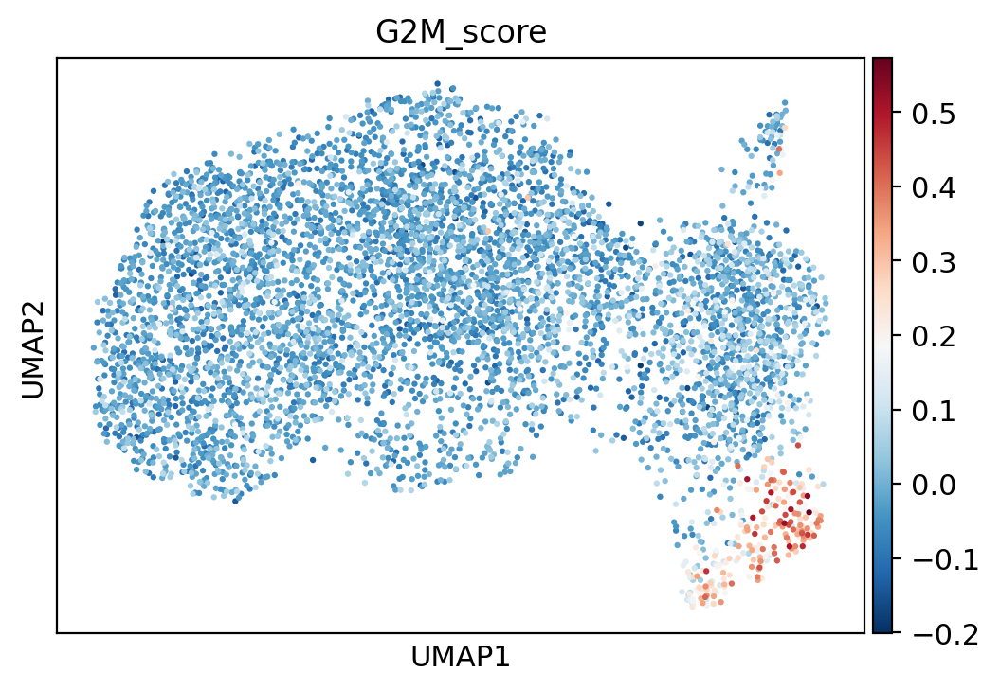

In [48]:
sc.pl.umap(adata, color='G2M_score') 

In [49]:
# These regions had low gene exp. for TNF immune gene

In [50]:
# velocity vector
## speed = length of vector
### coherence (how a velocity vector correlates with its neighboring velocities) - confidence measure

/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-package

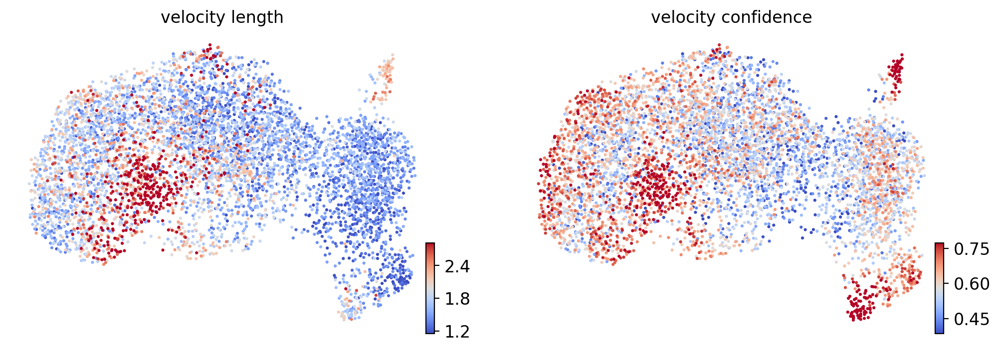

In [51]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

In [52]:
# confidence rel. high for most regions
# Cells with higher velocity length are likely in active transition states, cells in blue in mature state
# regions with high score in both (red) can be candidates for start/end/branching point in differentiation

In [53]:
keys = ['velocity_length', 'velocity_confidence'] # changing to list
df = adata.obs.groupby('ClusterName')[keys].mean().T
#df.style.background_gradient(cmap='coolwarm', axis=1)
df.head()

ClusterName,0,1,2,3,4,5,6,7,Unknown
velocity_length,1.683184,2.079702,1.445695,1.953450,1.720640,1.535572,1.466056,2.136667,1.966875
velocity_confidence,0.540151,0.609407,0.548232,0.628122,0.527115,0.535005,0.732649,0.748321,0.685853


In [54]:
# matches the plots

/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-package

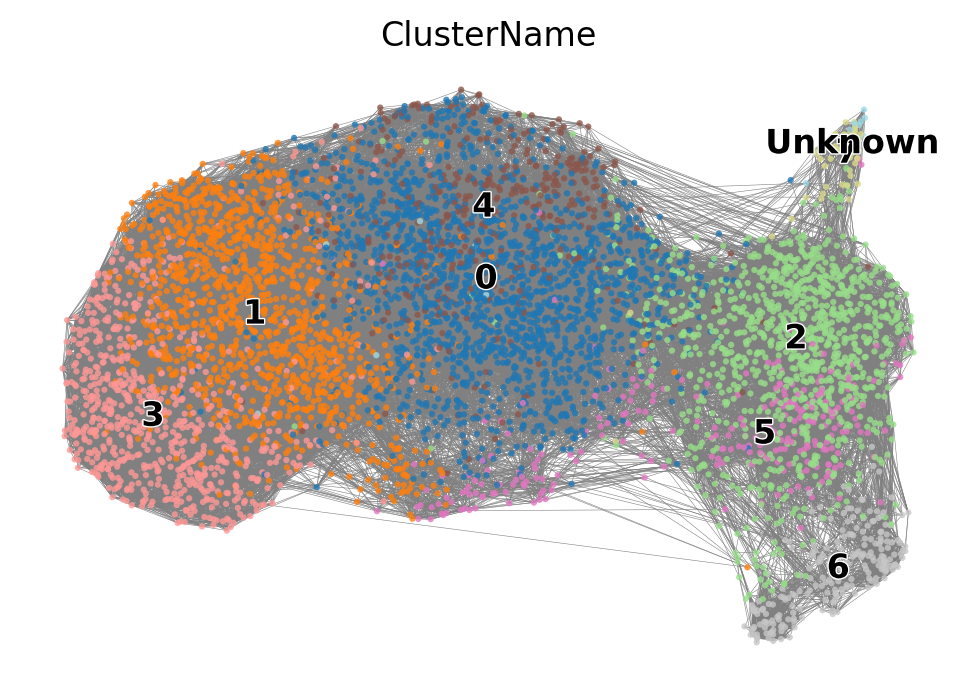

In [55]:
scv.pl.velocity_graph(adata, basis='umap', color='ClusterName')

/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-package

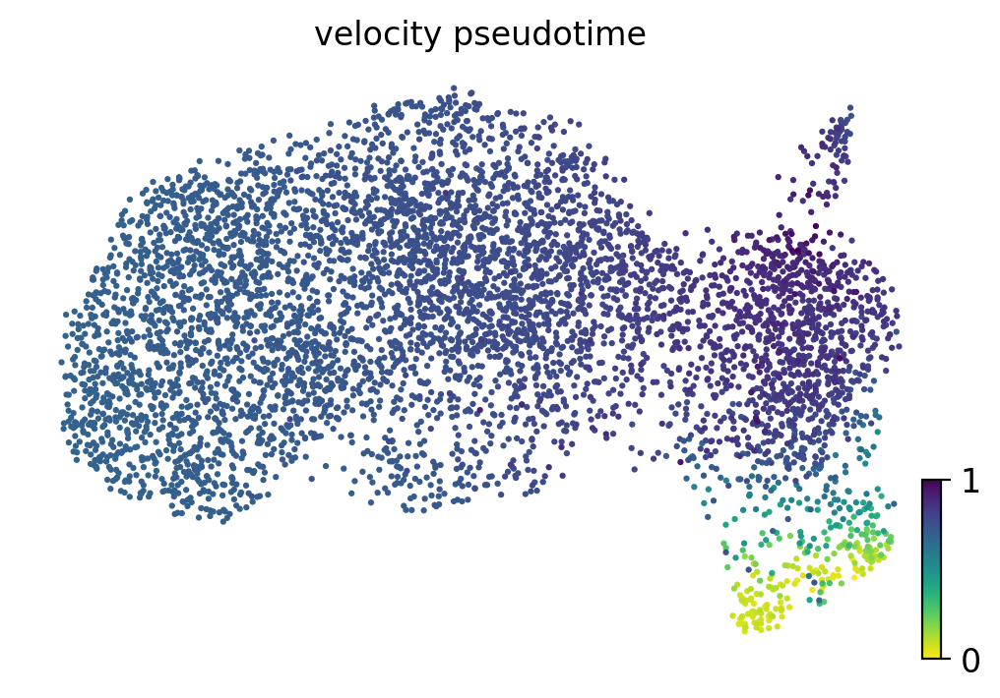

In [56]:
# Pseudo-temporal order based on velocity vectors
## This is good for tracking lineage progression without known timepoints
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', basis='umap')

In [57]:
# cluster 6 the earliest, cluster 2 & possibly 5 the latest

In [58]:
gene = 'TNFRSF9'
gene_expr = adata[:, gene].X

# If gene_expr is sparse, convert to dense array
if not isinstance(gene_expr, np.ndarray):
    gene_expr = gene_expr.toarray()

# Flatten to 1D
gene_expr = gene_expr.flatten()

# Filter
expressed_cells = np.where(gene_expr > 0)[0]
print(expressed_cells)

[  25   28   29   52   67   68   72   74   77   85   87   93  102  112
  130  131  137  138  140  147  150  153  164  168  184  186  191  196
  198  205  207  212  216  220  221  233  236  243  251  253  255  262
  275  279  282  285  308  312  314  316  321  338  340  341  345  347
  350  354  356  363  377  378  385  398  410  416  418  422  427  428
  433  435  438  448  450  453  454  467  476  486  513  517  525  530
  547  555  563  568  569  572  585  594  597  600  604  609  616  618
  628  633  636  646  655  659  663  669  676  682  687  722  724  727
  735  746  747  752  765  767  773  776  779  782  786  787  788  789
  794  796  797  807  821  825  832  837  842  845  846  851  854  856
  860  861  862  868  872  886  899  927  929  932  934  937  953  954
  958  959  962  964  968  977  981 1010 1014 1018 1026 1028 1029 1036
 1038 1041 1043 1044 1046 1050 1057 1059 1060 1064 1069 1075 1083 1092
 1104 1105 1106 1107 1109 1126 1128 1129 1132 1134 1137 1139 1142 1144
 1146 

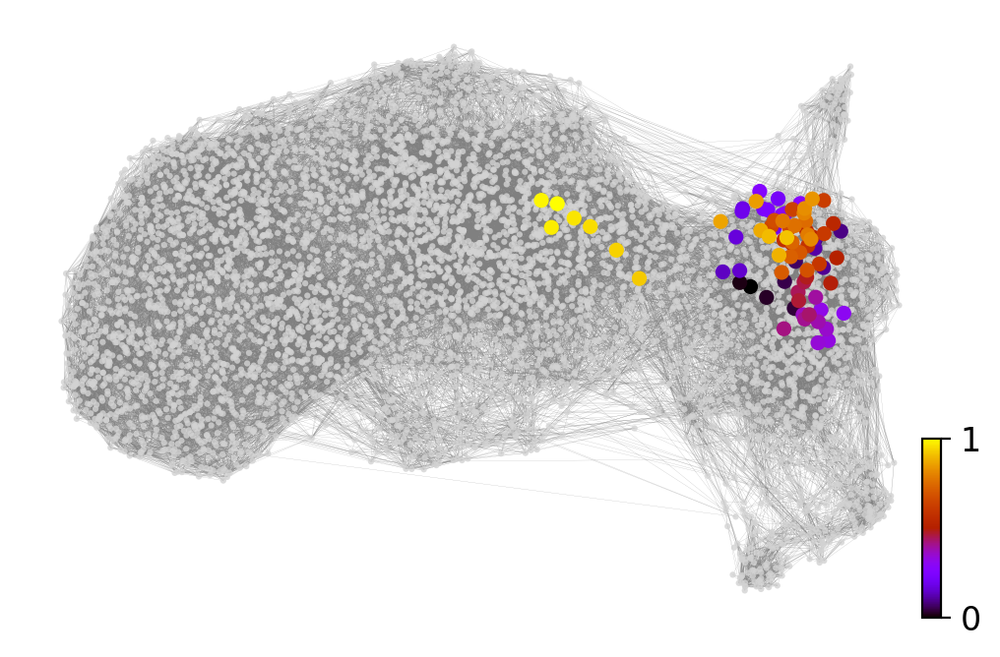

In [59]:
# choosing 25 as the starting point
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=25)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)
# this is the way for specific lineage exploration manually

/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-package

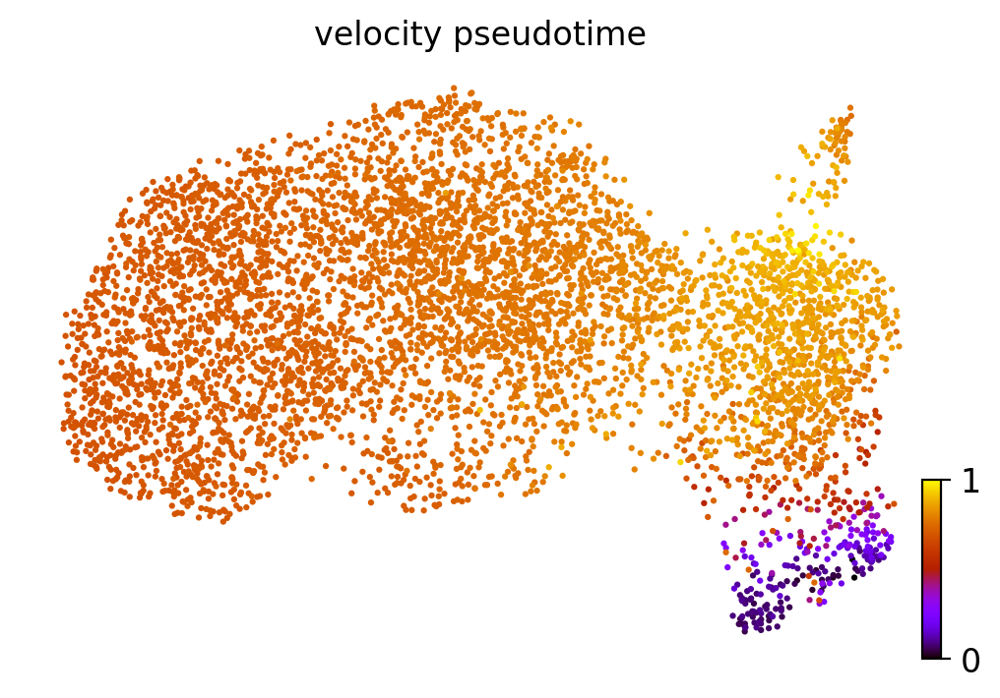

In [60]:
# Velocity pseudotime ag. with diff. color palette
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

In [61]:
# as expected from previous res.

In [62]:
#scv.tl.paga(adata, groups='ClusterName')
#df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
#df.style.background_gradient(cmap='Blues').format('{:.2g}')

In [63]:
adata.obs.columns

Index(['initial_size_unspliced', 'initial_size_spliced', 'initial_size',
       'n_counts', 'velocity_self_transition', 'ClusterName', 'S_score',
       'G2M_score', 'phase', 'clusters_gradients', 'velocity_length',
       'velocity_confidence', 'velocity_confidence_transition', 'root_cells',
       'end_points', 'velocity_pseudotime'],
      dtype='object')

In [64]:
sc.tl.leiden(adata, resolution=1.0)

In [65]:
adata

AnnData object with n_obs × n_vars = 5755 × 2000
    obs: 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'ClusterName', 'S_score', 'G2M_score', 'phase', 'clusters_gradients', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score'
    uns: 'log1p', 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'umap', 'ClusterName_colors', 'rank_velocity_genes', 'clusters_gradients_colors', 'leiden'
    obsm: 'X_pca', 'X_umap', 'velocity_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', '

In [66]:
adata.obs['ClusterName']

CellID
run070:10716173x    1
run070:10859600x    3
run070:10862797x    0
run070:10418826x    2
run070:10279533x    0
                   ..
run070:9847626x     2
run070:9804041x     0
run070:9691523x     0
run070:9701262x     2
run070:9838610x     0
Name: ClusterName, Length: 5755, dtype: category
Categories (9, object): ['0', '1', '2', '3', ..., '5', '6', '7', 'Unknown']

In [67]:
adata.obs['leiden']

CellID
run070:10716173x    3
run070:10859600x    4
run070:10862797x    1
run070:10418826x    0
run070:10279533x    1
                   ..
run070:9847626x     0
run070:9804041x     8
run070:9691523x     2
run070:9701262x     0
run070:9838610x     1
Name: leiden, Length: 5755, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

In [124]:
# leiden is same as imported cluster info. 

In [68]:
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

scv.tl.paga(adata, groups='ClusterName')
df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
#df.style.background_gradient(cmap='Blues').format('{:.2g}')
df.head()

/tmp/ipykernel_28235/2328126940.py:5: DeprecationWarning: `get_df` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please `AnnData::get_df` or Scanpy's `scanpy.get.obs_df` or `scanpy.get.var_df`.
  df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/core/_anndata.py:257: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if is_categorical_dtype(data.obs[key])


,0,1,2,3,4,5,6,7,Unknown
0,0.00,0.00,0.22,0.0,0.0,0.0,0.0,0.0,0.0
1,0.57,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0
2,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0
3,0.00,0.66,0.00,0.0,0.0,0.0,0.0,0.0,0.0
4,0.63,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0


**PAGA (Partition-based Graph Abstraction) estimates transition probabilities between clusters**
**It visualizes macro-level dynamics**

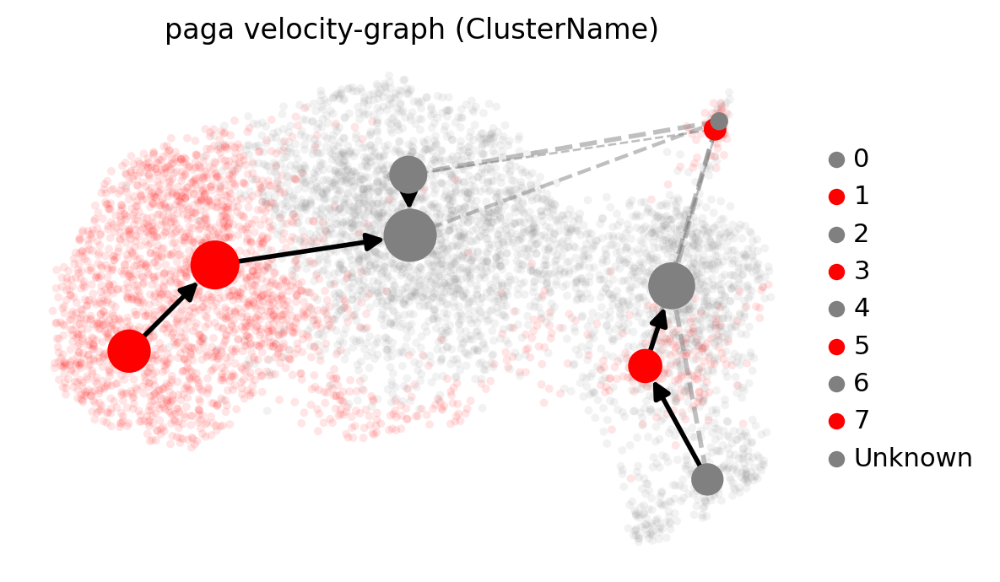

In [118]:
warnings.filterwarnings("ignore")
scv.pl.paga(adata, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)
# alternating colors for contrst

In [70]:
# Dynamic modelling

In [71]:
print(scv.__version__)

0.3.3


In [72]:
scv.settings.verbosity = 0  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.settings.set_figure_params('scvelo')  # for beautified visualization

In [73]:
# full transcriptional dynamics of splicing kinetics.
## aims to learn the unspliced/spliced phase trajectory for each gene. ### more reliable than deter., stoch. & suit highly complex sys.

In [74]:
scv.tl.recover_dynamics(adata) #imp

In [75]:
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)

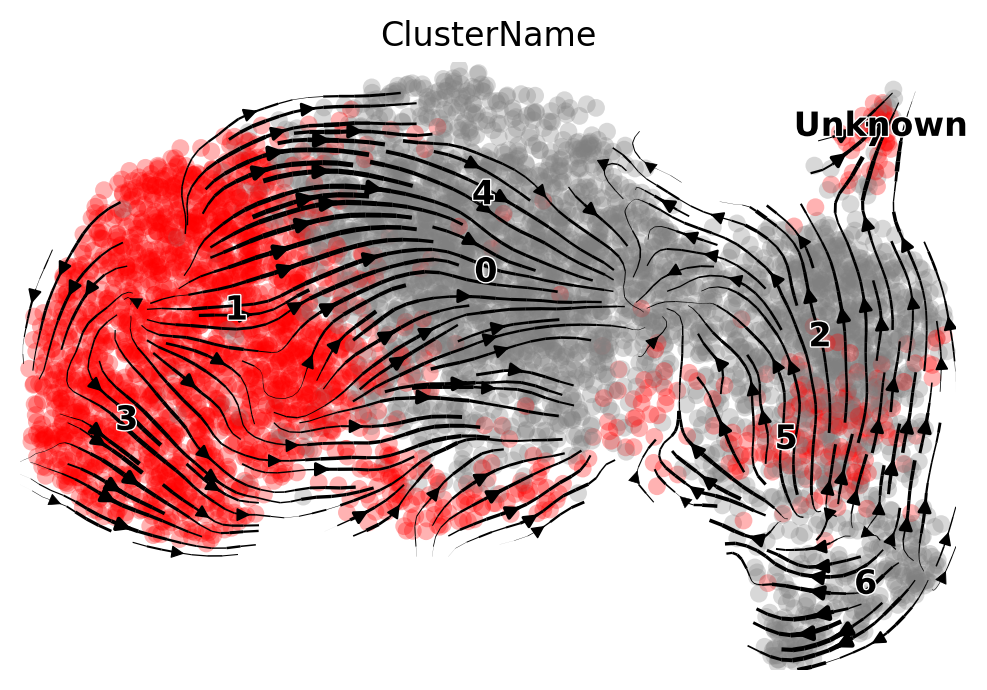

In [117]:
warnings.filterwarnings("ignore")
scv.pl.velocity_embedding_stream(adata, basis='umap', color='ClusterName')

In [77]:
adata

AnnData object with n_obs × n_vars = 5755 × 2000
    obs: 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'ClusterName', 'S_score', 'G2M_score', 'phase', 'clusters_gradients', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'leiden'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'spearmans_score', 'velocity_score', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling', 'fit_std_u', 'fit_std_s', 'fit_likelihood', 'fit_u0', 'fit_s0', 'fit_pval_steady', 'fit_steady_u', 'fit_steady_s', 'fit_variance', 'fit_alignment_scaling', 'fit_r2'
    uns: 'log1p', 'pca', 'neighbors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'umap', 'ClusterName_colors', 'rank_velocity_genes

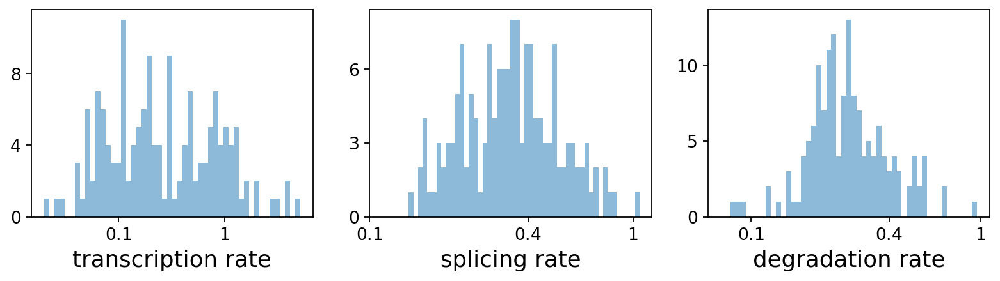

/tmp/ipykernel_28235/3820672420.py:11: DeprecationWarning: `get_df` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please `AnnData::get_df` or Scanpy's `scanpy.get.obs_df` or `scanpy.get.var_df`.
  scv.get_df(adata, 'fit*', dropna=True).head()


,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,fit_r2
Gene,,,,,,,,,,,,,,,,
TNFRSF9,0.75,4.08,0.48,5.44,0.07,0.05,0.35,0.29,0.0,0.0,0.42,0.13,0.78,0.59,1.60,0.52
JUN,0.05,0.15,0.19,14.65,2.31,0.11,0.06,0.19,0.0,0.0,0.26,0.40,0.20,1.46,3.61,0.12
PTPN22,0.11,0.57,0.13,14.30,0.52,0.08,0.19,0.17,0.0,0.0,0.43,0.29,0.50,1.06,4.15,0.10
RNF115,0.12,0.86,0.20,10.72,0.48,0.05,0.13,0.19,0.0,0.0,0.34,0.15,0.41,1.35,2.88,0.25
ANP32E,0.24,3.05,0.22,7.20,0.15,0.02,0.16,0.21,0.0,0.0,0.46,0.06,0.74,0.71,2.57,0.10


In [78]:
# Rate Histograms
## Kinetic rates
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()
# Helps detect fast vs. slow processing genes

In [82]:
# Most rates are intermediate, but some genes process much more rapidly/slowly
##  rates of transription (fit_alpha), splicing (fit_beta), degradation (fit_gamma)

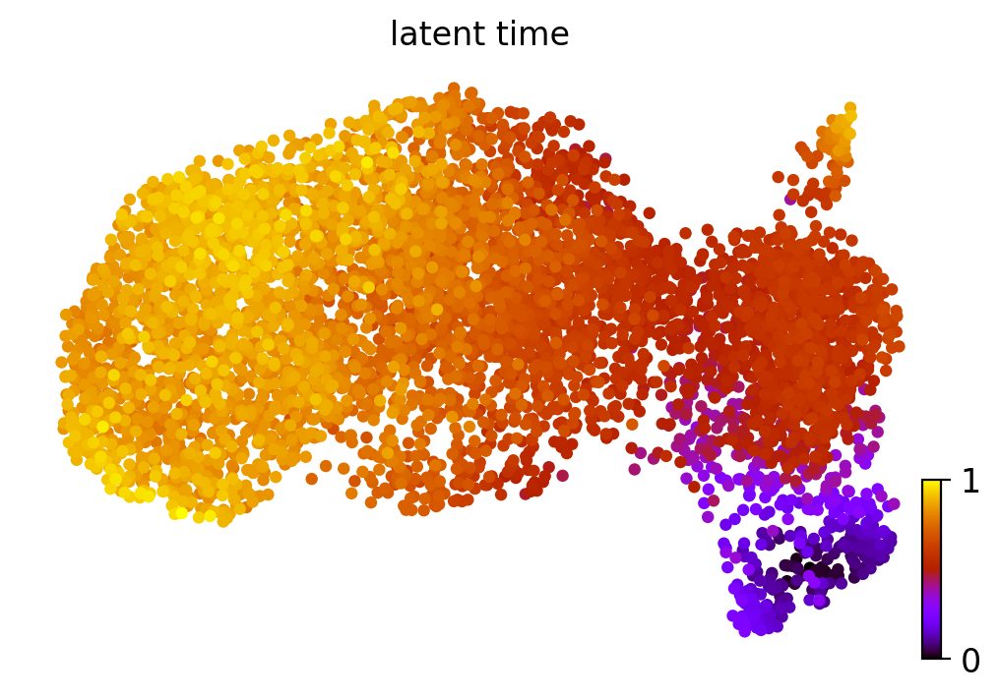

In [115]:
warnings.filterwarnings("ignore")
# Latent time is a continuous measure of transcriptional progression, doesn't req. root selection
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)
# High biological interpretability

##### this is different from pseudotime in that no cell is selected to begin with as root/branch

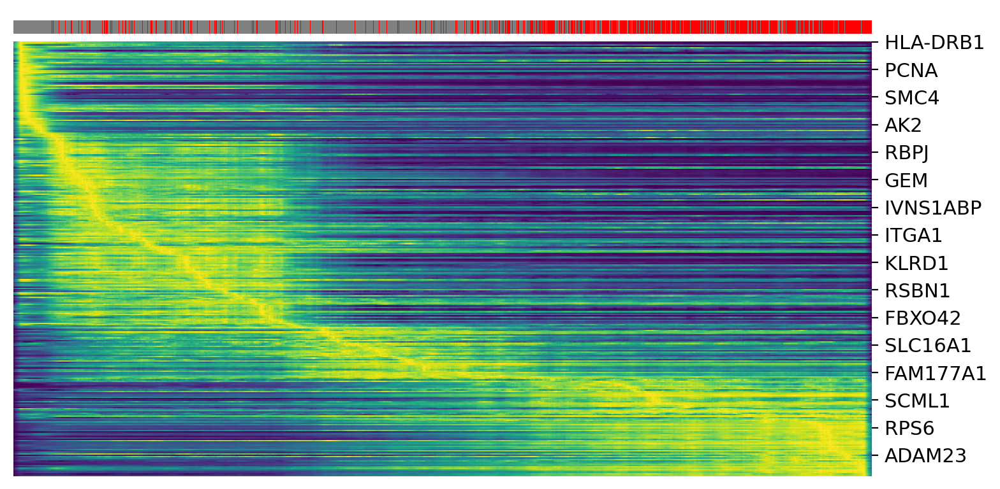

In [116]:
warnings.filterwarnings("ignore")
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='ClusterName', n_convolve=100)

In [85]:
# HLA-DRB1 - Major histocompatibility complex II
# GEM - GTP-binding protein
# SCML1 - Polycomb protein

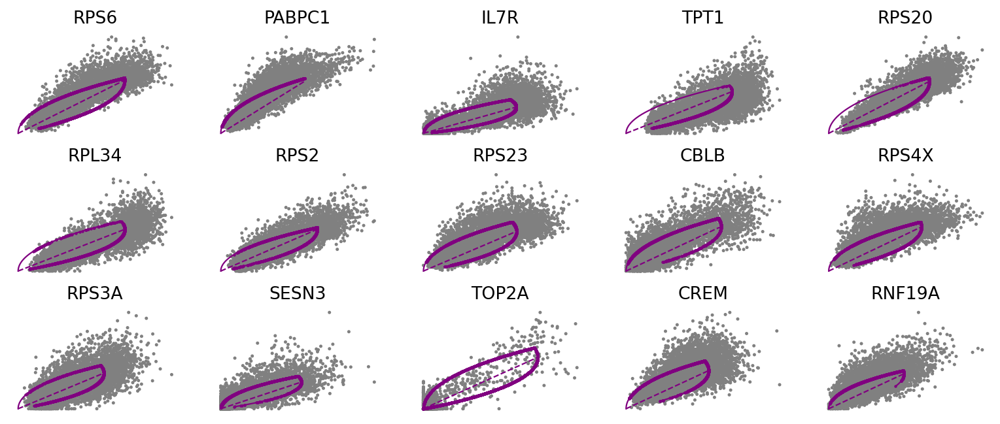

In [86]:
# top genes

top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, frameon=False)

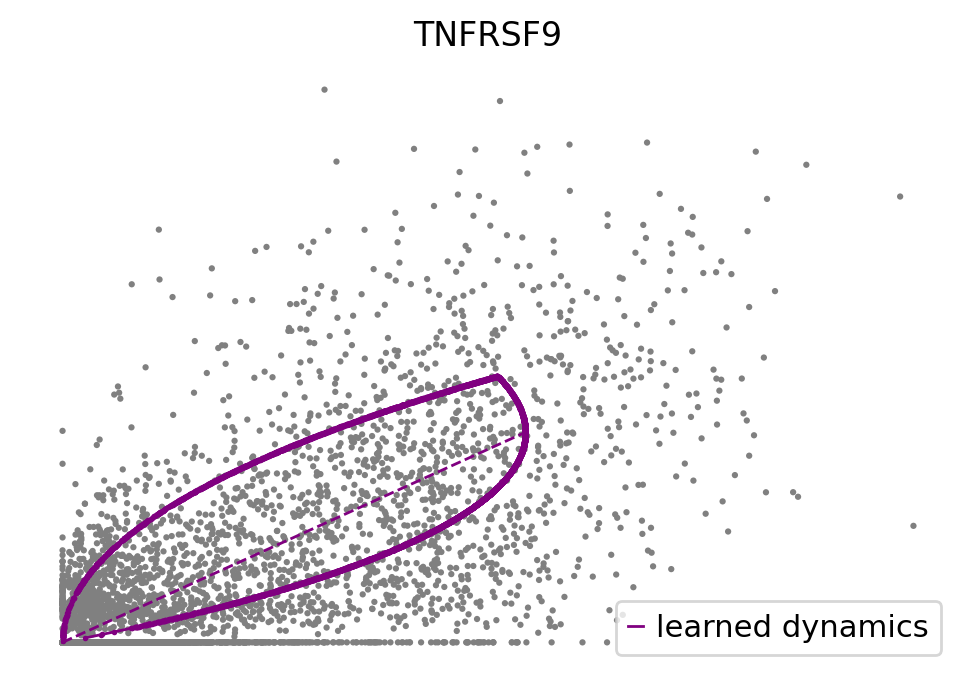

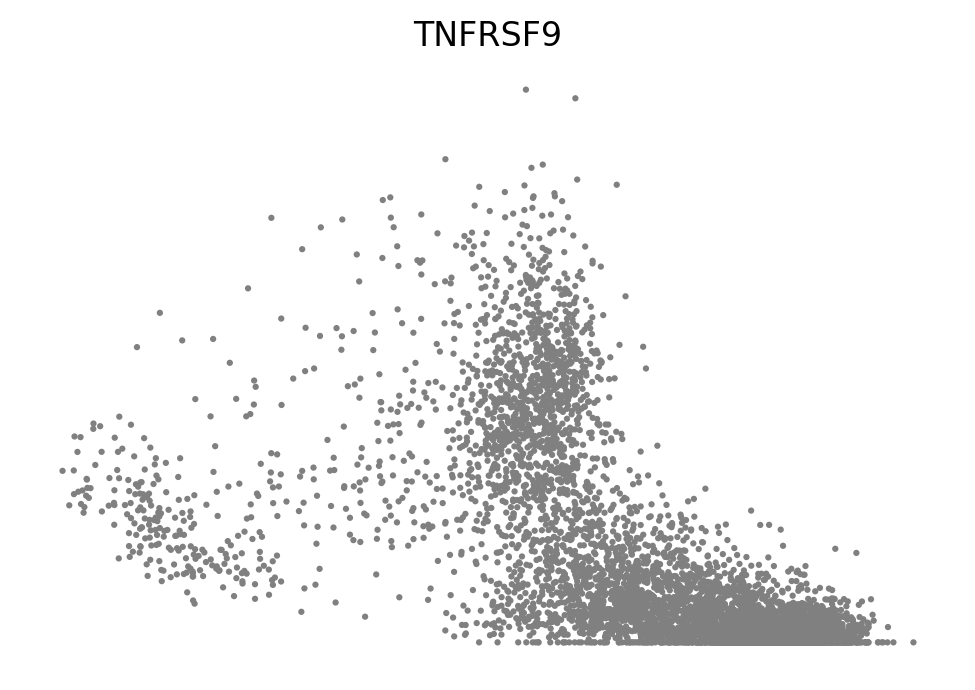

In [87]:
var_names = ['TNFRSF9']
scv.pl.scatter(adata, var_names, frameon=False)
scv.pl.scatter(adata, x='latent_time', y=var_names, frameon=False)

In [88]:
# cluster specific top genes
scv.tl.rank_dynamical_genes(adata, groupby='ClusterName')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)

/tmp/ipykernel_28235/3189376055.py:3: DeprecationWarning: `get_df` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please `AnnData::get_df` or Scanpy's `scanpy.get.obs_df` or `scanpy.get.var_df`.
  df = scv.get_df(adata, 'rank_dynamical_genes/names')
/opt/conda/envs/velocyto_stablepy/lib/python3.10/site-packages/scvelo/core/_anndata.py:257: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if is_categorical_dtype(data.obs[key])


,0,1,2,3,4,5,6,7,Unknown
0,RPS2,PABPC1,RPS6,RPS20,RPS2,RPS2,RPS6,PRDM1,TPT1
1,RPS20,RPS6,CREM,RPL34,PABPC1,PABPC1,RPS23,SMCHD1,SORL1
2,CBLB,RPL34,CBLB,TPT1,RPS4X,RPS23,RPS4X,LAYN,PABPC1
3,RPS4X,RPS20,RPS20,RPS4X,RPS6,RPS6,RPS3A,IRAG2,RPS4X
4,RPS6,RPS23,HSPA8,RPS6,RNF19A,RPS4X,TOP2A,RNF19A,RPS29


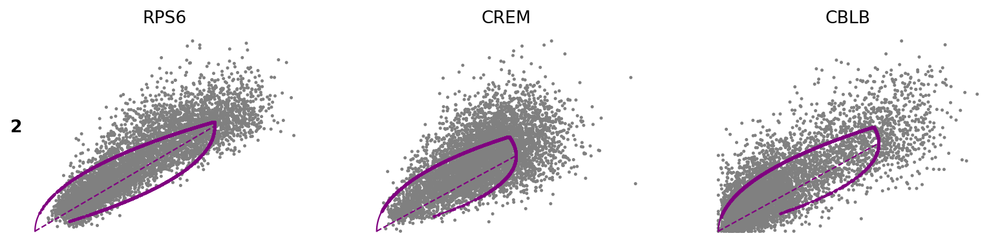

In [106]:
clusters = adata.obs['ClusterName'].unique()[3] # cluster 2 only
for cluster in clusters:
    scv.pl.scatter(adata, df[cluster][:3], ylabel=cluster, frameon=False)

#scv.pl.scatter(adata, color='ClusterName', groups=['2'], palette=['grey', 'red'], frameon=False)


In [107]:
#dynamical model can also be used to perform a likelihood-ratio test for differential kinetics study

In [109]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:100]
# This tests whether kinetic parameters significantly differ between clusters
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='ClusterName')
## reveals cluster specific regulation dynamics, even if expression levels are similar

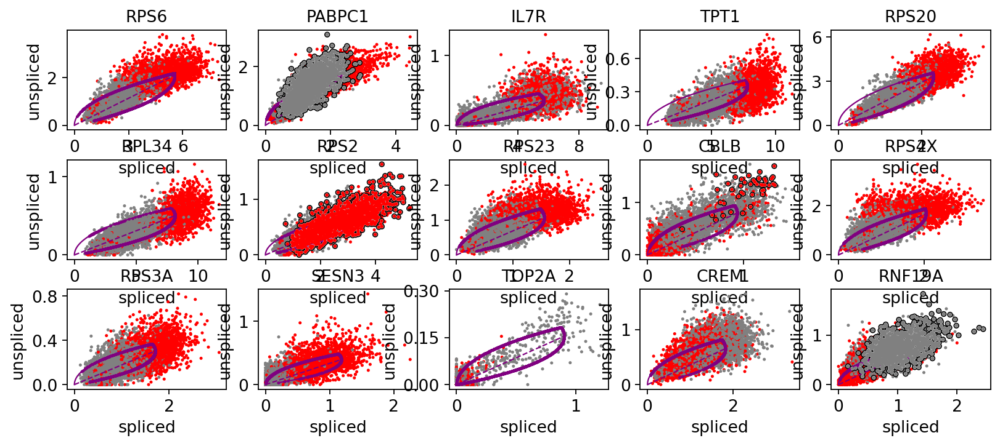

In [119]:
#warnings.filterwarnings("ignore")
# purple color is based on dynamic modelling. It is the estimated kinetic phase trajectories
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, add_outline='fit_diff_kinetics')

In [114]:
# Interpretation - 
# Diff. kinetics != Diff. exp.
## eg - IL7R: Immune related; dynamic shifts here could reflect activation/suppression within immune clusters
### Key here is cluster specific regulatory programs

In [113]:
# This diff. kinetics can then be used to adjust rna velocity

##### Differential kinetics